<a href="https://colab.research.google.com/github/hailuu684/PTv3-distill/blob/hai/plot_stuffs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

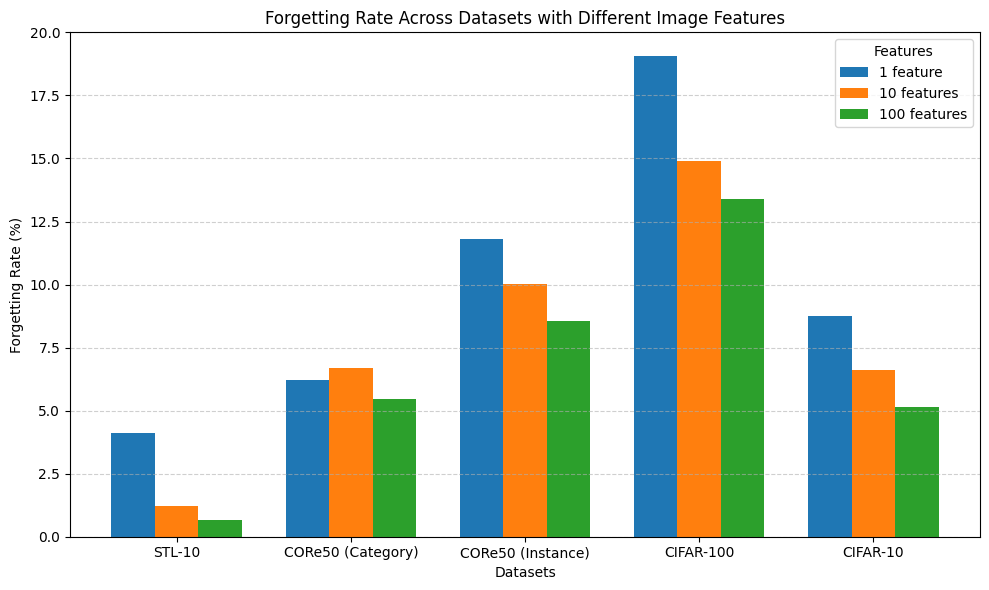

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data for the plot
datasets = ["STL-10", "CORe50 (Category)", "CORe50 (Instance)", "CIFAR-100", "CIFAR-10"]
feature_counts = ["1 feature", "10 features", "100 features"]

# Corresponding forgetting rates, organized by feature counts for each dataset
forgetting_rates = [
    [4.13, 1.23, 0.65],  # STL-10
    [6.20, 6.70, 5.47],  # CORe50 Category
    [11.82, 10.02, 8.56], # CORe50 Instance
    [19.05, 14.90, 13.41], # CIFAR-100
    [8.74, 6.61, 5.14]   # CIFAR-10
]

# Colors for each feature count
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']  # Blue, Orange, Green

# Set up the x positions
x = np.arange(len(datasets))

# Width of the bars
bar_width = 0.25

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting each set of bars
for i, (color, feature) in enumerate(zip(colors, feature_counts)):
    # Position bars with a slight offset for each feature count
    ax.bar(x + i * bar_width, [rate[i] for rate in forgetting_rates], bar_width, label=feature, color=color)

# Labeling and title
ax.set_xlabel("Datasets")
ax.set_ylabel("Forgetting Rate (%)")
ax.set_title("Forgetting Rate Across Datasets with Different Image Features")
ax.set_xticks(x + bar_width)
ax.set_xticklabels(datasets)
ax.legend(title="Features")

# Add grid
ax.grid(axis='y', linestyle='--', alpha=0.6)

# Save and show the plot
plt.tight_layout()
plt.savefig('forgetting_rate_grouped_bar_plot.png')
plt.show()


# Download tiny imagenet

In [ ]:
# Retrieve data directly from Stanford data source
!wget http://cs231n.stanford.edu/tiny-imagenet-200.zip
!unzip -qq 'tiny-imagenet-200.zip'



--2024-12-04 08:26:08--  http://cs231n.stanford.edu/tiny-imagenet-200.zip
Resolving cs231n.stanford.edu (cs231n.stanford.edu)... 171.64.64.64
Connecting to cs231n.stanford.edu (cs231n.stanford.edu)|171.64.64.64|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://cs231n.stanford.edu/tiny-imagenet-200.zip [following]
--2024-12-04 08:26:08--  https://cs231n.stanford.edu/tiny-imagenet-200.zip
Connecting to cs231n.stanford.edu (cs231n.stanford.edu)|171.64.64.64|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248100043 (237M) [application/zip]
Saving to: ‘tiny-imagenet-200.zip’

tiny-imagenet-200.z 100%[===================>] 236.61M  7.84MB/s    in 35s     

2024-12-04 08:26:44 (6.70 MB/s) - ‘tiny-imagenet-200.zip’ saved [248100043/248100043]



In [ ]:
import os
from torch import optim, nn
from torch.utils.data import DataLoader, TensorDataset, Dataset
from torchvision.utils import make_grid
from torchvision import models, datasets
from torchvision import transforms as T
from random import randint

In [ ]:
DATA_DIR = 'tiny-imagenet-200' # Original images come in shapes of [3,64,64]

# Define training and validation data paths
TRAIN_DIR = os.path.join(DATA_DIR, 'train')
VALID_DIR = os.path.join(DATA_DIR, 'val')

In [ ]:
# Functions to display single or a batch of sample images
def imshow(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

def show_batch(dataloader):
    dataiter = iter(dataloader)
    images, labels = dataiter.next()
    imshow(make_grid(images)) # Using Torchvision.utils make_grid function

def show_image(dataloader):
    dataiter = iter(dataloader)
    images, labels = dataiter.next()
    random_num = randint(0, len(images)-1)
    imshow(images[random_num])
    label = labels[random_num]
    print(f'Label: {label}, Shape: {images[random_num].shape}')

In [ ]:
# Setup function to create dataloaders for image datasets
def generate_dataloader(data, name, transform, batch_size=64, use_cuda=False):
    if data is None:
        return None

    # Read image files to pytorch dataset using ImageFolder, a generic data
    # loader where images are in format root/label/filename
    # See https://pytorch.org/vision/stable/datasets.html
    if transform is None:
        dataset = datasets.ImageFolder(data, transform=T.ToTensor())
    else:
        dataset = datasets.ImageFolder(data, transform=transform)

    # Set options for device
    if use_cuda:
        kwargs = {"pin_memory": True, "num_workers": 1}
    else:
        kwargs = {}

    # Wrap image dataset (defined above) in dataloader
    dataloader = DataLoader(dataset, batch_size=batch_size,
                        shuffle=(name=="train"),
                        **kwargs)

    return dataset, dataloader

In [ ]:
preprocess_transform = T.Compose([
                T.Resize(256), # Resize images to 256 x 256
                T.CenterCrop(224), # Center crop image
                T.RandomHorizontalFlip(),
                T.ToTensor(),  # Converting cropped images to tensors
                # T.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5]) #
])

train_dataset, train_loader = generate_dataloader(TRAIN_DIR, "train", transform=preprocess_transform)

In [ ]:
train_dataset[5000][1], len(train_dataset)

(10, 100000)

In [ ]:
# Save class names (for corresponding labels) as dict from words.txt file
class_to_name_dict = dict()
fp = open(os.path.join(DATA_DIR, 'words.txt'), 'r')
data = fp.readlines()
for line in data:
    words = line.strip('\n').split('\t')
    class_to_name_dict[words[0]] = words[1].split(',')[0]
fp.close()

# Display first 20 entries of resulting dictionary
{k: class_to_name_dict[k] for k in list(class_to_name_dict)[:20]}

{'n00001740': 'entity',
 'n00001930': 'physical entity',
 'n00002137': 'abstraction',
 'n00002452': 'thing',
 'n00002684': 'object',
 'n00003553': 'whole',
 'n00003993': 'congener',
 'n00004258': 'living thing',
 'n00004475': 'organism',
 'n00005787': 'benthos',
 'n00005930': 'dwarf',
 'n00006024': 'heterotroph',
 'n00006150': 'parent',
 'n00006269': 'life',
 'n00006400': 'biont',
 'n00006484': 'cell',
 'n00007347': 'causal agent',
 'n00007846': 'person',
 'n00015388': 'animal',
 'n00017222': 'plant'}

In [ ]:
len(train_dataset.classes)

200

In [ ]:
show_batch(train_loader)

AttributeError: '_SingleProcessDataLoaderIter' object has no attribute 'next'

# svhn dataset

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
import torch
from torchvision import datasets, transforms

def get_svhn():
    transform = transforms.Compose([
        # transforms.Resize((args.size, args.size), antialias=True),
        transforms.ToTensor(),
        transforms.Normalize((0.4376821, 0.4437697, 0.47280442), (0.19803012, 0.20101562, 0.19703614))
        # Mean and std for SVHN
    ])

    root = './data'
    train_dataset = datasets.SVHN(root=root, split='train', download=True, transform=transform)
    test_dataset = datasets.SVHN(root=root, split='test', download=True, transform=transform)

    train_length = int(0.7 * len(train_dataset))
    val_length = len(train_dataset) - train_length

    train_dataset, val_dataset = torch.utils.data.random_split(train_dataset,
                                                               lengths=[train_length, val_length])

    def extract_targets(dataset):
        return [sample[1] for sample in dataset]

    # Getting targets for train and val datasets
    train_targets = extract_targets(train_dataset)
    val_targets = extract_targets(val_dataset)

    train_dataset.targets = train_targets
    val_dataset.targets = val_targets

    return train_dataset, val_dataset, test_dataset

In [ ]:
train_dataset, val_dataset, test_dataset = get_svhn()

100%|██████████| 182M/182M [00:11<00:00, 15.5MB/s]


100%|██████████| 64.3M/64.3M [00:09<00:00, 6.64MB/s]


## Get pretrained resnet50

In [ ]:
from torchvision import models
import torch.nn as nn
from torch.utils.data import DataLoader

In [ ]:
# Load Pretrained ResNet50 with Classification Head
def load_pretrained_resnet50(num_classes=10):
    model = models.resnet50(pretrained=True)
    # Replace the final fully connected layer for SVHN (10 classes)
    model.fc = nn.Linear(model.fc.in_features, num_classes)
    model.eval()  # Set the model to evaluation mode
    return model

In [ ]:
resnet50_model = load_pretrained_resnet50(num_classes=10)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
def evaluate_accuracy(model, dataloader, device):
    correct = 0
    total = 0
    with torch.no_grad():  # Disable gradient computation for inference
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)
    accuracy = correct / total
    return accuracy

# Extract Features for DBSCAN
def extract_features(model, dataloader, device):
    features = []
    with torch.no_grad():
        for inputs, _ in dataloader:
            inputs = inputs.to(device)
            output = model(inputs)
            features.append(output.cpu().numpy())
    features = np.vstack(features)  # Combine all batches into a single array
    return features

In [ ]:
# Evaluate accuracy
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

accuracy = evaluate_accuracy(resnet50_model, test_loader, 'cpu')
print(f"Accuracy of ResNet-50 on SVHN: {accuracy * 100:.2f}%")

Accuracy of ResNet-50 on SVHN: 10.58%


In [ ]:
from torchvision.models.feature_extraction import create_feature_extractor

x = torch.rand(1, 3, 224, 224)

model = models.resnet50()

return_nodes = {
    "avgpool": "layer4"
}
model2 = create_feature_extractor(model, return_nodes=return_nodes)
intermediate_outputs = model2(x)

In [ ]:
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
intermediate_outputs['layer4'].squeeze(2).squeeze(2).shape

torch.Size([1, 2048])

# Caltech101 dataset

In [ ]:
from torchvision import transforms, datasets
from collections import defaultdict
import torch

In [ ]:
import requests

url = "https://data.caltech.edu/tindfiles/serve/3138e1922a9139bfa469528edbdc45d0/caltech-101.zip"
output_file = "caltech-101.zip"

response = requests.get(url, stream=True)
with open(output_file, "wb") as f:
    for chunk in response.iter_content(chunk_size=1024):
        if chunk:
            f.write(chunk)

print("Download complete.")

Download complete.


In [ ]:
!unzip /content/caltech-101.zip

Archive:  /content/caltech-101.zip
   creating: caltech-101/
  inflating: __MACOSX/._caltech-101  
  inflating: caltech-101/101_ObjectCategories.tar.gz  
  inflating: __MACOSX/caltech-101/._101_ObjectCategories.tar.gz  
  inflating: caltech-101/show_annotation.m  
  inflating: __MACOSX/caltech-101/._show_annotation.m  
  inflating: caltech-101/Annotations.tar  
  inflating: __MACOSX/caltech-101/._Annotations.tar  


In [ ]:
!tar -xvf /content/101_ObjectCategories.tar.gz

Streaming output truncated to the last 5000 lines.
101_ObjectCategories/chair/image_0005.jpg
101_ObjectCategories/chair/image_0006.jpg
101_ObjectCategories/chair/image_0007.jpg
101_ObjectCategories/chair/image_0008.jpg
101_ObjectCategories/chair/image_0010.jpg
101_ObjectCategories/chair/image_0011.jpg
101_ObjectCategories/chair/image_0012.jpg
101_ObjectCategories/chair/image_0013.jpg
101_ObjectCategories/chair/image_0014.jpg
101_ObjectCategories/chair/image_0016.jpg
101_ObjectCategories/chair/image_0017.jpg
101_ObjectCategories/chair/image_0018.jpg
101_ObjectCategories/chair/image_0019.jpg
101_ObjectCategories/chair/image_0020.jpg
101_ObjectCategories/chair/image_0022.jpg
101_ObjectCategories/chair/image_0023.jpg
101_ObjectCategories/chair/image_0024.jpg
101_ObjectCategories/chair/image_0025.jpg
101_ObjectCategories/chair/image_0026.jpg
101_ObjectCategories/chair/image_0028.jpg
101_ObjectCategories/chair/image_0029.jpg
101_ObjectCategories/chair/image_0030.jpg
101_ObjectCategories/chai

In [ ]:
!tar -xvf /content/Annotations.tar

Streaming output truncated to the last 5000 lines.
Annotations/chair/annotation_0002.mat
Annotations/chair/annotation_0003.mat
Annotations/chair/annotation_0004.mat
Annotations/chair/annotation_0005.mat
Annotations/chair/annotation_0006.mat
Annotations/chair/annotation_0007.mat
Annotations/chair/annotation_0008.mat
Annotations/chair/annotation_0009.mat
Annotations/chair/annotation_0010.mat
Annotations/chair/annotation_0011.mat
Annotations/chair/annotation_0012.mat
Annotations/chair/annotation_0013.mat
Annotations/chair/annotation_0014.mat
Annotations/chair/annotation_0015.mat
Annotations/chair/annotation_0016.mat
Annotations/chair/annotation_0017.mat
Annotations/chair/annotation_0018.mat
Annotations/chair/annotation_0019.mat
Annotations/chair/annotation_0020.mat
Annotations/chair/annotation_0021.mat
Annotations/chair/annotation_0022.mat
Annotations/chair/annotation_0023.mat
Annotations/chair/annotation_0024.mat
Annotations/chair/annotation_0025.mat
Annotations/chair/annotation_0026.mat

In [ ]:
root = '/content'

transform = transforms.Compose([
        # transforms.Resize((args.size, args.size)),  # Resize images to the desired size
        transforms.ToTensor(),
        # transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Normalize with mean and std
    ])


caltech101_dataset = datasets.Caltech101(
        root=root,
        target_type='category',  # Use category labels as targets
        transform=transform,
        download=False
    )

In [ ]:
image, label = caltech101_dataset[0]

In [ ]:
image.shape

torch.Size([3, 337, 510])

In [ ]:
caltech101_dataset.categories

['Faces',
 'Faces_easy',
 'Leopards',
 'Motorbikes',
 'accordion',
 'airplanes',
 'anchor',
 'ant',
 'barrel',
 'bass',
 'beaver',
 'binocular',
 'bonsai',
 'brain',
 'brontosaurus',
 'buddha',
 'butterfly',
 'camera',
 'cannon',
 'car_side',
 'ceiling_fan',
 'cellphone',
 'chair',
 'chandelier',
 'cougar_body',
 'cougar_face',
 'crab',
 'crayfish',
 'crocodile',
 'crocodile_head',
 'cup',
 'dalmatian',
 'dollar_bill',
 'dolphin',
 'dragonfly',
 'electric_guitar',
 'elephant',
 'emu',
 'euphonium',
 'ewer',
 'ferry',
 'flamingo',
 'flamingo_head',
 'garfield',
 'gerenuk',
 'gramophone',
 'grand_piano',
 'hawksbill',
 'headphone',
 'hedgehog',
 'helicopter',
 'ibis',
 'inline_skate',
 'joshua_tree',
 'kangaroo',
 'ketch',
 'lamp',
 'laptop',
 'llama',
 'lobster',
 'lotus',
 'mandolin',
 'mayfly',
 'menorah',
 'metronome',
 'minaret',
 'nautilus',
 'octopus',
 'okapi',
 'pagoda',
 'panda',
 'pigeon',
 'pizza',
 'platypus',
 'pyramid',
 'revolver',
 'rhino',
 'rooster',
 'saxophone',
 'sc

In [ ]:
# Dictionary to track image channels by class
class_channels = defaultdict(list)

# Identify classes with grayscale images
for idx, (image, label) in enumerate(caltech101_dataset):
    class_name = caltech101_dataset.categories[label]
    class_channels[class_name].append(image.shape[0])  # Record the number of channels (1 or 3)

# Classes to remove (those with any grayscale images)
classes_to_remove = [class_name for class_name, channels in class_channels.items() if 1 in channels]

In [ ]:
classes_to_remove, len(classes_to_remove)

(['Motorbikes',
  'accordion',
  'anchor',
  'ant',
  'barrel',
  'bass',
  'beaver',
  'binocular',
  'brain',
  'brontosaurus',
  'buddha',
  'butterfly',
  'camera',
  'cannon',
  'car_side',
  'ceiling_fan',
  'cellphone',
  'chair',
  'chandelier',
  'cougar_face',
  'crab',
  'crayfish',
  'cup',
  'dollar_bill',
  'dolphin',
  'dragonfly',
  'electric_guitar',
  'elephant',
  'emu',
  'euphonium',
  'ewer',
  'ferry',
  'garfield',
  'gramophone',
  'helicopter',
  'inline_skate',
  'joshua_tree',
  'ketch',
  'laptop',
  'llama',
  'lobster',
  'lotus',
  'mandolin',
  'mayfly',
  'menorah',
  'metronome',
  'minaret',
  'nautilus',
  'octopus',
  'panda',
  'pigeon',
  'pizza',
  'pyramid',
  'revolver',
  'rhino',
  'rooster',
  'saxophone',
  'schooner',
  'scissors',
  'snoopy',
  'soccer_ball',
  'starfish',
  'stegosaurus',
  'stop_sign',
  'tick',
  'trilobite',
  'umbrella',
  'wheelchair',
  'wild_cat',
  'windsor_chair',
  'wrench',
  'yin_yang'],
 72)

In [ ]:
# Add the additional class to remove if specified
for category in caltech101_dataset.categories:
    if category not in classes_to_remove:
        classes_to_remove.append(category)
        break

In [ ]:
len(classes_to_remove)

73

In [ ]:
# Remap class labels to a continuous range [0, n_classes - 1]
remaining_classes = [
    class_name for class_name in caltech101_dataset.categories
    if class_name not in classes_to_remove
]

In [ ]:
remaining_classes

['Faces_easy',
 'Leopards',
 'airplanes',
 'bonsai',
 'cougar_body',
 'crocodile',
 'crocodile_head',
 'dalmatian',
 'flamingo',
 'flamingo_head',
 'gerenuk',
 'grand_piano',
 'hawksbill',
 'headphone',
 'hedgehog',
 'ibis',
 'kangaroo',
 'lamp',
 'okapi',
 'pagoda',
 'platypus',
 'scorpion',
 'sea_horse',
 'stapler',
 'strawberry',
 'sunflower',
 'watch',
 'water_lilly']

In [ ]:
class_to_new_label = {class_name: idx for idx, class_name in enumerate(remaining_classes)}

In [ ]:
class_to_new_label

{'Faces_easy': 0,
 'Leopards': 1,
 'airplanes': 2,
 'bonsai': 3,
 'cougar_body': 4,
 'crocodile': 5,
 'crocodile_head': 6,
 'dalmatian': 7,
 'flamingo': 8,
 'flamingo_head': 9,
 'gerenuk': 10,
 'grand_piano': 11,
 'hawksbill': 12,
 'headphone': 13,
 'hedgehog': 14,
 'ibis': 15,
 'kangaroo': 16,
 'lamp': 17,
 'okapi': 18,
 'pagoda': 19,
 'platypus': 20,
 'scorpion': 21,
 'sea_horse': 22,
 'stapler': 23,
 'strawberry': 24,
 'sunflower': 25,
 'watch': 26,
 'water_lilly': 27}

In [ ]:
# Filter out samples from classes to remove
filtered_indices = [
    idx for idx, (image, label) in enumerate(caltech101_dataset)
    if caltech101_dataset.categories[label] not in classes_to_remove
]

In [ ]:
filtered_indices

[435,
 436,
 437,
 438,
 439,
 440,
 441,
 442,
 443,
 444,
 445,
 446,
 447,
 448,
 449,
 450,
 451,
 452,
 453,
 454,
 455,
 456,
 457,
 458,
 459,
 460,
 461,
 462,
 463,
 464,
 465,
 466,
 467,
 468,
 469,
 470,
 471,
 472,
 473,
 474,
 475,
 476,
 477,
 478,
 479,
 480,
 481,
 482,
 483,
 484,
 485,
 486,
 487,
 488,
 489,
 490,
 491,
 492,
 493,
 494,
 495,
 496,
 497,
 498,
 499,
 500,
 501,
 502,
 503,
 504,
 505,
 506,
 507,
 508,
 509,
 510,
 511,
 512,
 513,
 514,
 515,
 516,
 517,
 518,
 519,
 520,
 521,
 522,
 523,
 524,
 525,
 526,
 527,
 528,
 529,
 530,
 531,
 532,
 533,
 534,
 535,
 536,
 537,
 538,
 539,
 540,
 541,
 542,
 543,
 544,
 545,
 546,
 547,
 548,
 549,
 550,
 551,
 552,
 553,
 554,
 555,
 556,
 557,
 558,
 559,
 560,
 561,
 562,
 563,
 564,
 565,
 566,
 567,
 568,
 569,
 570,
 571,
 572,
 573,
 574,
 575,
 576,
 577,
 578,
 579,
 580,
 581,
 582,
 583,
 584,
 585,
 586,
 587,
 588,
 589,
 590,
 591,
 592,
 593,
 594,
 595,
 596,
 597,
 598,
 599,
 600,
 601

In [ ]:
# Create a filtered dataset
filtered_dataset = torch.utils.data.Subset(caltech101_dataset, filtered_indices)

In [ ]:
remap_class_filtered_dataset = filtered_dataset

In [ ]:
# Create a custom dataset with remapped labels
class RemappedDataset(torch.utils.data.Dataset):
    def __init__(self, original_dataset, filtered_indices, class_to_new_label):
        self.dataset = original_dataset
        self.filtered_indices = filtered_indices
        self.class_to_new_label = class_to_new_label

    def __len__(self):
        return len(self.filtered_indices)

    def __getitem__(self, idx):
        original_idx = self.filtered_indices[idx]
        image, original_label = self.dataset[original_idx]

        # Remap the label
        class_name = self.dataset.categories[original_label]
        new_label = self.class_to_new_label[class_name]

        return image, new_label

In [ ]:
# Create filtered dataset with remapped labels
remapped_dataset = RemappedDataset(
    original_dataset=caltech101_dataset,
    filtered_indices=filtered_indices,
    class_to_new_label=class_to_new_label,
)


In [ ]:
a = [1, 3, 4, 5]
for ind, i in enumerate(a):
    if ind == 0:
        continue
    print(i)

3
4
5


In [ ]:
# Split the remapped dataset into train, validation, and test sets
train_length = int(0.7 * len(remapped_dataset))
val_length = int(0.2 * len(remapped_dataset))
test_length = len(remapped_dataset) - train_length - val_length

train_dataset, val_dataset, test_dataset = torch.utils.data.random_split(
    remapped_dataset, lengths=[train_length, val_length, test_length]
)

In [ ]:
def extract_targets(dataset):
    """
    Extract targets for each sample in the dataset.
    :param dataset: Subset of the main dataset (e.g., train, validation, test)
    :return: List of targets for the given dataset
    """
    return [sample[1] for sample in dataset]

In [ ]:
# Extract and assign targets for train, validation, and test datasets
train_dataset.targets = extract_targets(train_dataset)
val_dataset.targets = extract_targets(val_dataset)
test_dataset.targets = extract_targets(test_dataset)

In [ ]:
set(train_dataset.targets)

{0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27}

# Import dataset

In [ ]:
from sklearn.neighbors import NearestNeighbors
import torchvision
from torch.utils.data import DataLoader
import torch
import torchvision.models as models
from torchvision import datasets, transforms
import numpy as np
from torch.utils.data import Subset
from collections import defaultdict

# cifar10 dataset

In [ ]:
# Define transformations for the dataset
transform = transforms.Compose([
    transforms.ToTensor(),  # Convert PIL images to tensors
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Normalize to [-1, 1]
])

# Download and load the CIFAR-10 training dataset
train_dataset = torchvision.datasets.CIFAR10(
    root='./data', train=True, download=True, transform=transform
)

# Download and load the CIFAR-10 test dataset
test_dataset = torchvision.datasets.CIFAR10(
    root='./data', train=False, download=True, transform=transform
)

# Function to filter dataset by classes
def filter_by_classes(dataset, classes):
    """
    Filters the dataset to include only samples from the specified classes.
    Args:
        dataset: Original dataset to filter.
        classes: List of class indices to include.
    Returns:
        A subset of the dataset containing only the specified classes.
    """
    indices = [i for i, (_, label) in enumerate(dataset) if label in classes]
    return Subset(dataset, indices)

# Define class pairs for the 5 subdatasets
class_pairs = [
    [0, 1],  # Subdataset 1: Classes 0 and 1
    [2, 3],  # Subdataset 2: Classes 2 and 3
    [4, 5],  # Subdataset 3: Classes 4 and 5
    [6, 7],  # Subdataset 4: Classes 6 and 7
    [8, 9]   # Subdataset 5: Classes 8 and 9
]

# Create subdatasets for both training and testing
train_subdatasets = [filter_by_classes(train_dataset, pair) for pair in class_pairs]
test_subdatasets = [filter_by_classes(test_dataset, pair) for pair in class_pairs]

# Print the sizes of each subdataset
for i, (train_sub, test_sub) in enumerate(zip(train_subdatasets, test_subdatasets)):
    print(f"Subdataset {i+1}:")
    print(f"  Training samples: {len(train_sub)}")
    print(f"  Testing samples: {len(test_sub)}")

# Define dataloaders for training and testing
batch_size = 64

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)


100%|██████████| 170M/170M [00:08<00:00, 20.5MB/s]


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified
Subdataset 1:
  Training samples: 10000
  Testing samples: 2000
Subdataset 2:
  Training samples: 10000
  Testing samples: 2000
Subdataset 3:
  Training samples: 10000
  Testing samples: 2000
Subdataset 4:
  Training samples: 10000
  Testing samples: 2000
Subdataset 5:
  Training samples: 10000
  Testing samples: 2000


In [ ]:
train_loaders = [DataLoader(subdataset, batch_size=batch_size, shuffle=True, num_workers=2) for subdataset in train_subdatasets]
test_loaders = [DataLoader(subdataset, batch_size=batch_size, shuffle=False, num_workers=2) for subdataset in test_subdatasets]

# Flowers101

In [ ]:
# Define transformations for the dataset
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to 224x224 for typical models like ResNet
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize with ImageNet mean and std
])

# Load training, validation, and test datasets
train_dataset = datasets.Flowers102(root='data', split='train', transform=transform, download=True)
val_dataset = datasets.Flowers102(root='data', split='val', transform=transform, download=True)
test_dataset = datasets.Flowers102(root='data', split='test', transform=transform, download=True)



In [ ]:
image, label = train_dataset[0]

In [ ]:
image.shape

torch.Size([3, 224, 224])

# GTSRB

In [ ]:
# Define transformations for the dataset
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to 224x224 for typical models like ResNet
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize with ImageNet mean and std
])

# Load training, validation, and test datasets
train_dataset = datasets.GTSRB(root='data', split='train', transform=transform, download=True)
# val_dataset = datasets.Flowers102(root='data', split='val', transform=transform, download=True)
test_dataset = datasets.GTSRB(root='data', split='test', transform=transform, download=True)

100%|██████████| 187M/187M [00:11<00:00, 15.8MB/s]


Extracting data/gtsrb/GTSRB-Training_fixed.zip to data/gtsrb


100%|██████████| 89.0M/89.0M [00:07<00:00, 12.5MB/s]


Extracting data/gtsrb/GTSRB_Final_Test_Images.zip to data/gtsrb


100%|██████████| 99.6k/99.6k [00:00<00:00, 147kB/s]

Extracting data/gtsrb/GTSRB_Final_Test_GT.zip to data/gtsrb


In [ ]:
image, label = train_dataset[0]

In [ ]:
def remove_last_class(dataset):

    filtered_indices = []
    for idx, (image, label) in enumerate(dataset):
        if label != 42:
            filtered_indices.append(idx)

    dataset = Subset(dataset, filtered_indices)

    return dataset

train_dataset = remove_last_class(train_dataset)

In [ ]:
def extract_targets(dataset):
    """
    Extract targets for each sample in the dataset.
    :param dataset: Subset of the main dataset (e.g., train, validation, test)
    :return: List of targets for the given dataset
    """
    return [sample[1] for sample in dataset]

# Extract and assign targets for train, validation, and test datasets
train_dataset.targets = extract_targets(train_dataset)
# val_dataset.targets = extract_targets(val_dataset)
test_dataset.targets = extract_targets(test_dataset)

In [ ]:
set(train_dataset.targets)

{0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42}

# Tiny ImageNet


In [ ]:
# Install Python packages
!pip install numpy torch torchvision pytorch-ignite tensorboardX tensorboard opendatasets efficientnet-pytorch

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 312.7/312.7 kB 16.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 11.3 MB/s eta 0:00:00
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16424 sha256=f778055fefd1bf632b513f3cd0f33eddbafc1ef90bbd61a6f4d43446f2ae1f08
  Stored in directory: /root/.cache/pip/wheels/03/3f/e9/911b1bc46869644912bda90a56bcf7b960f20b5187feea3baf
Successfully built efficientnet-pytorch


In [ ]:
# Import dependencies
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime as dt

import torch
from torch import optim, nn
from torch.utils.data import DataLoader, TensorDataset, Dataset
from torchvision.utils import make_grid
from torchvision import models, datasets
from torchvision import transforms as T

from ignite.engine import Events, create_supervised_trainer, create_supervised_evaluator
from ignite.metrics import Accuracy, Loss, Precision, Recall
from ignite.handlers import LRScheduler, ModelCheckpoint, global_step_from_engine
from ignite.contrib.handlers import ProgressBar, TensorboardLogger
import ignite.contrib.engines.common as common

import opendatasets as od
import os
from random import randint
import urllib
import zipfile

# Define device to use (CPU or GPU). CUDA = GPU support for PyTorch
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")

/usr/local/lib/python3.10/dist-packages/ignite/handlers/checkpoint.py:16: DeprecationWarning: `TorchScript` support for functional optimizers is deprecated and will be removed in a future PyTorch release. Consider using the `torch.compile` optimizer instead.
  from torch.distributed.optim import ZeroRedundancyOptimizer


In [ ]:
# Retrieve data directly from Stanford data source
!wget http://cs231n.stanford.edu/tiny-imagenet-200.zip
!unzip -qq 'tiny-imagenet-200.zip'
DATA_DIR = 'tiny-imagenet-200' # Original images come in shapes of [3,64,64]
# Define training and validation data paths
TRAIN_DIR = os.path.join(DATA_DIR, 'train')
VALID_DIR = os.path.join(DATA_DIR, 'val')

--2024-12-18 02:31:44--  http://cs231n.stanford.edu/tiny-imagenet-200.zip
Resolving cs231n.stanford.edu (cs231n.stanford.edu)... 171.64.64.64
Connecting to cs231n.stanford.edu (cs231n.stanford.edu)|171.64.64.64|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://cs231n.stanford.edu/tiny-imagenet-200.zip [following]
--2024-12-18 02:31:44--  https://cs231n.stanford.edu/tiny-imagenet-200.zip
Connecting to cs231n.stanford.edu (cs231n.stanford.edu)|171.64.64.64|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248100043 (237M) [application/zip]
Saving to: ‘tiny-imagenet-200.zip’

tiny-imagenet-200.z 100%[===================>] 236.61M  29.0MB/s    in 10s     

2024-12-18 02:31:54 (23.0 MB/s) - ‘tiny-imagenet-200.zip’ saved [248100043/248100043]



In [ ]:
# Functions to display single or a batch of sample images
def imshow(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

def show_batch(dataloader):
    dataiter = iter(dataloader)
    images, labels = dataiter.next()
    imshow(make_grid(images)) # Using Torchvision.utils make_grid function

def show_image(dataloader):
    dataiter = iter(dataloader)
    images, labels = dataiter.next()
    random_num = randint(0, len(images)-1)
    imshow(images[random_num])
    label = labels[random_num]
    print(f'Label: {label}, Shape: {images[random_num].shape}')

# Setup function to create dataloaders for image datasets
def generate_dataloader(data, name, transform):
    if data is None:
        return None

    # Read image files to pytorch dataset using ImageFolder, a generic data
    # loader where images are in format root/label/filename
    # See https://pytorch.org/vision/stable/datasets.html
    if transform is None:
        dataset = datasets.ImageFolder(data, transform=T.ToTensor())
    else:
        dataset = datasets.ImageFolder(data, transform=transform)

    # Set options for device
    if use_cuda:
        kwargs = {"pin_memory": True, "num_workers": 1}
    else:
        kwargs = {}

    # Wrap image dataset (defined above) in dataloader
    dataloader = DataLoader(dataset, batch_size=64,
                        shuffle=(name=="train"),
                        **kwargs)

    return dataloader

def generate_dataset(data_path, transform):
    if data is None:
        return None

    # Read image files to pytorch dataset using ImageFolder, a generic data
    # loader where images are in format root/label/filename
    # See https://pytorch.org/vision/stable/datasets.html
    if transform is None:
        dataset = datasets.ImageFolder(data_path, transform=T.ToTensor())
    else:
        dataset = datasets.ImageFolder(data_path, transform=transform)

    def extract_targets(dataset):
        """
        Extract targets for each sample in the dataset.
        :param dataset: Subset of the main dataset (e.g., train, validation, test)
        :return: List of targets for the given dataset
        """
        return [sample[1] for sample in dataset]

    dataset.targets = extract_targets(dataset)

    return dataset


In [ ]:
# Unlike training folder where images are already arranged in sub folders based
# on their labels, images in validation folder are all inside a single folder.
# Validation folder comes with images folder and val_annotations txt file.
# The val_annotation txt file comprises 6 tab separated columns of filename,
# class label, x and y coordinates, height, and width of bounding boxes
val_data = pd.read_csv(f'{VALID_DIR}/val_annotations.txt',
                       sep='\t',
                       header=None,
                       names=['File', 'Class', 'X', 'Y', 'H', 'W'])

val_data.head()

,File,Class,X,Y,H,W
0,val_0.JPEG,n03444034,0,32,44,62
1,val_1.JPEG,n04067472,52,55,57,59
2,val_2.JPEG,n04070727,4,0,60,55
3,val_3.JPEG,n02808440,3,3,63,63
4,val_4.JPEG,n02808440,9,27,63,48


In [ ]:
# Create separate validation subfolders for the validation images based on
# their labels indicated in the val_annotations txt file
val_img_dir = os.path.join(VALID_DIR, 'images')

# Open and read val annotations text file
fp = open(os.path.join(VALID_DIR, 'val_annotations.txt'), 'r')
data = fp.readlines()

# Create dictionary to store img filename (word 0) and corresponding
# label (word 1) for every line in the txt file (as key value pair)
val_img_dict = {}
for line in data:
    words = line.split('\t')
    val_img_dict[words[0]] = words[1]
fp.close()

# Display first 10 entries of resulting val_img_dict dictionary
{k: val_img_dict[k] for k in list(val_img_dict)[:10]}

{'val_0.JPEG': 'n03444034',
 'val_1.JPEG': 'n04067472',
 'val_2.JPEG': 'n04070727',
 'val_3.JPEG': 'n02808440',
 'val_4.JPEG': 'n02808440',
 'val_5.JPEG': 'n04399382',
 'val_6.JPEG': 'n04179913',
 'val_7.JPEG': 'n02823428',
 'val_8.JPEG': 'n04146614',
 'val_9.JPEG': 'n02226429'}

In [ ]:
# Create subfolders (if not present) for validation images based on label ,
# and move images into the respective folders
for img, folder in val_img_dict.items():
    newpath = (os.path.join(val_img_dir, folder))
    if not os.path.exists(newpath):
        os.makedirs(newpath)
    if os.path.exists(os.path.join(val_img_dir, img)):
        os.rename(os.path.join(val_img_dir, img), os.path.join(newpath, img))

In [ ]:
# Save class names (for corresponding labels) as dict from words.txt file
class_to_name_dict = dict()
fp = open(os.path.join(DATA_DIR, 'words.txt'), 'r')
data = fp.readlines()
for line in data:
    words = line.strip('\n').split('\t')
    class_to_name_dict[words[0]] = words[1].split(',')[0]
fp.close()

# Display first 20 entries of resulting dictionary
{k: class_to_name_dict[k] for k in list(class_to_name_dict)[:20]}

{'n00001740': 'entity',
 'n00001930': 'physical entity',
 'n00002137': 'abstraction',
 'n00002452': 'thing',
 'n00002684': 'object',
 'n00003553': 'whole',
 'n00003993': 'congener',
 'n00004258': 'living thing',
 'n00004475': 'organism',
 'n00005787': 'benthos',
 'n00005930': 'dwarf',
 'n00006024': 'heterotroph',
 'n00006150': 'parent',
 'n00006269': 'life',
 'n00006400': 'biont',
 'n00006484': 'cell',
 'n00007347': 'causal agent',
 'n00007846': 'person',
 'n00015388': 'animal',
 'n00017222': 'plant'}

In [ ]:
TRAIN_DIR

'tiny-imagenet-200/train'

In [ ]:
preprocess_transform_pretrain = T.Compose([
                T.Resize(256), # Resize images to 256 x 256
                T.CenterCrop(224), # Center crop image
                T.RandomHorizontalFlip(),
                T.ToTensor(),  # Converting cropped images to tensors
                T.Normalize(mean=[0.485, 0.456, 0.406],
                            std=[0.229, 0.224, 0.225])
])


train_dataset = generate_dataset(TRAIN_DIR, preprocess_transform_pretrain)
val_dataset = generate_dataset(val_img_dir, preprocess_transform_pretrain)

In [ ]:
image, label = train_dataset[100]

print(label)

0


In [ ]:
len(train_dataset)

100000

# feature extractor

In [ ]:
# Load the pretrained ResNet-50 model
resnet50 = models.resnet50(pretrained=True)

# Set the model to evaluation mode
resnet50.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 120MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
def knn_memory_selection(task_data: DataLoader, extract_feature_model, memory_size=10) -> torch.Tensor:
    """
    Use K-Nearest Neighbors (KNN) to select the most representative images for memory.
    This version extracts features batch-wise and moves features to the CPU to reduce GPU memory usage.
    Features are converted back to tensors after KNN selection.
    :param task_data: DataLoader for the current task
    :return: List of selected memory features based on KNN.
    """
    print(f"Selecting {memory_size} images using KNN for memory.")
    extract_feature_model.to('cuda')
    # Collect all images and their corresponding features
    feature_list = []
    label_list = []

    # Step 1: Extract features batch-by-batch and move to CPU
    with torch.no_grad():  # Disable gradient tracking to reduce memory
        for batch_idx, (inputs, targets) in enumerate(task_data):
            inputs = inputs.to('cuda')  # Move inputs to GPU

            features = extract_feature_model(inputs).cpu()  # Extract features and move them to CPU

            feature_list.append(features)
            label_list.extend(targets.cpu().numpy())  # Store labels in CPU memory

            # Clear the GPU cache to avoid memory overflow
            torch.cuda.empty_cache()

    # Concatenate all features into a single tensor on CPU
    feature_tensor = torch.cat(feature_list).numpy()  # Convert to numpy for KNN
    label_tensor = np.array(label_list)

    selected_features = []

    # Step 2: For each class, use KNN to select memory images
    unique_classes = np.unique(label_tensor)
    for class_label in unique_classes:
        class_features = feature_tensor[label_tensor == class_label]

        if class_features.shape[0] <= memory_size:
            # If the number of samples in the class is less than or equal to memory_size, take them all
            selected_features.extend(class_features)
        else:
            # Step 3: Use KNN to find the K nearest neighbors to the centroid of the class
            centroid = np.mean(class_features, axis=0).reshape(1, -1)  # Compute the centroid of the class
            knn = NearestNeighbors(n_neighbors=memory_size)

            knn.fit(class_features)
            _, indices = knn.kneighbors(centroid)  # Get the nearest neighbors to the centroid

            # Select those K nearest features
            selected_features.extend(class_features[indices[0]])

    # Step 4: Convert selected features back to tensors
    selected_features_tensor = torch.tensor(selected_features)

    return selected_features_tensor

In [ ]:
test_selected_features_tensor = knn_memory_selection(test_loaders[0], extract_feature_model=resnet50, memory_size=10)

Selecting 10 images using KNN for memory.


In [ ]:
test_selected_features_tensor.shape

torch.Size([20, 1000])

In [ ]:
memories = defaultdict(list)  # This will store memory for each task

for i, (train_loader, test_loader) in enumerate(zip(train_loaders, test_loaders)):
    selected_features_tensor = knn_memory_selection(test_loader, extract_feature_model=resnet50, memory_size=1)
    print(f'Shape of memory: {selected_features_tensor.shape}')
    memories[f'{i}'].append(selected_features_tensor)
    print('- ')

Selecting 1 images using KNN for memory.
Shape of memory: torch.Size([2, 1000])
- 
Selecting 1 images using KNN for memory.
Shape of memory: torch.Size([2, 1000])
- 
Selecting 1 images using KNN for memory.
Shape of memory: torch.Size([2, 1000])
- 
Selecting 1 images using KNN for memory.
Shape of memory: torch.Size([2, 1000])
- 
Selecting 1 images using KNN for memory.
Shape of memory: torch.Size([2, 1000])
- 


In [ ]:
for task_id, features in memories.items():
    print(f'Task id {task_id} has {len(features[0])} features')

Task id 0 has 20 features
Task id 1 has 20 features
Task id 2 has 20 features
Task id 3 has 20 features
Task id 4 has 20 features


In [ ]:
memories['0'][0].shape

torch.Size([20, 1000])

In [ ]:
for task_id, features in memories.items():
    features = np.array(features)
    print(features.shape)

(1, 20, 1000)
(1, 20, 1000)
(1, 20, 1000)
(1, 20, 1000)
(1, 20, 1000)


# Calculate forgetting rate

In [ ]:
import numpy as np
import os

In [ ]:
def read_accuracy_files(directory_path):
    """
    Reads accuracy data from all text files in the given directory and processes it into a dictionary.
    Each key is the filename, and the value is a NumPy array of the data.

    :param directory_path: Path to the directory containing the text files.
    :return: Dictionary with filenames as keys and NumPy arrays as values.
    """
    accuracy_data = {}
    for filename in os.listdir(directory_path):
        if filename.endswith(".txt"):
            file_path = os.path.join(directory_path, filename)
            with open(file_path, 'r') as file:
                data = []
                for line in file:
                    row = list(map(float, line.strip().split()))
                    data.append(row)
                accuracy_data[filename] = np.array(data)
    return accuracy_data

In [ ]:
path = '/content'

accuracy_data = read_accuracy_files(path)

In [ ]:
accuracy_data

{'tiny_imagenet_cl_reminder_improved_224-img-size_knn-compare-method_100-k_kmeans-mem-method_387-latent-dim.txt': array([[17.6126,  0.    ,  0.    ,  0.    ,  0.    ],
        [ 0.    , 33.076 ,  0.    ,  0.    ,  0.    ],
        [ 0.    ,  0.    , 47.2949,  0.    ,  0.    ],
        [ 0.    ,  0.    ,  0.    , 60.9214,  0.    ],
        [ 0.    ,  0.    ,  0.    ,  0.    , 74.9904]]),
 'tiny_imagenet_cl_reminder_improved_224-img-size_knn-compare-method_1-k_kmeans-mem-method_387-latent-dim.txt': array([[17.6126,  0.    ,  0.    ,  0.    ,  0.    ],
        [ 0.    , 32.2598,  0.    ,  0.    ,  0.    ],
        [ 0.    ,  0.    , 44.2973,  0.    ,  0.    ],
        [ 0.    ,  0.    ,  0.    ,  0.    ,  0.    ],
        [ 0.    ,  0.    ,  0.    ,  0.    ,  0.    ]]),
 'flowers102_cl_reminder_improved_224-img-size_knn-compare-method_1-k_kmeans-mem-method_387-latent-dim.txt': array([[17.0343,  0.    ,  0.    ,  0.    ,  0.    ,  0.    ],
        [ 0.    , 32.6311,  0.    ,  0.    ,  0.  

In [ ]:
# gtsrb
acc_gtsrb_1 = accuracy_data['gtsrb_cl_reminder_improved_224-img-size_knn-compare-method_1-k_kmeans-mem-method_387-latent-dim.txt']

acc_gtsrb_10 = accuracy_data['gtsrb_cl_reminder_improved_224-img-size_knn-compare-method_10-k_kmeans-mem-method_387-latent-dim.txt']

acc_gtsrb_100 = accuracy_data['gtsrb_cl_reminder_improved_224-img-size_knn-compare-method_100-k_kmeans-mem-method_387-latent-dim.txt']

# tiny
acc_tiny_1 = accuracy_data['tiny_imagenet_cl_reminder_improved_224-img-size_knn-compare-method_1-k_kmeans-mem-method_387-latent-dim.txt']

acc_tiny_10 = accuracy_data['tiny_imagenet_cl_reminder_improved_224-img-size_knn-compare-method_10-k_kmeans-mem-method_387-latent-dim.txt']

acc_tiny_100 = accuracy_data['tiny_imagenet_cl_reminder_improved_224-img-size_knn-compare-method_100-k_kmeans-mem-method_387-latent-dim.txt']

#caltech
acc_caltech_1 = accuracy_data['caltech101_cl_reminder_improved_224-img-size_knn-compare-method_1-k_kmeans-mem-method_387-latent-dim.txt']

acc_caltech_10 = accuracy_data['caltech101_cl_reminder_improved_224-img-size_knn-compare-method_10-k_kmeans-mem-method_387-latent-dim.txt']

acc_caltech_100 = accuracy_data['caltech101_cl_reminder_improved_224-img-size_knn-compare-method_100-k_kmeans-mem-method_387-latent-dim.txt']

# flowers102
acc_flowers_1 = accuracy_data['flowers102_cl_reminder_improved_224-img-size_knn-compare-method_1-k_kmeans-mem-method_387-latent-dim.txt']

acc_flowers_10 = accuracy_data['flowers102_cl_reminder_improved_224-img-size_knn-compare-method_10-k_kmeans-mem-method_387-latent-dim.txt']

acc_flowers_100 = accuracy_data['flowers102_cl_reminder_improved_224-img-size_knn-compare-method_100-k_kmeans-mem-method_387-latent-dim.txt']


In [ ]:
acc_gtsrb_1

array([[16.9924,  0.    ,  0.    ,  0.    ,  0.    ,  0.    ],
       [ 0.    , 22.3694,  0.    ,  0.    ,  0.    ,  0.    ],
       [ 0.    ,  0.    , 25.92  ,  0.    ,  0.    ,  0.    ],
       [ 0.    ,  0.    ,  0.    , 25.7031,  0.    ,  0.    ],
       [ 0.    ,  0.    ,  0.    ,  0.    , 35.7853,  0.    ],
       [ 0.    ,  0.    ,  0.    ,  0.    ,  0.    , 38.9132]])

In [ ]:
def compute_overall_forgetting_rate(acc, n_experience):
    """
    Calculate the generalized forgetting rate based on the overall accuracy matrix.

    :return: The overall forgetting rate across all tasks.
    """
    N = len(acc)  # Number of experiences (or stages of training)
    forgetting_sum = 0

    # Dynamically compute the theoretical maximum accuracy for the current experience
    # total_classes_so_far = self.args.nb_classes / self.args.n_experience
    max_acc_theoretical = 100 / n_experience  # Adjust maximum accuracy dynamically

    current_max_theoretical_acc = 0

    last_forgetting = []

    for exp_id in range(N):

        current_max_theoretical_acc += max_acc_theoretical
        # Actual accuracy for the current experience (diagonal element)

        actual_acc = acc[exp_id][exp_id]

        if actual_acc > current_max_theoretical_acc:
            actual_acc = current_max_theoretical_acc

        print("current max = ", current_max_theoretical_acc)
        print("Actual acc = ", actual_acc)
        # Forgetting for current experience (first term)
        forgetting_current = (current_max_theoretical_acc - actual_acc) #/ current_max_theoretical_acc

        last_forgetting.append(forgetting_current)

        # Retained accuracy on previous classes (second term)
        if exp_id > 0:  # Only compute for experiences after the first

            # same number of classes in this class so same maximum theory accuracy
            # max_prev_acc = current_max_theoretical_acc
            # retained_acc = sum(acc[exp_id][:exp_id]) / exp_id  # Average retained accuracy

            forgetting_previous = 0.3 * last_forgetting[-2]
        else:
            forgetting_previous = 0

        print("forgetting current = ", forgetting_current)
        print("forgetting previous = ", forgetting_previous)
        print("---------------------------------------------")
        # Combine the two terms for this experience
        forgetting_sum += forgetting_current + forgetting_previous

    # Calculate average forgetting rate
    forgetting_rate = forgetting_sum / N

    return forgetting_rate

In [ ]:
fgr = compute_overall_forgetting_rate(acc_tiny_100, n_experience=5)
fgr

current max =  20.0
Actual acc =  17.6126
forgetting current =  2.3873999999999995
forgetting previous =  0
---------------------------------------------
current max =  40.0
Actual acc =  33.076
forgetting current =  6.9239999999999995
forgetting previous =  0.7162199999999999
---------------------------------------------
current max =  60.0
Actual acc =  47.2949
forgetting current =  12.705100000000002
forgetting previous =  2.0772
---------------------------------------------
current max =  80.0
Actual acc =  60.9214
forgetting current =  19.0786
forgetting previous =  3.8115300000000003
---------------------------------------------
current max =  100.0
Actual acc =  74.9904
forgetting current =  25.009600000000006
forgetting previous =  5.72358
---------------------------------------------


15.686646000000001

In [ ]:
(27.6+6.2+20.9+4.2+14.16+2.2+7.3+0.7+2.3) / 5

17.112000000000002

In [ ]:
a = [1, 2, 3]
a[-2]

2

# test ptv3-distill loss function

In [ ]:
import torch
import torch.nn.functional as F

In [ ]:
# Simulated batch size and dimensions
batch_size = 4
num_classes = 20
height, width = 64, 64  # For segmentation
latent_dim = 512

In [ ]:
# Simulate teacher and student outputs
teacher_seg_logits = torch.randn(batch_size, num_classes, height, width, requires_grad=True)
student_seg_logits = torch.randn(batch_size, num_classes, height, width, requires_grad=True)

teacher_latent_feature = torch.randn(batch_size, latent_dim, requires_grad=True)
student_latent_feature = torch.randn(batch_size, latent_dim, requires_grad=True)


In [ ]:
# Simulate ground truth
ground_truth = torch.randint(0, num_classes, (batch_size, height, width))

In [ ]:
# Loss functions
detection_loss_fn = torch.nn.CrossEntropyLoss()  # Detection loss for logits
kld_loss_fn = torch.nn.KLDivLoss(reduction='batchmean')  # KLD loss

# Compute detection losses
teacher_loss = detection_loss_fn(teacher_seg_logits, ground_truth) + torch.mean(teacher_latent_feature ** 2)
student_loss = detection_loss_fn(student_seg_logits, ground_truth)

In [ ]:
teacher_loss

tensor(3.4460, grad_fn=<NllLoss2DBackward0>)

In [ ]:
# Gradient-guided distillation (simulate if enabled)
use_gradient_guided = True

In [ ]:
if use_gradient_guided:
    # Compute gradients of teacher loss w.r.t. teacher's latent features
    teacher_gradients = torch.autograd.grad(
        outputs=teacher_loss,
        inputs=teacher_latent_feature,
        grad_outputs=torch.ones_like(teacher_loss),
        retain_graph=True,
        create_graph=False,
        allow_unused=False
    )
    print(teacher_gradients)
    # Compute feature importance weights
    feature_importance_weights = [
        torch.mean(torch.abs(grad), dim=1, keepdim=True)  # Global average pooling
        for grad in teacher_gradients
    ]

    # Apply gradient-based weighting to student feature maps
    weighted_student_feature_maps = [
        sfm * weight for sfm, weight in zip(student_latent_feature, feature_importance_weights)
    ]

    # Compute distillation loss between teacher and student feature maps
    distillation_loss = sum(
        torch.nn.functional.mse_loss(tfm, sfm)
        for tfm, sfm in zip(teacher_latent_feature, weighted_student_feature_maps)
    )
else:
    distillation_loss = torch.tensor(0.0)  # No distillation loss if disabled

(tensor([[ 1.0718e-03, -3.8097e-04,  1.4955e-03,  ..., -1.6211e-03,
         -5.2839e-04, -7.9563e-04],
        [ 6.6748e-04, -5.0041e-04,  2.2998e-04,  ...,  1.3429e-03,
          8.2755e-04,  1.5324e-03],
        [-1.8405e-03, -2.3141e-03,  3.9290e-05,  ..., -1.0279e-03,
         -1.6436e-04,  3.1057e-04],
        [ 8.2206e-04, -1.2164e-04,  6.9617e-04,  ...,  7.7077e-04,
         -4.6201e-04, -5.6044e-04]]),)


<ipython-input-14-b828f30446ee>:25: UserWarning: Using a target size (torch.Size([4, 512])) that is different to the input size (torch.Size([512])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  torch.nn.functional.mse_loss(tfm, sfm)


In [ ]:
distillation_loss

tensor(0.9699, grad_fn=<AddBackward0>)

In [ ]:
# Chamfer loss (simulate with placeholder function)
def compute_chamfer_loss(teacher_features, student_features):
    return torch.nn.functional.mse_loss(teacher_features, student_features)

chamfer_loss = compute_chamfer_loss(teacher_latent_feature, student_latent_feature)

In [ ]:
# KLD loss
kld_loss = kld_loss_fn(
    F.log_softmax(student_seg_logits, dim=1),  # Student logits (softmax + log)
    F.softmax(teacher_seg_logits, dim=1)      # Teacher logits (softmax only)
)

In [ ]:
# Combine losses
lambda_param = 0.3
beta_param = 0.3
total_student_loss = (
    student_loss +
    chamfer_loss +
    lambda_param * distillation_loss +
    beta_param * kld_loss
)

In [ ]:
# Backward pass for simulated data
total_student_loss.backward()

# Print loss values for verification
print("Student Detection Loss:", student_loss.item())
print("Chamfer Loss:", chamfer_loss.item())
print("KLD Loss:", kld_loss.item())
if use_gradient_guided:
    print("Gradient-Guided Distillation Loss:", distillation_loss.item())
print("Total Student Loss:", total_student_loss.item())

Student Detection Loss: 3.464139223098755
Chamfer Loss: 2.181652545928955
KLD Loss: 3646.651123046875
Gradient-Guided Distillation Loss: 0.9699051380157471
Total Student Loss: 1099.93212890625


In [ ]:
F.log_softmax(student_seg_logits, dim=1)

tensor([[[[-3.8841, -4.3294, -3.2526,  ..., -2.5774, -2.3421, -3.0035],
          [-1.6923, -3.1824, -2.9067,  ..., -4.3237, -3.5532, -5.1515],
          [-3.3467, -1.2111, -3.7887,  ..., -2.0970, -4.2042, -3.4899],
          ...,
          [-2.6947, -3.0964, -3.0633,  ..., -3.4133, -4.7851, -4.3603],
          [-5.3063, -4.2415, -3.3829,  ..., -4.1250, -3.9279, -4.4727],
          [-4.8384, -3.3648, -2.4877,  ..., -3.1828, -2.6934, -2.2022]],

         [[-4.2992, -4.6125, -5.5956,  ..., -3.9023, -3.0178, -4.8532],
          [-3.4087, -4.0592, -2.5786,  ..., -1.4541, -1.4171, -2.4704],
          [-5.9946, -4.6779, -4.1135,  ..., -2.4219, -2.7212, -3.1153],
          ...,
          [-4.4191, -2.7448, -5.7595,  ..., -3.6486, -3.9024, -3.3215],
          [-2.4072, -4.2337, -4.5400,  ..., -2.9261, -4.7430, -1.9677],
          [-4.6422, -4.7403, -1.8433,  ..., -4.4188, -4.8390, -2.6758]],

         [[-3.8236, -0.7186, -2.6936,  ..., -1.7303, -4.7069, -3.9752],
          [-2.9929, -4.3466, -

In [ ]:
F.softmax(teacher_seg_logits, dim=1)

tensor([[[[0.0360, 0.0287, 0.0101,  ..., 0.0082, 0.0178, 0.0249],
          [0.0587, 0.0098, 0.0163,  ..., 0.0381, 0.0066, 0.0811],
          [0.0250, 0.0201, 0.0081,  ..., 0.0782, 0.0351, 0.0199],
          ...,
          [0.0911, 0.0662, 0.0085,  ..., 0.0345, 0.0259, 0.0208],
          [0.0149, 0.0112, 0.0789,  ..., 0.1231, 0.1136, 0.0361],
          [0.0841, 0.0221, 0.0137,  ..., 0.0252, 0.0859, 0.4022]],

         [[0.0113, 0.0179, 0.0127,  ..., 0.0373, 0.0060, 0.0303],
          [0.1001, 0.0162, 0.0177,  ..., 0.2520, 0.1192, 0.0294],
          [0.0173, 0.0329, 0.0468,  ..., 0.0726, 0.1172, 0.0036],
          ...,
          [0.2189, 0.0181, 0.0180,  ..., 0.0476, 0.0192, 0.0117],
          [0.0165, 0.0058, 0.0150,  ..., 0.0098, 0.0071, 0.0090],
          [0.0089, 0.2443, 0.2123,  ..., 0.0301, 0.0508, 0.0575]],

         [[0.0435, 0.0092, 0.0018,  ..., 0.0684, 0.0810, 0.0107],
          [0.1106, 0.0249, 0.0305,  ..., 0.1543, 0.0550, 0.0766],
          [0.1226, 0.0293, 0.0455,  ..., 0

# MinkowskiEngine

In [ ]:
!pip install MinkowskiEngine

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 246.7/246.7 kB 4.2 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


# NuScenes

https://github.com/nutonomy/nuscenes-devkit/blob/master/python-sdk/tutorials/nuscenes_lidarseg_panoptic_tutorial.ipynb


https://github.com/nutonomy/nuscenes-devkit/tree/master

https://github.com/nutonomy/nuscenes-devkit/blob/master/python-sdk/nuscenes/lidarseg/class_histogram.py

In [ ]:
!mkdir /data  # Make the directory to store the nuScenes dataset in.

mkdir: cannot create directory ‘/data’: File exists


In [ ]:
!wget https://www.nuscenes.org/data/v1.0-mini.tgz  # Download the nuScenes mini split.
!wget https://www.nuscenes.org/data/nuScenes-lidarseg-mini-v1.0.tar.bz2  # Download the nuScenes-lidarseg mini split.

!tar -xf v1.0-mini.tgz  # Uncompress the nuScenes mini split.
!tar -xf nuScenes-lidarseg-mini-v1.0.tar.bz2  # Uncompress the nuScenes-lidarseg mini split.

!pip install nuscenes-devkit &> /dev/null  # Install nuScenes.

--2025-02-27 13:03:24--  https://www.nuscenes.org/data/v1.0-mini.tgz
Resolving www.nuscenes.org (www.nuscenes.org)... 13.224.14.15, 13.224.14.105, 13.224.14.23, ...
Connecting to www.nuscenes.org (www.nuscenes.org)|13.224.14.15|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4167696325 (3.9G) [application/x-tar]
Saving to: ‘v1.0-mini.tgz’

v1.0-mini.tgz       100%[===================>]   3.88G  90.5MB/s    in 58s     

2025-02-27 13:04:23 (68.0 MB/s) - ‘v1.0-mini.tgz’ saved [4167696325/4167696325]

--2025-02-27 13:04:23--  https://www.nuscenes.org/data/nuScenes-lidarseg-mini-v1.0.tar.bz2
Resolving www.nuscenes.org (www.nuscenes.org)... 13.224.14.23, 13.224.14.105, 13.224.14.15, ...
Connecting to www.nuscenes.org (www.nuscenes.org)|13.224.14.23|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1819477 (1.7M) [application/x-tar]
Saving to: ‘nuScenes-lidarseg-mini-v1.0.tar.bz2’

nuScenes-lidarseg-m 100%[===================>]   1.73M  8.19M

In [ ]:
!wget https://www.nuscenes.org/data/nuScenes-panoptic-v1.0-mini.tar.gz  # Download the Panoptic nuScenes mini split.
!tar -xf nuScenes-panoptic-v1.0-mini.tar.gz # Uncompress the Panoptic nuScenes mini split.

--2025-02-27 13:13:55--  https://www.nuscenes.org/data/nuScenes-panoptic-v1.0-mini.tar.gz
Resolving www.nuscenes.org (www.nuscenes.org)... 13.224.14.80, 13.224.14.15, 13.224.14.105, ...
Connecting to www.nuscenes.org (www.nuscenes.org)|13.224.14.80|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2097609 (2.0M) [application/x-tar]
Saving to: ‘nuScenes-panoptic-v1.0-mini.tar.gz’

nuScenes-panoptic-v 100%[===================>]   2.00M  9.38MB/s    in 0.2s    

2025-02-27 13:13:56 (9.38 MB/s) - ‘nuScenes-panoptic-v1.0-mini.tar.gz’ saved [2097609/2097609]



In [ ]:
from nuscenes.nuscenes import NuScenes
from nuscenes.utils.data_classes import LidarPointCloud
import os
import numpy as np


In [ ]:
# Set path to NuScenes mini dataset
dataroot = "/content/"  # Change this to your extracted folder
nusc = NuScenes(version="v1.0-mini", dataroot=dataroot, verbose=True)

# Select a random sample
sample = nusc.sample[0]  # Pick the first available scene

# Get the LIDAR file path
lidar_token = sample['data']['LIDAR_TOP']
lidar_data = nusc.get('sample_data', lidar_token)
lidar_path = os.path.join(nusc.dataroot, lidar_data['filename'])



Loading NuScenes tables for version v1.0-mini...
23 category,
8 attribute,
4 visibility,
911 instance,
12 sensor,
120 calibrated_sensor,
31206 ego_pose,
8 log,
10 scene,
404 sample,
31206 sample_data,
18538 sample_annotation,
4 map,
Done loading in 1.092 seconds.
Reverse indexing ...
Done reverse indexing in 0.1 seconds.


## NuScene Image, Point Cloud, bbox

In [ ]:
nusc.list_scenes()

scene-0061, Parked truck, construction, intersectio... [18-07-24 03:28:47]   19s, singapore-onenorth, #anns:4622
scene-0103, Many peds right, wait for turning car, ... [18-08-01 19:26:43]   19s, boston-seaport, #anns:2046
scene-0655, Parking lot, parked cars, jaywalker, be... [18-08-27 15:51:32]   20s, boston-seaport, #anns:2332
scene-0553, Wait at intersection, bicycle, large tr... [18-08-28 20:48:16]   20s, boston-seaport, #anns:1950
scene-0757, Arrive at busy intersection, bus, wait ... [18-08-30 19:25:08]   20s, boston-seaport, #anns:592
scene-0796, Scooter, peds on sidewalk, bus, cars, t... [18-10-02 02:52:24]   20s, singapore-queensto, #anns:708
scene-0916, Parking lot, bicycle rack, parked bicyc... [18-10-08 07:37:13]   20s, singapore-queensto, #anns:2387
scene-1077, Night, big street, bus stop, high speed... [18-11-21 11:39:27]   20s, singapore-hollandv, #anns:890
scene-1094, Night, after rain, many peds, PMD, ped ... [18-11-21 11:47:27]   19s, singapore-hollandv, #anns:1762
sc

In [ ]:
my_scene = nusc.scene[1]
my_scene

{'token': 'fcbccedd61424f1b85dcbf8f897f9754',
 'log_token': '53cf9c55dd8644bea67b9f009fc1ee38',
 'nbr_samples': 40,
 'first_sample_token': '3e8750f331d7499e9b5123e9eb70f2e2',
 'last_sample_token': '281b92269fd648d4b52d06ac06ca6d65',
 'name': 'scene-0103',
 'description': 'Many peds right, wait for turning car, long bike rack left, cyclist'}

In [ ]:
first_sample_token = my_scene['first_sample_token']

my_sample = nusc.get('sample', first_sample_token)
my_sample

{'token': '3e8750f331d7499e9b5123e9eb70f2e2',
 'timestamp': 1533151603547590,
 'prev': '',
 'next': '3950bd41f74548429c0f7700ff3d8269',
 'scene_token': 'fcbccedd61424f1b85dcbf8f897f9754',
 'data': {'RADAR_FRONT': '62fc4b9db2f14104ae681bc8afdd5631',
  'RADAR_FRONT_LEFT': '24ba6892937946f28e64a26febe81686',
  'RADAR_FRONT_RIGHT': '17d44aeb803649ac9a3b09ca288e4768',
  'RADAR_BACK_LEFT': 'd7b1dc5d4048477ea89482f0f3ba04d0',
  'RADAR_BACK_RIGHT': '567307635a67407c9ba269ab2777b8e5',
  'LIDAR_TOP': 'fdddd75ee1d94f14a09991988dab8b3e',
  'CAM_FRONT': '4f5e35aa6c6a426ca945e206fb2f4921',
  'CAM_FRONT_RIGHT': '5ed84fb1dbe24efcb00eb766a22d69d6',
  'CAM_BACK_RIGHT': '8fafdaa824b74553b1a08011d29baf20',
  'CAM_BACK': '1908fe7dc09c474ebc6ea23b4c1c5401',
  'CAM_BACK_LEFT': 'e4233736f4ba4fd5989684f0f1e84377',
  'CAM_FRONT_LEFT': '27f02b3e285d4ca18015535511520b3e'},
 'anns': ['c0571ecf3f9a461db18a70f9a6883e4f',
  '7381b60a2a9147518294969bf78412ec',
  'e912747998bb4485b44841c773d6ae7a',
  '404c7efea9604c3da

In [ ]:
sensor = 'CAM_FRONT'
cam_front_data = nusc.get('sample_data', my_sample['data'][sensor])
cam_front_data

{'token': '4f5e35aa6c6a426ca945e206fb2f4921',
 'sample_token': '3e8750f331d7499e9b5123e9eb70f2e2',
 'ego_pose_token': '4f5e35aa6c6a426ca945e206fb2f4921',
 'calibrated_sensor_token': 'd3ab655f3cc540a88491ec218751f9c6',
 'timestamp': 1533151603512404,
 'fileformat': 'jpg',
 'is_key_frame': True,
 'height': 900,
 'width': 1600,
 'filename': 'samples/CAM_FRONT/n008-2018-08-01-15-16-36-0400__CAM_FRONT__1533151603512404.jpg',
 'prev': '',
 'next': '728e987b139c481597bf032a47a30d39',
 'sensor_modality': 'camera',
 'channel': 'CAM_FRONT'}

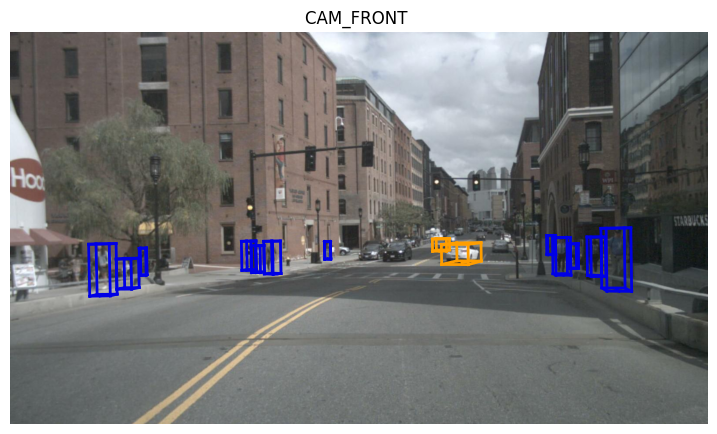

In [ ]:
nusc.render_sample_data(cam_front_data['token'])

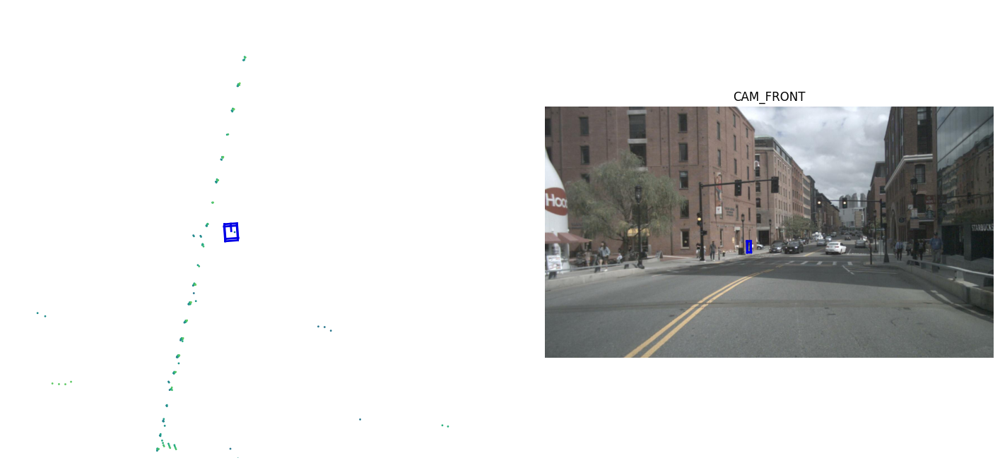

In [ ]:
my_annotation_token = my_sample['anns'][15]
my_annotation_metadata =  nusc.get('sample_annotation', my_annotation_token)

nusc.render_annotation(my_annotation_token)

{'token': '888521a8b57f46258e81a89bf062278b', 'category_token': 'fd69059b62a3469fbaef25340c0eab7f', 'nbr_annotations': 41, 'first_annotation_token': '79c9bcff128540ebafb6d3a8252a9744', 'last_annotation_token': 'e63ceadebbca4c978a8ca2a2e57111c8'}


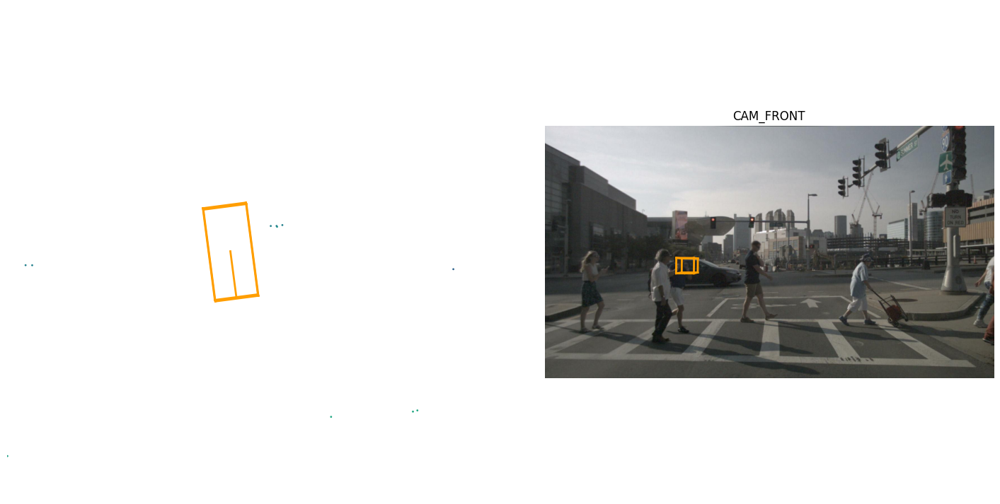

In [ ]:
my_instance = nusc.instance[400]
print(my_instance)

instance_token = my_instance['token']
nusc.render_instance(instance_token)

In [ ]:
nusc.visibility

[{'description': 'visibility of whole object is between 0 and 40%',
  'token': '1',
  'level': 'v0-40'},
 {'description': 'visibility of whole object is between 40 and 60%',
  'token': '2',
  'level': 'v40-60'},
 {'description': 'visibility of whole object is between 60 and 80%',
  'token': '3',
  'level': 'v60-80'},
 {'description': 'visibility of whole object is between 80 and 100%',
  'token': '4',
  'level': 'v80-100'}]

Visibility: {'description': 'visibility of whole object is between 80 and 100%', 'token': '4', 'level': 'v80-100'}


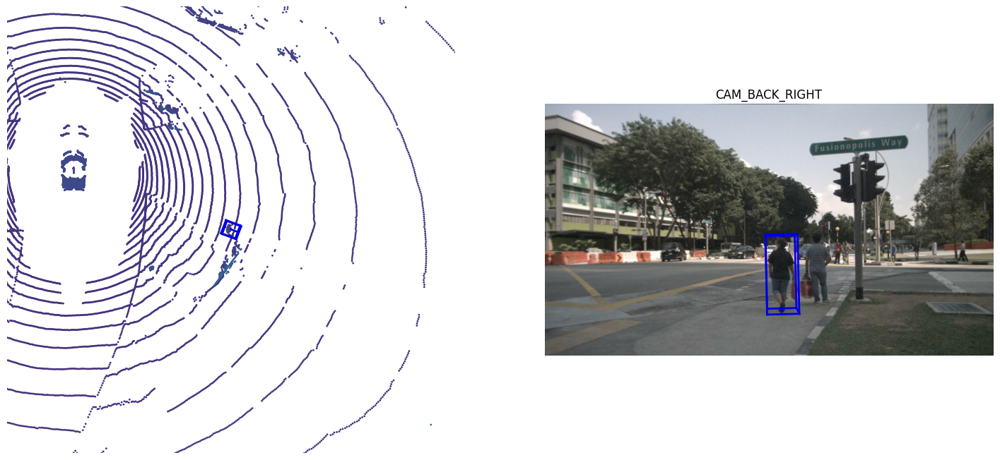

In [ ]:
anntoken = 'a7d0722bce164f88adf03ada491ea0ba'
visibility_token = nusc.get('sample_annotation', anntoken)['visibility_token']

print("Visibility: {}".format(nusc.get('visibility', visibility_token)))
nusc.render_annotation(anntoken)

Visibility: {'description': 'visibility of whole object is between 40 and 60%', 'token': '2', 'level': 'v40-60'}


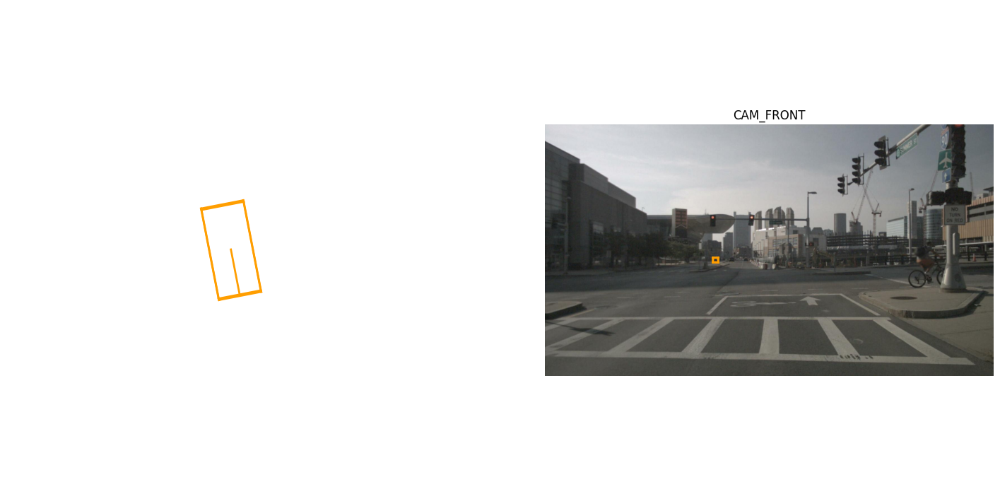

In [ ]:
anntoken = '79c9bcff128540ebafb6d3a8252a9744'
visibility_token = nusc.get('sample_annotation', anntoken)['visibility_token']

print("Visibility: {}".format(nusc.get('visibility', visibility_token)))
nusc.render_annotation(anntoken)

404


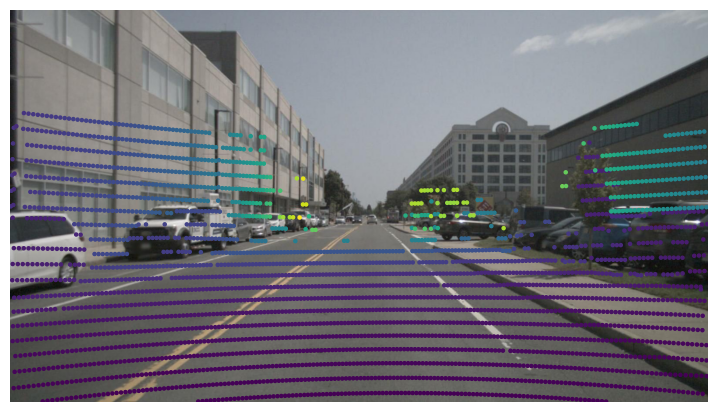

In [ ]:
# Lidar point cloud on image
my_sample = nusc.sample[120]
print(len(nusc.sample))
nusc.render_pointcloud_in_image(my_sample['token'], pointsensor_channel='LIDAR_TOP')

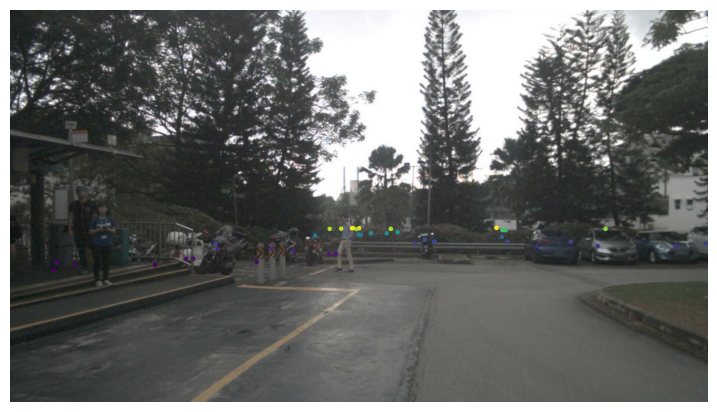

In [ ]:
# Radar point cloud on image

nusc.render_pointcloud_in_image(my_sample['token'], pointsensor_channel='RADAR_FRONT')

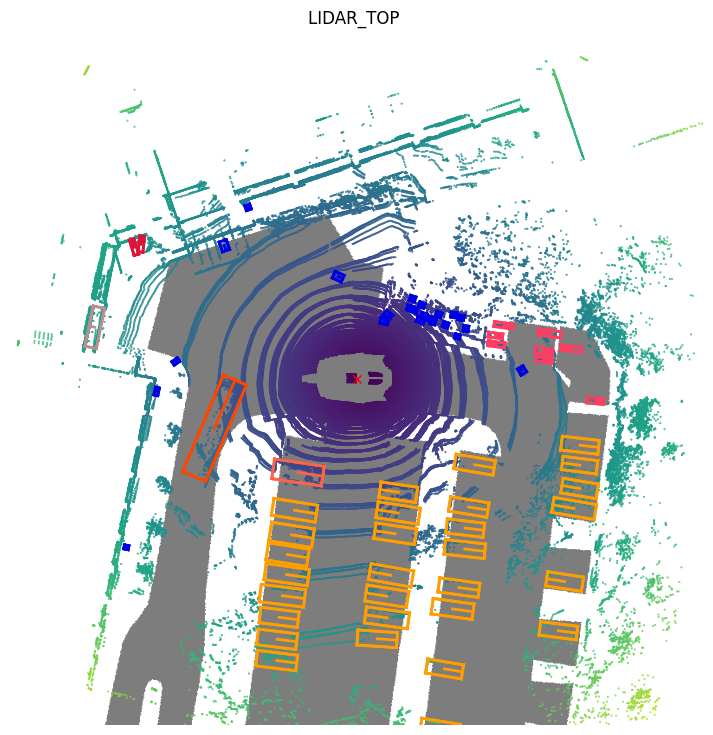

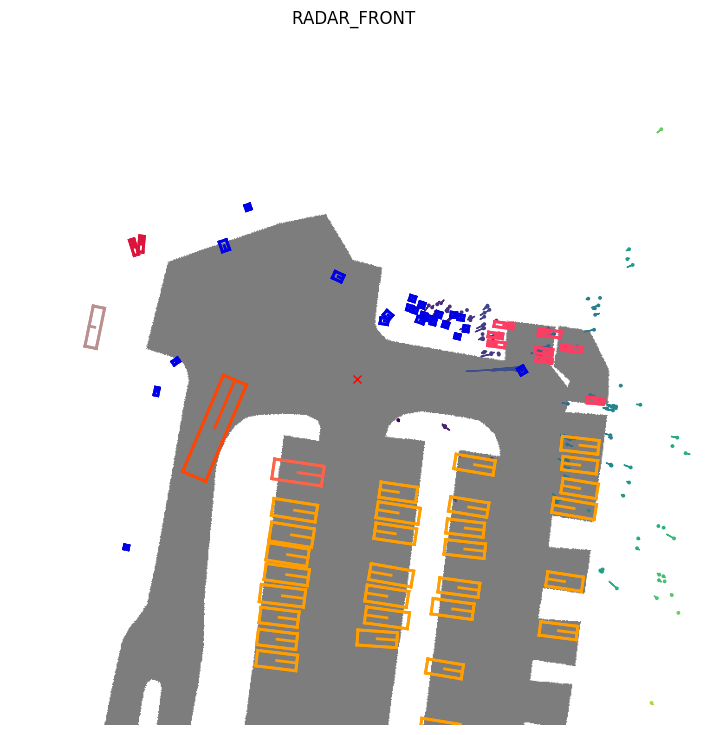

In [ ]:
nusc.render_sample_data(my_sample['data']['LIDAR_TOP'], nsweeps=5, underlay_map=True)
nusc.render_sample_data(my_sample['data']['RADAR_FRONT'], nsweeps=5, underlay_map=True)

## NuScene Segmentation

In [ ]:
%matplotlib inline

from nuscenes import NuScenes
from pathlib import Path

nusc = NuScenes(version='v1.0-mini', dataroot='/content', verbose=True)

Loading NuScenes tables for version v1.0-mini...
Loading nuScenes-lidarseg...
Loading nuScenes-panoptic...
32 category,
8 attribute,
4 visibility,
911 instance,
12 sensor,
120 calibrated_sensor,
31206 ego_pose,
8 log,
10 scene,
404 sample,
31206 sample_data,
18538 sample_annotation,
4 map,
404 lidarseg,
404 panoptic,
Done loading in 2.345 seconds.
Reverse indexing ...
Done reverse indexing in 0.6 seconds.


In [ ]:
!pip install git+https://github.com/simonzhang00/ripser-plusplus.git

  Cloning https://github.com/simonzhang00/ripser-plusplus.git to /tmp/pip-req-build-n35hb0kq
  Running command git clone --filter=blob:none --quiet https://github.com/simonzhang00/ripser-plusplus.git /tmp/pip-req-build-n35hb0kq
  Resolved https://github.com/simonzhang00/ripser-plusplus.git to commit 30243c0c752de26d7fdf6e41f08bf7b840ca4744
  Running command git submodule update --init --recursive -q
  Preparing metadata (setup.py) ... done
  Created wheel for ripserplusplus: filename=ripserplusplus-1.1.3-cp311-cp311-linux_x86_64.whl size=1616766 sha256=1907cce13360c3fcb664dedbfa6ca5cc6172a1e6e322ec1b2af82925c0666bb9
  Stored in directory: /tmp/pip-ephem-wheel-cache-n681c911/wheels/8e/36/b2/4ec348bcc5ffcc8ba3a3b8fb1c3091f6e6de735f1eb20ee8ea
Successfully built ripserplusplus


In [ ]:
import ripserplusplus as rpp_py
import numpy as np
from nuscenes.utils.data_classes import LidarPointCloud
import os

In [ ]:
# nuscenes-lidarseg
nusc.list_lidarseg_categories(sort_by='count')

Calculating semantic point stats for nuScenes-lidarseg...
  1  animal                                   nbr_points=           0
  7  human.pedestrian.stroller                nbr_points=           0
  8  human.pedestrian.wheelchair              nbr_points=           0
 19  vehicle.emergency.ambulance              nbr_points=           0
 20  vehicle.emergency.police                 nbr_points=           0
 10  movable_object.debris                    nbr_points=          48
  6  human.pedestrian.police_officer          nbr_points=          64
  3  human.pedestrian.child                   nbr_points=         230
  4  human.pedestrian.construction_worker     nbr_points=       1,412
 14  vehicle.bicycle                          nbr_points=       1,463
 11  movable_object.pushable_pullable         nbr_points=       2,293
  5  human.pedestrian.personal_mobility       nbr_points=       4,096
 13  static_object.bicycle_rack               nbr_points=       4,476
 12  movable_object.trafficcone 

In [ ]:
nusc.lidarseg_idx2name_mapping

{0: 'noise',
 1: 'animal',
 2: 'human.pedestrian.adult',
 3: 'human.pedestrian.child',
 4: 'human.pedestrian.construction_worker',
 5: 'human.pedestrian.personal_mobility',
 6: 'human.pedestrian.police_officer',
 7: 'human.pedestrian.stroller',
 8: 'human.pedestrian.wheelchair',
 9: 'movable_object.barrier',
 10: 'movable_object.debris',
 11: 'movable_object.pushable_pullable',
 12: 'movable_object.trafficcone',
 13: 'static_object.bicycle_rack',
 14: 'vehicle.bicycle',
 15: 'vehicle.bus.bendy',
 16: 'vehicle.bus.rigid',
 17: 'vehicle.car',
 18: 'vehicle.construction',
 19: 'vehicle.emergency.ambulance',
 20: 'vehicle.emergency.police',
 21: 'vehicle.motorcycle',
 22: 'vehicle.trailer',
 23: 'vehicle.truck',
 24: 'flat.driveable_surface',
 25: 'flat.other',
 26: 'flat.sidewalk',
 27: 'flat.terrain',
 28: 'static.manmade',
 29: 'static.other',
 30: 'static.vegetation',
 31: 'vehicle.ego'}

In [ ]:
nusc.lidarseg_name2idx_mapping

{'noise': 0,
 'animal': 1,
 'human.pedestrian.adult': 2,
 'human.pedestrian.child': 3,
 'human.pedestrian.construction_worker': 4,
 'human.pedestrian.personal_mobility': 5,
 'human.pedestrian.police_officer': 6,
 'human.pedestrian.stroller': 7,
 'human.pedestrian.wheelchair': 8,
 'movable_object.barrier': 9,
 'movable_object.debris': 10,
 'movable_object.pushable_pullable': 11,
 'movable_object.trafficcone': 12,
 'static_object.bicycle_rack': 13,
 'vehicle.bicycle': 14,
 'vehicle.bus.bendy': 15,
 'vehicle.bus.rigid': 16,
 'vehicle.car': 17,
 'vehicle.construction': 18,
 'vehicle.emergency.ambulance': 19,
 'vehicle.emergency.police': 20,
 'vehicle.motorcycle': 21,
 'vehicle.trailer': 22,
 'vehicle.truck': 23,
 'flat.driveable_surface': 24,
 'flat.other': 25,
 'flat.sidewalk': 26,
 'flat.terrain': 27,
 'static.manmade': 28,
 'static.other': 29,
 'static.vegetation': 30,
 'vehicle.ego': 31}

In [ ]:
# Panoptic nuScenes
nusc.list_lidarseg_categories(sort_by='count', gt_from='panoptic')

Calculating semantic point stats for nuScenes-panoptic...
  1  animal                                   nbr_points=           0
  7  human.pedestrian.stroller                nbr_points=           0
  8  human.pedestrian.wheelchair              nbr_points=           0
 19  vehicle.emergency.ambulance              nbr_points=           0
 20  vehicle.emergency.police                 nbr_points=           0
 10  movable_object.debris                    nbr_points=          48
  6  human.pedestrian.police_officer          nbr_points=          64
  3  human.pedestrian.child                   nbr_points=         230
  4  human.pedestrian.construction_worker     nbr_points=       1,401
 14  vehicle.bicycle                          nbr_points=       1,460
 11  movable_object.pushable_pullable         nbr_points=       2,293
  5  human.pedestrian.personal_mobility       nbr_points=       4,096
 13  static_object.bicycle_rack               nbr_points=       4,476
 12  movable_object.trafficcone 

In [ ]:
nusc.list_panoptic_instances(sort_by='count')

Calculating instance stats for nuScenes-panoptic ...
Per-frame number of instances: 39±24
Per-category instance stats:
vehicle.car: 382 instances, each instance spans to 15±11 frames, with 89±281 points
human.pedestrian.adult: 221 instances, each instance spans to 19±11 frames, with 10±19 points
movable_object.trafficcone: 106 instances, each instance spans to 8±7 frames, with 7±17 points
movable_object.barrier: 92 instances, each instance spans to 20±12 frames, with 29±70 points
vehicle.truck: 32 instances, each instance spans to 23±13 frames, with 420±1534 points
vehicle.motorcycle: 22 instances, each instance spans to 18±9 frames, with 17±36 points
vehicle.bus.rigid: 20 instances, each instance spans to 20±13 frames, with 73±150 points
vehicle.bicycle: 19 instances, each instance spans to 13±8 frames, with 6±12 points
human.pedestrian.construction_worker: 10 instances, each instance spans to 16±9 frames, with 9±15 points
vehicle.construction: 9 instances, each instance spans to 30±1

In [ ]:
def test_sample(index=10):

    my_sample = nusc.sample[index]

    # nuscenes-lidarseg
    nusc.get_sample_lidarseg_stats(my_sample['token'], sort_by='count')

    sample_data_token = my_sample['data']['LIDAR_TOP']
    nusc.render_sample_data(sample_data_token,
                            with_anns=False,
                            show_lidarseg=True)

    # Focus on a specific classes only
    nusc.render_sample_data(sample_data_token,
                        with_anns=False,
                        show_lidarseg=True,
                        filter_lidarseg_labels=[22, 23],
                        show_lidarseg_legend=True)

    # show stuff category legends
    nusc.render_sample_data(sample_data_token,
                            with_anns=False,
                            show_lidarseg=False,
                            show_lidarseg_legend=True,
                            show_panoptic=True)


    # nuscenes-lidarseg
    nusc.render_sample(my_sample['token'],
                    show_lidarseg=True,
                    # filter_lidarseg_labels=[22, 23]
                       )

    # Panoptic nuScenes
    nusc.render_sample(my_sample['token'],
                    show_lidarseg=False,
                    # filter_lidarseg_labels=[17, 23, 24],
                    show_panoptic=True)

    # # Panoptic nuScenes
    # nusc.render_pointcloud_in_image(my_sample['token'],
    #                                 pointsensor_channel='LIDAR_TOP',
    #                                 camera_channel='CAM_BACK',
    #                                 render_intensity=False,
    #                                 show_lidarseg=False,
    #                                 filter_lidarseg_labels=[17,22, 23, 24],
    #                                 show_lidarseg_legend=True,
    #                                 show_panoptic=True)


===== Statistics for fedfb3a6cb804635a0f47143f9ca8d6f =====
 14  vehicle.bicycle                          n=           4
 16  vehicle.bus.rigid                        n=          18
 21  vehicle.motorcycle                       n=          29
  0  noise                                    n=          31
 12  movable_object.trafficcone               n=          32
  4  human.pedestrian.construction_worker     n=          85
  2  human.pedestrian.adult                   n=         347
 17  vehicle.car                              n=         377
 23  vehicle.truck                            n=         441
 25  flat.other                               n=         552
 18  vehicle.construction                     n=         752
 26  flat.sidewalk                            n=       1,831
  9  movable_object.barrier                   n=       2,526
 28  static.manmade                           n=       3,230
 30  static.vegetation                        n=       3,842
 27  flat.terrain        

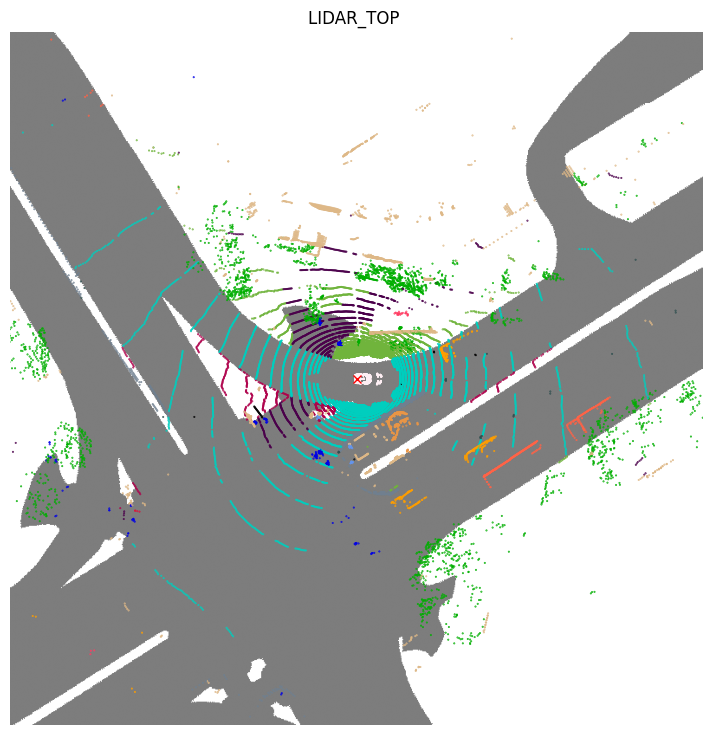

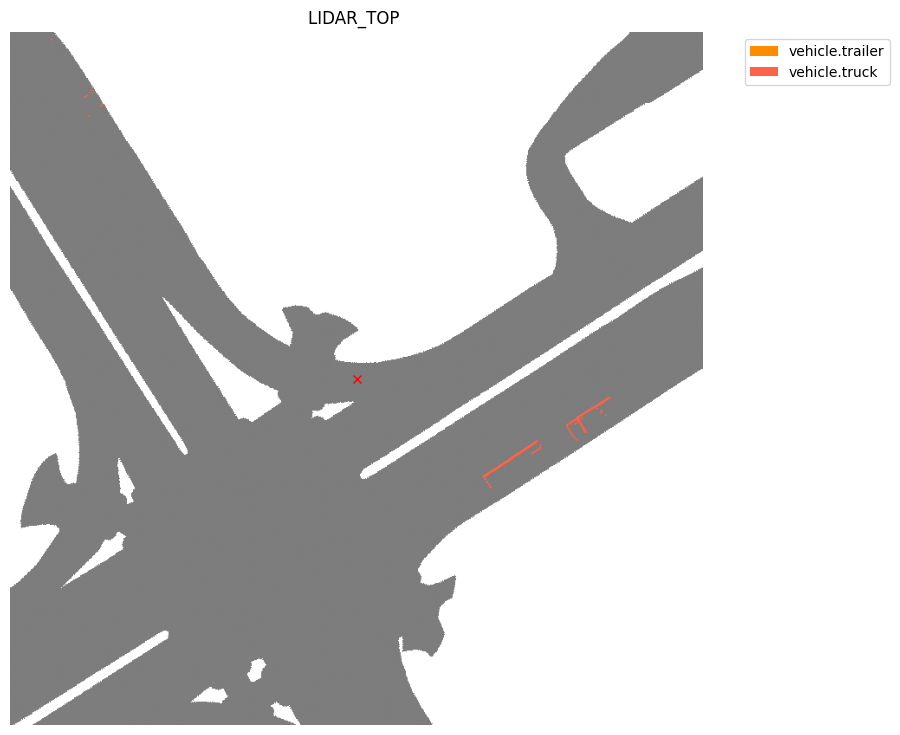

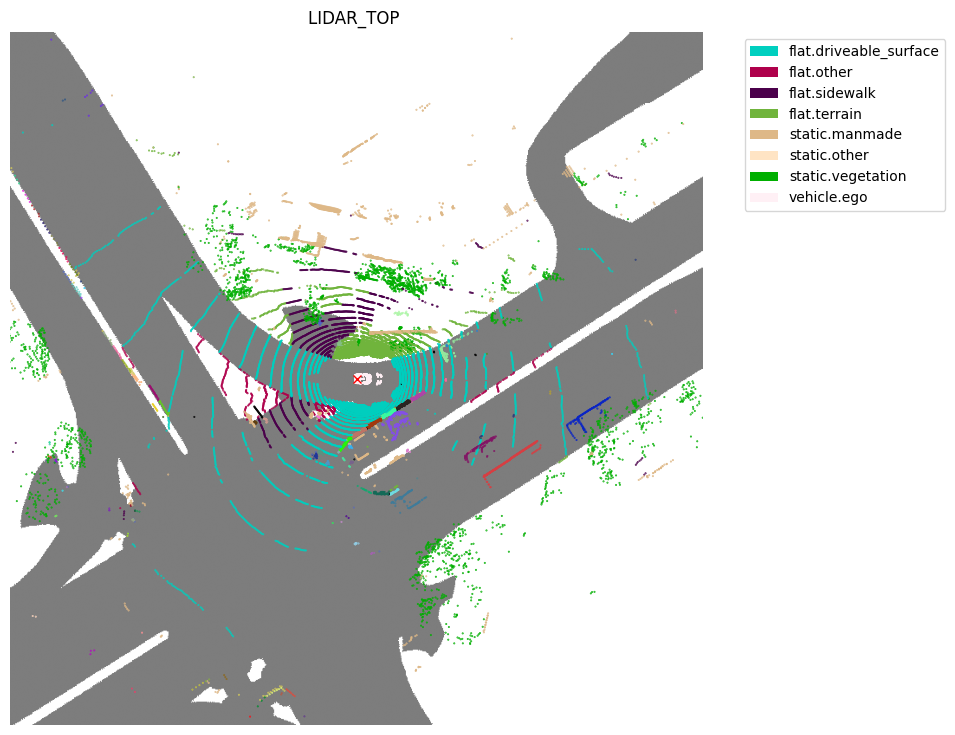

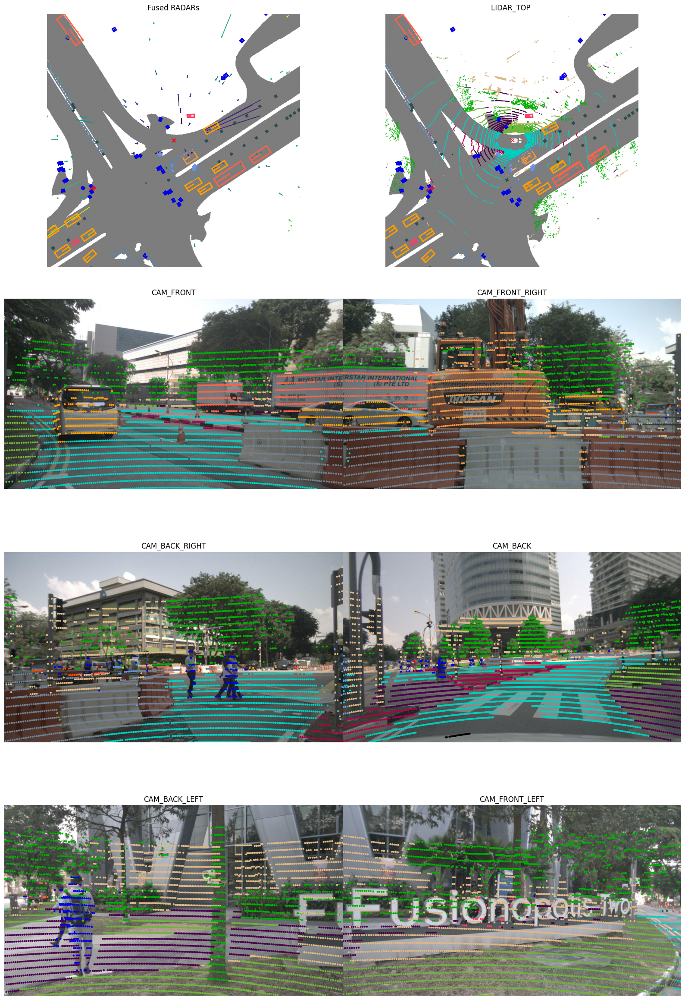

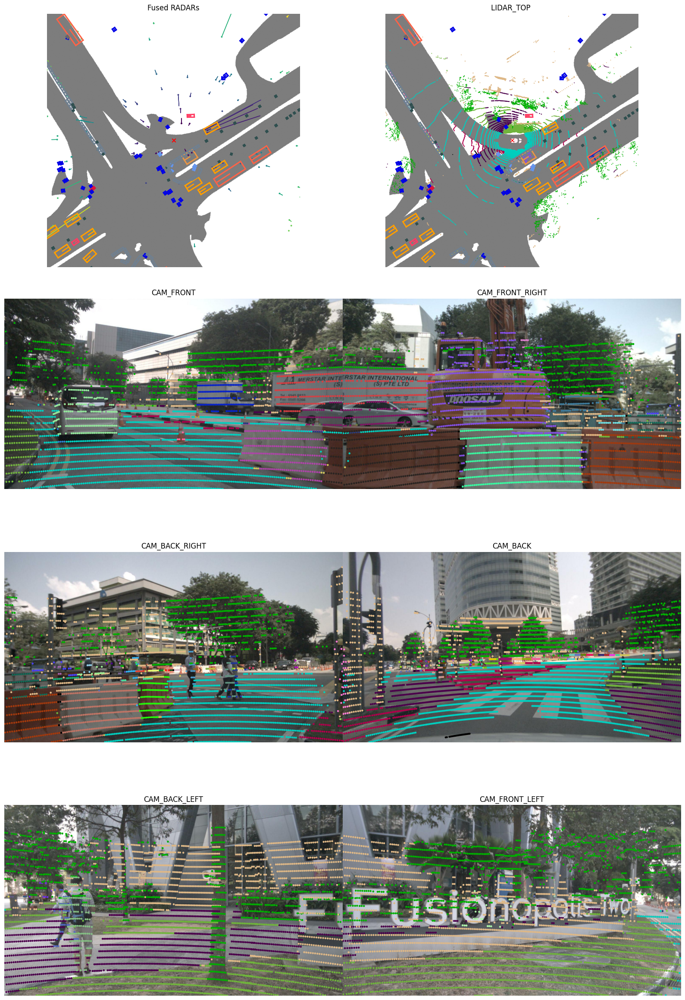

In [ ]:
test_sample(21)

In [ ]:
!pip install webdataset

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.5/85.5 kB 6.0 MB/s eta 0:00:00


In [ ]:
from pyquaternion import Quaternion
from nuscenes.utils.geometry_utils import transform_matrix
from functools import reduce
from nuscenes.utils import splits
import pickle

map_name_from_general_to_detection = {
    "human.pedestrian.adult": "pedestrian",
    "human.pedestrian.child": "pedestrian",
    "human.pedestrian.wheelchair": "ignore",
    "human.pedestrian.stroller": "ignore",
    "human.pedestrian.personal_mobility": "ignore",
    "human.pedestrian.police_officer": "pedestrian",
    "human.pedestrian.construction_worker": "pedestrian",
    "animal": "ignore",
    "vehicle.car": "car",
    "vehicle.motorcycle": "motorcycle",
    "vehicle.bicycle": "bicycle",
    "vehicle.bus.bendy": "bus",
    "vehicle.bus.rigid": "bus",
    "vehicle.truck": "truck",
    "vehicle.construction": "construction_vehicle",
    "vehicle.emergency.ambulance": "ignore",
    "vehicle.emergency.police": "ignore",
    "vehicle.trailer": "trailer",
    "movable_object.barrier": "barrier",
    "movable_object.trafficcone": "traffic_cone",
    "movable_object.pushable_pullable": "ignore",
    "movable_object.debris": "ignore",
    "static_object.bicycle_rack": "ignore",
}

def get_available_scenes(nusc):
    available_scenes = []
    for scene in nusc.scene:
        scene_token = scene["token"]
        scene_rec = nusc.get("scene", scene_token)
        sample_rec = nusc.get("sample", scene_rec["first_sample_token"])
        sd_rec = nusc.get("sample_data", sample_rec["data"]["LIDAR_TOP"])
        has_more_frames = True
        scene_not_exist = False
        while has_more_frames:
            lidar_path, boxes, _ = nusc.get_sample_data(sd_rec["token"])
            if not Path(lidar_path).exists():
                scene_not_exist = True
                break
            else:
                break
        if scene_not_exist:
            continue
        available_scenes.append(scene)
    return available_scenes

def get_sample_data(nusc, sample_data_token, selected_anntokens=None):
    """
    Returns the data path as well as all annotations related to that sample_data.
    Note that the boxes are transformed into the current sensor"s coordinate frame.
    Args:
        nusc:
        sample_data_token: Sample_data token.
        selected_anntokens: If provided only return the selected annotation.

    Returns:

    """
    # Retrieve sensor & pose records
    sd_record = nusc.get("sample_data", sample_data_token)
    cs_record = nusc.get("calibrated_sensor", sd_record["calibrated_sensor_token"])
    sensor_record = nusc.get("sensor", cs_record["sensor_token"])
    pose_record = nusc.get("ego_pose", sd_record["ego_pose_token"])

    data_path = nusc.get_sample_data_path(sample_data_token)

    if sensor_record["modality"] == "camera":
        cam_intrinsic = np.array(cs_record["camera_intrinsic"])
    else:
        cam_intrinsic = None

    # Retrieve all sample annotations and map to sensor coordinate system.
    if selected_anntokens is not None:
        boxes = list(map(nusc.get_box, selected_anntokens))
    else:
        boxes = nusc.get_boxes(sample_data_token)

    # Make list of Box objects including coord system transforms.
    box_list = []
    for box in boxes:
        box.velocity = nusc.box_velocity(box.token)
        # Move box to ego vehicle coord system
        box.translate(-np.array(pose_record["translation"]))
        box.rotate(Quaternion(pose_record["rotation"]).inverse)

        #  Move box to sensor coord system
        box.translate(-np.array(cs_record["translation"]))
        box.rotate(Quaternion(cs_record["rotation"]).inverse)

        box_list.append(box)

    return data_path, box_list, cam_intrinsic

def quaternion_yaw(q: Quaternion) -> float:
    """
    Calculate the yaw angle from a quaternion.
    Note that this only works for a quaternion that represents a box in lidar or global coordinate frame.
    It does not work for a box in the camera frame.
    :param q: Quaternion of interest.
    :return: Yaw angle in radians.
    """

    # Project into xy plane.
    v = np.dot(q.rotation_matrix, np.array([1, 0, 0]))

    # Measure yaw using arctan.
    yaw = np.arctan2(v[1], v[0])

    return yaw


def obtain_sensor2top(
    nusc, sensor_token, l2e_t, l2e_r_mat, e2g_t, e2g_r_mat, sensor_type="lidar"
):
    """Obtain the info with RT matric from general sensor to Top LiDAR.

    Args:
        nusc (class): Dataset class in the nuScenes dataset.
        sensor_token (str): Sample data token corresponding to the
            specific sensor type.
        l2e_t (np.ndarray): Translation from lidar to ego in shape (1, 3).
        l2e_r_mat (np.ndarray): Rotation matrix from lidar to ego
            in shape (3, 3).
        e2g_t (np.ndarray): Translation from ego to global in shape (1, 3).
        e2g_r_mat (np.ndarray): Rotation matrix from ego to global
            in shape (3, 3).
        sensor_type (str): Sensor to calibrate. Default: "lidar".

    Returns:
        sweep (dict): Sweep information after transformation.
    """
    sd_rec = nusc.get("sample_data", sensor_token)
    cs_record = nusc.get("calibrated_sensor", sd_rec["calibrated_sensor_token"])
    pose_record = nusc.get("ego_pose", sd_rec["ego_pose_token"])
    data_path = str(nusc.get_sample_data_path(sd_rec["token"]))
    # if os.getcwd() in data_path:  # path from lyftdataset is absolute path
    #     data_path = data_path.split(f"{os.getcwd()}/")[-1]  # relative path
    sweep = {
        "data_path": data_path,
        "type": sensor_type,
        "sample_data_token": sd_rec["token"],
        "sensor2ego_translation": cs_record["translation"],
        "sensor2ego_rotation": cs_record["rotation"],
        "ego2global_translation": pose_record["translation"],
        "ego2global_rotation": pose_record["rotation"],
        "timestamp": sd_rec["timestamp"],
    }
    l2e_r_s = sweep["sensor2ego_rotation"]
    l2e_t_s = sweep["sensor2ego_translation"]
    e2g_r_s = sweep["ego2global_rotation"]
    e2g_t_s = sweep["ego2global_translation"]

    # obtain the RT from sensor to Top LiDAR
    # sweep->ego->global->ego'->lidar
    l2e_r_s_mat = Quaternion(l2e_r_s).rotation_matrix
    e2g_r_s_mat = Quaternion(e2g_r_s).rotation_matrix
    R = (l2e_r_s_mat.T @ e2g_r_s_mat.T) @ (
        np.linalg.inv(e2g_r_mat).T @ np.linalg.inv(l2e_r_mat).T
    )
    T = (l2e_t_s @ e2g_r_s_mat.T + e2g_t_s) @ (
        np.linalg.inv(e2g_r_mat).T @ np.linalg.inv(l2e_r_mat).T
    )
    T -= (
        e2g_t @ (np.linalg.inv(e2g_r_mat).T @ np.linalg.inv(l2e_r_mat).T)
        + l2e_t @ np.linalg.inv(l2e_r_mat).T
    ).squeeze(0)
    sweep["sensor2lidar_rotation"] = R.T  # points @ R.T + T
    sweep["sensor2lidar_translation"] = T
    return sweep

def fill_mini_infos(
    data_path, nusc, train_scenes, test=False, max_sweeps=10, with_camera=False
):
    mini_nusc_infos = []

    ref_chan = "LIDAR_TOP"  # The radar channel from which we track back n sweeps to aggregate the point cloud.
    chan = "LIDAR_TOP"  # The reference channel of the current sample_rec that the point clouds are mapped to.

    for index, sample in enumerate(nusc.sample):

        ref_sd_token = sample["data"][ref_chan]
        ref_sd_rec = nusc.get("sample_data", ref_sd_token)
        ref_cs_rec = nusc.get(
            "calibrated_sensor", ref_sd_rec["calibrated_sensor_token"]
        )
        ref_pose_rec = nusc.get("ego_pose", ref_sd_rec["ego_pose_token"])
        ref_time = 1e-6 * ref_sd_rec["timestamp"]

        ref_lidar_path, ref_boxes, _ = get_sample_data(nusc, ref_sd_token)

        ref_cam_front_token = sample["data"]["CAM_FRONT"]
        ref_cam_path, _, ref_cam_intrinsic = nusc.get_sample_data(ref_cam_front_token)

        # Homogeneous transform from ego car frame to reference frame
        ref_from_car = transform_matrix(
            ref_cs_rec["translation"], Quaternion(ref_cs_rec["rotation"]), inverse=True
        )

        # Homogeneous transformation matrix from global to _current_ ego car frame
        car_from_global = transform_matrix(
            ref_pose_rec["translation"],
            Quaternion(ref_pose_rec["rotation"]),
            inverse=True,
        )
        info = {
            "lidar_path": Path(ref_lidar_path).relative_to(data_path).__str__(),
            "lidar_token": ref_sd_token,
            "cam_front_path": Path(ref_cam_path).relative_to(data_path).__str__(),
            "cam_intrinsic": ref_cam_intrinsic,
            "token": sample["token"],
            "sweeps": [],
            "ref_from_car": ref_from_car,
            "car_from_global": car_from_global,
            "timestamp": ref_time,
        }
        if with_camera:
            info["cams"] = dict()
            l2e_r = ref_cs_rec["rotation"]
            l2e_t = (ref_cs_rec["translation"],)
            e2g_r = ref_pose_rec["rotation"]
            e2g_t = ref_pose_rec["translation"]
            l2e_r_mat = Quaternion(l2e_r).rotation_matrix
            e2g_r_mat = Quaternion(e2g_r).rotation_matrix

            # obtain 6 image's information per frame
            camera_types = [
                "CAM_FRONT",
                "CAM_FRONT_RIGHT",
                "CAM_FRONT_LEFT",
                "CAM_BACK",
                "CAM_BACK_LEFT",
                "CAM_BACK_RIGHT",
            ]
            for cam in camera_types:
                cam_token = sample["data"][cam]
                cam_path, _, camera_intrinsics = nusc.get_sample_data(cam_token)
                cam_info = obtain_sensor2top(
                    nusc, cam_token, l2e_t, l2e_r_mat, e2g_t, e2g_r_mat, cam
                )
                cam_info["data_path"] = (
                    Path(cam_info["data_path"]).relative_to(data_path).__str__()
                )
                cam_info.update(camera_intrinsics=camera_intrinsics)
                info["cams"].update({cam: cam_info})

        sample_data_token = sample["data"][chan]
        curr_sd_rec = nusc.get("sample_data", sample_data_token)
        sweeps = []
        while len(sweeps) < max_sweeps - 1:
            if curr_sd_rec["prev"] == "":
                if len(sweeps) == 0:
                    sweep = {
                        "lidar_path": Path(ref_lidar_path)
                        .relative_to(data_path)
                        .__str__(),
                        "sample_data_token": curr_sd_rec["token"],
                        "transform_matrix": None,
                        "time_lag": curr_sd_rec["timestamp"] * 0,
                    }
                    sweeps.append(sweep)
                else:
                    sweeps.append(sweeps[-1])
            else:
                curr_sd_rec = nusc.get("sample_data", curr_sd_rec["prev"])

                # Get past pose
                current_pose_rec = nusc.get("ego_pose", curr_sd_rec["ego_pose_token"])
                global_from_car = transform_matrix(
                    current_pose_rec["translation"],
                    Quaternion(current_pose_rec["rotation"]),
                    inverse=False,
                )

                # Homogeneous transformation matrix from sensor coordinate frame to ego car frame.
                current_cs_rec = nusc.get(
                    "calibrated_sensor", curr_sd_rec["calibrated_sensor_token"]
                )
                car_from_current = transform_matrix(
                    current_cs_rec["translation"],
                    Quaternion(current_cs_rec["rotation"]),
                    inverse=False,
                )

                tm = reduce(
                    np.dot,
                    [ref_from_car, car_from_global, global_from_car, car_from_current],
                )

                lidar_path = nusc.get_sample_data_path(curr_sd_rec["token"])

                time_lag = ref_time - 1e-6 * curr_sd_rec["timestamp"]

                sweep = {
                    "lidar_path": Path(lidar_path).relative_to(data_path).__str__(),
                    "sample_data_token": curr_sd_rec["token"],
                    "transform_matrix": tm,
                    "global_from_car": global_from_car,
                    "car_from_current": car_from_current,
                    "time_lag": time_lag,
                }
                sweeps.append(sweep)

        info["sweeps"] = sweeps

        assert len(info["sweeps"]) == max_sweeps - 1, (
            f"sweep {curr_sd_rec['token']} only has {len(info['sweeps'])} sweeps, "
            f"you should duplicate to sweep num {max_sweeps - 1}"
        )

        if not test:
            # processing gt bbox
            annotations = [
                nusc.get("sample_annotation", token) for token in sample["anns"]
            ]

            # the filtering gives 0.5~1 map improvement
            num_lidar_pts = np.array([anno["num_lidar_pts"] for anno in annotations])
            num_radar_pts = np.array([anno["num_radar_pts"] for anno in annotations])
            mask = num_lidar_pts + num_radar_pts > 0

            locs = np.array([b.center for b in ref_boxes]).reshape(-1, 3)
            dims = np.array([b.wlh for b in ref_boxes]).reshape(-1, 3)[
                :, [1, 0, 2]
            ]  # wlh == > dxdydz (lwh)
            velocity = np.array([b.velocity for b in ref_boxes]).reshape(-1, 3)
            rots = np.array([quaternion_yaw(b.orientation) for b in ref_boxes]).reshape(
                -1, 1
            )
            names = np.array([b.name for b in ref_boxes])
            tokens = np.array([b.token for b in ref_boxes])
            gt_boxes = np.concatenate([locs, dims, rots, velocity[:, :2]], axis=1)

            assert len(annotations) == len(gt_boxes) == len(velocity)

            info["gt_boxes"] = gt_boxes[mask, :]
            info["gt_boxes_velocity"] = velocity[mask, :]
            info["gt_names"] = np.array(
                [map_name_from_general_to_detection[name] for name in names]
            )[mask]
            info["gt_boxes_token"] = tokens[mask]
            info["num_lidar_pts"] = num_lidar_pts[mask]
            info["num_radar_pts"] = num_radar_pts[mask]

            # processing gt segment
            segment_path = nusc.get("lidarseg", ref_sd_token)["filename"]
            info["gt_segment_path"] = segment_path

        mini_nusc_infos.append(info)

    return mini_nusc_infos


def test_get_ptv3_data():

    available_scenes_mini = get_available_scenes(nusc)

    available_scene_names_mini = [s["name"] for s in available_scenes_mini]
    print("total scene num:", len(nusc.scene))
    print("exist scene num:", len(available_scenes_mini))

    train_scenes = splits.mini_train

    mini_scenes = set(
        [
            available_scenes_mini[available_scene_names_mini.index(s)]["token"]
            for s in train_scenes
        ]
    )

    mini_nusc_info = fill_mini_infos(
        nusc.dataroot,
        nusc,
        mini_scenes,
        test=False,
        max_sweeps=10,
        with_camera=False,
    )

    with open(
    os.path.join(
        '/content',
        f"nuscenes_infos_10sweeps_mini.pkl",
    ),
        "wb",
    ) as f:
        pickle.dump(mini_nusc_info, f)



test_get_ptv3_data()

total scene num: 10
exist scene num: 10


TypeError: list indices must be integers or slices, not str

In [ ]:
def get_data_list(info_paths):

    data_list = []
    for info_path in info_paths:
        with open(info_path, "rb") as f:
            info = pickle.load(f)
            data_list.extend(info)
    return data_list

def mini_prepare_data(idx=10):

    data_root = '/content'

    data_list = get_data_list(['/content/nuscenes_infos_10sweeps_mini.pkl'])

    print(len(data_list))

    data = data_list[idx % len(data_list)]

    lidar_path = os.path.join(data_root, data["lidar_path"])

    points = np.fromfile(str(lidar_path), dtype=np.float32, count=-1).reshape(
            [-1, 5]
        )

    coord = points[:, :3]
    strength = points[:, 3].reshape([-1, 1]) / 255  # scale strength to [0, 1]

    if "gt_segment_path" in data.keys():
        gt_segment_path = os.path.join(
            data_root, "raw", data["gt_segment_path"]
        )
        segment = np.fromfile(
            str(gt_segment_path), dtype=np.uint8, count=-1
        ).reshape([-1])
        segment = np.vectorize(learning_map.__getitem__)(segment).astype(
            np.int64
        )
    else:
        segment = np.ones((points.shape[0],), dtype=np.int64) * ignore_index
    data_dict = dict(
        coord=coord,
        strength=strength,
        segment=segment,
        name=get_data_name(idx),
    )

    print(points.shape)

mini_prepare_data()

404
(34688, 5)


In [ ]:
# https://github.com/nutonomy/nuscenes-devkit/blob/master/python-sdk/nuscenes/nuscenes.py#L27

def test_topo(index=20):

    my_sample = nusc.sample[index]

    sample_data_token = my_sample['data']['LIDAR_TOP']

    sd_record = nusc.get('sample_data', sample_data_token)

    sample_rec = nusc.get('sample', sd_record['sample_token'])

    chan = sd_record['channel']
    ref_chan = 'LIDAR_TOP'
    ref_sd_token = sample_rec['data'][ref_chan]
    ref_sd_record = nusc.get('sample_data', ref_sd_token)

    pcl_path = os.path.join(nusc.dataroot, ref_sd_record['filename'])

    pc = LidarPointCloud.from_file(pcl_path)

    point_clouds = pc.points

    pe_latent_space = rpp_py.run("--format point-cloud --dim 2 --sparse", point_clouds)
    # print(my_sample['token'])
    # print(sample_rec)
    # print(pc.points)
    # print(pc.points.shape)
    print(pe_latent_space)
test_topo()

## topology plot

In [ ]:
!pip3 install git+https://github.com/simonzhang00/ripser-plusplus.git

  Cloning https://github.com/simonzhang00/ripser-plusplus.git to /tmp/pip-req-build-ut4nemwa
  Running command git clone --filter=blob:none --quiet https://github.com/simonzhang00/ripser-plusplus.git /tmp/pip-req-build-ut4nemwa
  Resolved https://github.com/simonzhang00/ripser-plusplus.git to commit 30243c0c752de26d7fdf6e41f08bf7b840ca4744
  Running command git submodule update --init --recursive -q
  Preparing metadata (setup.py) ... done
  Created wheel for ripserplusplus: filename=ripserplusplus-1.1.3-cp311-cp311-linux_x86_64.whl size=1616742 sha256=12acd90da9da2087bfa828a5c82076a89813c0e856b36a0ee3abf771df1da7c6
  Stored in directory: /tmp/pip-ephem-wheel-cache-vayionx3/wheels/8e/36/b2/4ec348bcc5ffcc8ba3a3b8fb1c3091f6e6de735f1eb20ee8ea
Successfully built ripserplusplus


In [ ]:
!pip install ripser

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 841.3/841.3 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.6/48.6 kB 2.1 MB/s eta 0:00:00
  Created wheel for hopcroftkarp: filename=hopcroftkarp-1.2.5-py2.py3-none-any.whl size=18102 sha256=5b5e8e8fcfc5b743c498cd1f7960bce8fa81517b8bc40b1afb8b1efd93b87239
  Stored in directory: /root/.cache/pip/wheels/1f/cc/2d/de23a8b9ae586817b0b44de4a4b1a08f23473e248a644b312f
Successfully built hopcroftkarp


In [ ]:
!pip install persim

In [ ]:
!python --version

Python 3.11.11


In [ ]:
!pip install giotto-tda

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 21.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 39.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 558.8/558.8 kB 17.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 37.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 460.6/460.6 kB 20.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 24.9 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.6.1
    Uninstalling scikit-learn-1.6.1:
      Successfully uninstalled scikit-learn-1.6.1


In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
# import ripserplusplus as rpp_py
from ripser import ripser
from persim import plot_diagrams
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from scipy.spatial import Delaunay
import torch.nn as nn
import torch.nn.functional as F
from persim import PersistenceImager

from gtda.homology import VietorisRipsPersistence
# from gtda.metrics import wasserstein_distance

### Read input

In [ ]:
# Load the .npy file
TDA_feature = np.load("/content/TDA_latent_feature.npy", allow_pickle=True)
point_feature = np.load("/content/point_feat.npy", allow_pickle=True)

# Print the shape and type of the data
print("Data Shape:", point_feature.shape)
print("Data Type:", type(point_feature))

Data Shape: (3988, 512)
Data Type: <class 'numpy.ndarray'>


In [ ]:
# Extract data for each dimension
dim_0 = TDA_feature.item()[0]  # Data for key 0
dim_1 = TDA_feature.item()[1]  # Data for key 1
dim_2 = TDA_feature.item()[2]  # Data for key 2

In [ ]:
# Accessing specific fields (birth and death) for each dimension
dim_0_birth = dim_0['birth']    # Birth values for dimension 0
dim_0_death = dim_0['death']    # Death values for dimension 0
dim_1_birth = dim_1['birth']    # Birth values for dimension 1
dim_1_death = dim_1['death']    # Death values for dimension 1
dim_2_birth = dim_2['birth']    # Birth values for dimension 2
dim_2_death = dim_2['death']    # Death values for dimension 2

# Example: Print the extracted data
print("Dimension 0:")
print("Birth:", dim_0_birth)
print("Death:", dim_0_death)

print("\nDimension 1:")
print("Birth:", dim_1_birth)
print("Death:", dim_1_death)

print("\nDimension 2:")
print("Birth:", dim_2_birth)
print("Death:", dim_2_death)

Dimension 0:
Birth: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 

In [ ]:
# Function to shuffle NumPy arrays
def shuffle_array(arr):
    shuffled_arr = arr.copy()
    np.random.shuffle(shuffled_arr)
    return shuffled_arr

# Function to select N features randomly
def select_top_persistent(features, n=10):
    if len(features) == 0:
        return np.array([])
    # Ensure n does not exceed the number of features
    n = min(n, len(features))
    # Use np.random.choice to select random indices
    random_indices = np.random.choice(len(features), size=n, replace=False)
    # Return the randomly selected features
    return features[random_indices]

# Function to plot persistence barcode with separate lines for H0, H1, and H2
def plot_spread_persistence(H0, H1, H2, top_n=10):
    colors = ['red', 'green', 'blue']  # H0 -> red, H1 -> green, H2 -> blue
    y_positions = []  # Stores y-tick positions
    labels = []  # Stores final y-labels

    fig, ax = plt.subplots(figsize=(8, 6))

    y_index = 0  # Keeps track of y-axis position

    # Shuffle H0, H1, and H2
    H0 = shuffle_array(H0)
    H1 = shuffle_array(H1)
    H2 = shuffle_array(H2)

    # Select top N persistent features for each homology group
    H0 = select_top_persistent(H0, top_n)
    H1 = select_top_persistent(H1, top_n)
    H2 = select_top_persistent(H2, top_n)

    # Find middle indices for correct label placement
    middle_H0 = len(H0) // 2 if len(H0) > 0 else 0
    middle_H1 = len(H1) // 2 if len(H1) > 0 else 0
    middle_H2 = len(H2) // 2 if len(H2) > 0 else 0

    # Plot H0 bars (red)
    for indx, (birth, death) in enumerate(H0):
        ax.plot([birth, death], [y_index, y_index], lw=2, color='red', alpha=0.8)

        # Add label only at the middle index
        if indx == middle_H0:
            labels.append("$H_0$")
            y_positions.append(y_index)

        y_index -= 1  # Move to next line

    # Leave some space before H1
    y_index -= 3

    # Plot H1 bars (green)
    for indx, (birth, death) in enumerate(H1):
        ax.plot([birth, death], [y_index, y_index], lw=2, color='green', alpha=0.8)

        # Add label only at the middle index
        if indx == middle_H1:
            labels.append("$H_1$")
            y_positions.append(y_index)

        y_index -= 1  # Move to next line

    # Leave some space before H2
    y_index -= 3

    # Plot H2 bars (blue)
    for indx, (birth, death) in enumerate(H2):
        ax.plot([birth, death], [y_index, y_index], lw=2, color='blue', alpha=0.8)

        # Add label only at the middle index
        if indx == middle_H2:
            labels.append("$H_2$")
            y_positions.append(y_index)

        y_index -= 1  # Move to next line

    # Set only the meaningful y-labels
    ax.set_yticks(y_positions)
    ax.set_yticklabels(labels, fontsize=12)
    ax.set_xlabel("Filtration Parameter (ε)", fontsize=12)
    ax.set_title("Persistence Barcode", fontsize=14)
    ax.grid(True, linestyle="--", alpha=0.5)

    # Adjust x-axis limits based on the maximum death value across all dimensions
    max_death = max(max(H0[:, 1]) if len(H0) > 0 else 0,
                    max(H1[:, 1]) if len(H1) > 0 else 0,
                    max(H2[:, 1]) if len(H2) > 0 else 0)
    ax.set_xlim(0, max_death + 5)  # Add some padding

    plt.show()

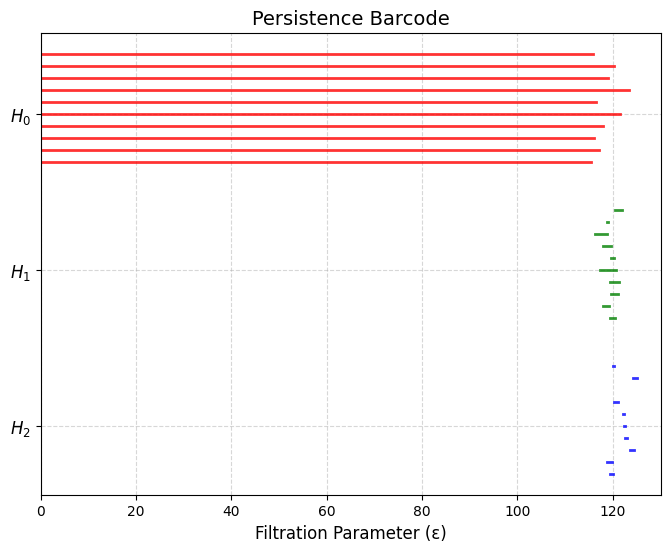

In [ ]:
# Extract birth and death pairs for each homology group
h0_data = TDA_feature.item()[0]
h1_data = TDA_feature.item()[1]
h2_data = TDA_feature.item()[2]

# Convert to arrays of [birth, death] pairs for plotting
H0 = np.column_stack((h0_data['birth'], h0_data['death']))
H1 = np.column_stack((h1_data['birth'], h1_data['death']))
H2 = np.column_stack((h2_data['birth'], h2_data['death']))

# Call the function to plot
plot_spread_persistence(H0, H1, H2, top_n=10)

In [ ]:
latent_space = np.rot90(point_feature)

print(latent_space.shape)

# Reduce dimensionality using PCA (to 50D for efficiency)
pca = PCA(n_components=10)
latent_reduced = pca.fit_transform(latent_space)

(512, 3988)


### compute homology using GTDA lib

In [ ]:
def compute_ph(data):
    """
    Compute Persistent Homology for input data.
    """
    ph = VietorisRipsPersistence(metric="euclidean", homology_dimensions=[0, 1, 2])

    data = data.reshape(1, *data.shape)
    diagrams = ph.fit_transform(data)
    return diagrams

gtda_diagrams = compute_ph(latent_space)

In [ ]:
gtda_diagrams[0]

array([[  0.        , 110.12782288,   0.        ],
       [  0.        , 110.74666595,   0.        ],
       [  0.        , 110.82628632,   0.        ],
       ...,
       [118.0922699 , 118.29850769,   2.        ],
       [117.64484406, 117.94181824,   2.        ],
       [117.4387207 , 118.29850769,   2.        ]])

### compute homology using ripser

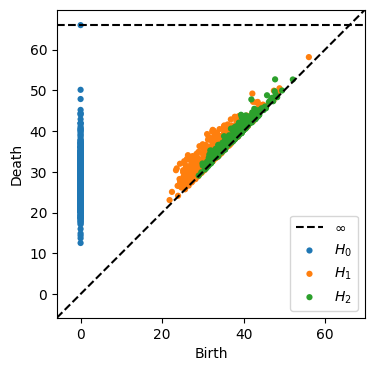

In [ ]:
# Compute persistent homology on the reduced data
diagrams = ripser(latent_reduced, metric="euclidean", maxdim=2)['dgms']

# Plot persistence barcode
plt.figure(figsize=(6, 4))
plot_diagrams(diagrams, show=True)

### Visualize Persistence image and homology

In [ ]:
class PersistentImageLayer(nn.Module):
    def __init__(self, pixel_size=0.5, birth_range=(0, 1), reduce_features=False):
        """
        Persistent Image Layer for Neural Networks.

        Args:
            pixel_size (float): Resolution of persistence images.
            birth_range (tuple): Range for birth values.
        """
        super(PersistentImageLayer, self).__init__()
        self.pimgr = PersistenceImager(pixel_size=pixel_size, birth_range=birth_range)
        self.reduce_features = reduce_features
        self.filtered_diagrams = []

    def forward(self, x):
        """
        Compute persistent homology and convert to a persistence image.

        Args:
            x (torch.Tensor): Input feature tensor of shape (N, D).

        Returns:
            torch.Tensor: Persistence image tensor of shape (H, W).
        """
        # Convert to numpy for Ripser
        x_np = x.detach().cpu().numpy()
        x_np = np.rot90(x_np)

        if self.reduce_features:
            # Reduce dimensionality using PCA
            pca = PCA(n_components=10)
            x_np = pca.fit_transform(x_np)

        # Compute persistent homology
        diagrams = ripser(x_np, metric="euclidean", maxdim=2)['dgms']

        # Remove infinite pairs
        for diagram in diagrams:
            filtered_diagram = diagram[np.isfinite(diagram[:, 1])]
            self.filtered_diagrams.append(filtered_diagram)

        # Fit the imager and transform diagrams into images
        self.pimgr.fit(self.filtered_diagrams, skew=True)
        pimgs = self.pimgr.transform(self.filtered_diagrams, skew=True)

        # Convert persistence image to tensor
        pimg_tensor = torch.tensor(pimgs[2], dtype=torch.float32, device=x.device)  # H2 Dimension

        return pimg_tensor

    def normalize(self, img):
        """
        Normalize persistence images to [0, 1].
        """
        return (img - np.min(img)) / (np.max(img) - np.min(img) + 1e-10)

    def visualize(self, viz_dim=2): # , fusion_method="rgb"
        """
        Visualize the persistence diagram and persistence image.

        Args:
            x (torch.Tensor): Input feature tensor.
        """
        assert len(self.filtered_diagrams) != 0, "Run forward() before visualization."

        # Transform to persistence images
        pimgs = self.pimgr.transform(self.filtered_diagrams, skew=True)

        # pimgs = [self.normalize(img) for img in pimgs]  # Normalize images

        if len(pimgs) == 0:
            raise ValueError("Persistence images are empty. Ensure forward() has been run correctly.")

        # Initialize fusion image with zeros
        fused_imgs = np.zeros_like(pimgs[0])  # Ensure correct shape

        for img in pimgs:
            fused_imgs += img

        # if fusion_method == "rgb":
        #     fused_image = np.stack(pimgs, axis=2)  # (H, W, 3) -> RGB
        # else:
        #     weights = [0.3, 0.3, 0.4]
        #     fused_image = sum(w * img for w, img in zip(weights, pimgs))  # (H, W)

        # Visualization
        fig, axs = plt.subplots(1, 3, figsize=(12, 5))

        axs[0].set_title("Original Diagram")
        self.pimgr.plot_diagram(self.filtered_diagrams[viz_dim], skew=False, ax=axs[0])

        axs[1].set_title("Birth-Persistence\nCoordinates")
        self.pimgr.plot_diagram(self.filtered_diagrams[viz_dim], skew=True, ax=axs[1])

        axs[2].set_title("Persistence Image")
        self.pimgr.plot_image(pimgs[viz_dim], ax=axs[2])
        # axs[2].set_title("Fused Persistence Image")
        # axs[2].imshow(pimgs[viz_dim], origin="lower")

        plt.tight_layout()
        plt.show()

        # # Visualization
        # fig, axs = plt.subplots(1, 2, figsize=(12, 5))

        # axs[0].set_title("Persistence Diagrams (H0, H1, H2)")
        # for i in range(3):
        #     self.pimgr.plot_diagram(self.filtered_diagrams[i], ax=axs[0])

        # axs[1].set_title("Fused Persistence Image")
        # if fusion_method == "rgb":
        #     axs[1].imshow(fused_image, origin="lower")  # RGB Image
        # else:
        #     axs[1].imshow(fused_image, cmap="gray", origin="lower")  # Grayscale Fusion

        # plt.tight_layout()
        # plt.show()

In [ ]:
PILayer = PersistentImageLayer(reduce_features=True)

pi_image_tensor = PILayer(torch.tensor(point_feature, dtype=torch.float32))

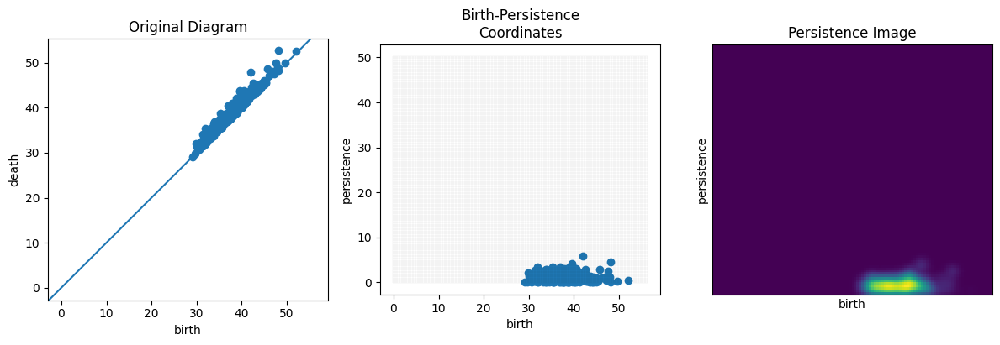

In [ ]:
PILayer.visualize(viz_dim=2)

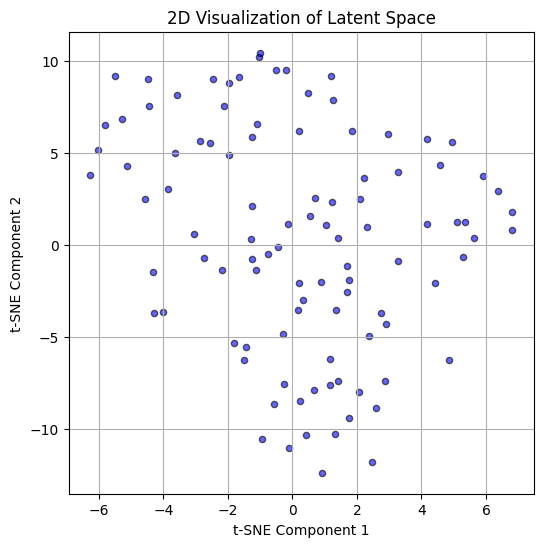

In [ ]:
# Reduce dimensionality further to 2D using t-SNE for visualization
tsne = TSNE(n_components=2, perplexity=50, random_state=42)
latent_2d = tsne.fit_transform(latent_space)

# Step 3: Select fewer points for visualization
num_points_to_plot = 100  # Adjust number of points
indices = np.random.choice(latent_2d.shape[0], num_points_to_plot, replace=False)
latent_subset = latent_2d[indices]

# Plot the latent space in 2D
plt.figure(figsize=(6, 6))
plt.scatter(latent_subset[:, 0], latent_subset[:, 1], c='blue', alpha=0.6, edgecolors='k', s=20)
plt.title("2D Visualization of Latent Space")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.grid(True)
plt.show()

In [ ]:
latent_subset.shape

(400, 2)

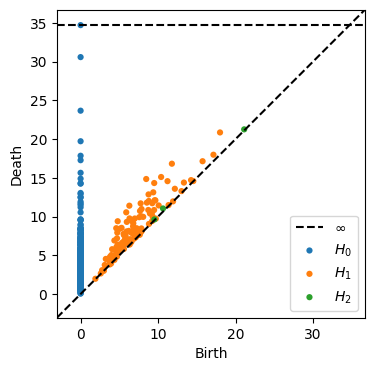

In [ ]:
# Compute persistent homology on the reduced data
diagrams_test = ripser(latent_reduced, metric="euclidean", maxdim=2)['dgms']

# Plot persistence barcode
plt.figure(figsize=(6, 4))
plot_diagrams(diagrams_test, show=True)

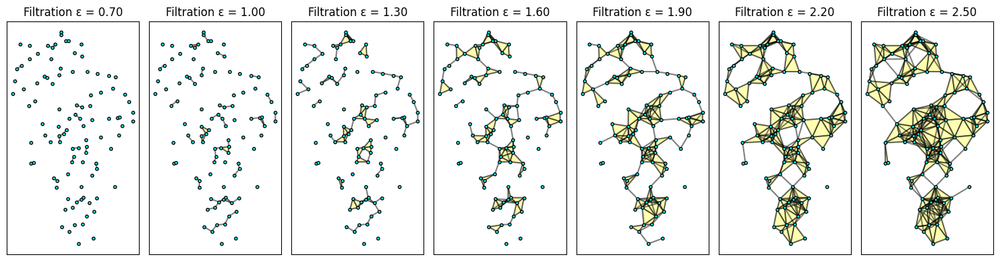

In [ ]:
# Function to plot filtration evolution
def plot_simplicial_complex(points, epsilon, ax):
    ax.scatter(points[:, 0], points[:, 1], c='cyan', edgecolors='black', s=10, zorder=3)

    # Connect edges based on distance threshold (epsilon)
    for i in range(len(points)):
        for j in range(i + 1, len(points)):
            if np.linalg.norm(points[i] - points[j]) < epsilon:
                ax.plot([points[i, 0], points[j, 0]], [points[i, 1], points[j, 1]], 'k-', alpha=0.5, zorder=2)

    # Compute and plot triangles within the filtration
    tri = Delaunay(points)
    for simplex in tri.simplices:
        if (np.linalg.norm(points[simplex[0]] - points[simplex[1]]) < epsilon and
            np.linalg.norm(points[simplex[1]] - points[simplex[2]]) < epsilon and
            np.linalg.norm(points[simplex[0]] - points[simplex[2]]) < epsilon):
            ax.fill(points[simplex, 0], points[simplex, 1], 'yellow', alpha=0.3, edgecolor='black', zorder=1)


    ax.set_title(f"Filtration ε = {epsilon:.2f}")
    ax.set_xticks([])
    ax.set_yticks([])

# Define filtration values
epsilons = [0.7, 1, 1.3, 1.6, 1.9, 2.2, 2.5]

# Create figure for filtration evolution
fig, axes = plt.subplots(1, len(epsilons), figsize=(15, 4))
for i, eps in enumerate(epsilons):
    plot_simplicial_complex(latent_subset, eps, axes[i])

plt.tight_layout()
plt.show()

# # Compute persistent homology on the reduced data
# diagrams = ripser(latent_reduced, metric="euclidean")['dgms']



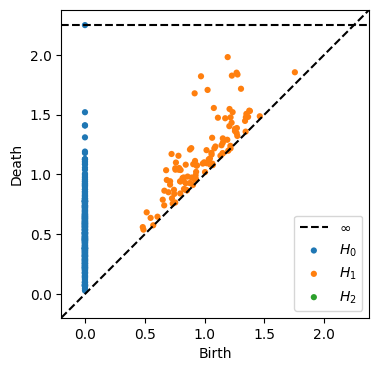

In [ ]:
# Compute persistent homology on the reduced data
diagrams_test = ripser(latent_subset, metric="euclidean", maxdim=2)['dgms']

# Plot persistence barcode
plt.figure(figsize=(6, 4))
plot_diagrams(diagrams_test, show=True)

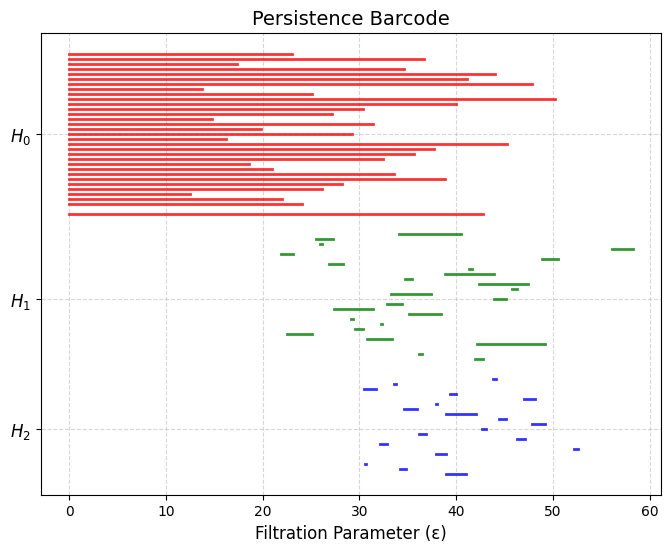

In [ ]:
# Function to group similar death values into bins
def filter_by_bin(diagram, bin_size=1.0):
    """
    Groups death values into bins of size 'bin_size' and keeps one representative per bin.
    """
    diagram = sorted(diagram, key=lambda bd: bd[1])  # Sort by death value
    filtered = []
    last_selected = -np.inf  # Track last added death value

    for birth, death in diagram:
        if death - last_selected > bin_size:  # Ensure we select one per bin
            filtered.append([birth, death])
            last_selected = death  # Update last selected value

    return np.array(filtered)

# Apply filtering to H0, H1
BIN_SIZE = 1.0  # Adjust bin size for more/fewer selections
H0_filtered = filter_by_bin(diagrams[0], bin_size=BIN_SIZE)
H1_filtered = filter_by_bin(diagrams[1], bin_size=BIN_SIZE)
H2_filtered = filter_by_bin(diagrams[2], bin_size=BIN_SIZE)


# Function to plot persistence barcode with separate lines for H0, H1, and H2
def plot_barcode(H0, H1, H2):
    colors = ['red', 'green', 'blue']  # H0 -> red, H1 -> green, H2 -> blue
    y_positions = []  # Stores y-tick positions
    labels = []  # Stores final y-labels

    fig, ax = plt.subplots(figsize=(8, 6))

    y_index = 0  # Keeps track of y-axis position

    # Shuffle H0, H1, and H2
    H0 = shuffle_array(H0)
    H1 = shuffle_array(H1)
    H2 = shuffle_array(H2)

    # Find middle indices for correct label placement
    middle_H0 = len(H0) // 2 if len(H0) > 0 else 0
    middle_H1 = len(H1) // 2 if len(H1) > 0 else 0
    middle_H2 = len(H2) // 2 if len(H2) > 0 else 0

    # Plot H0 bars (red)
    for indx, (birth, death) in enumerate(H0):
        ax.plot([birth, death], [y_index, y_index], lw=2, color='red', alpha=0.8)

        # Add label only at the middle index
        if indx == middle_H0 and len(H0) > 0:
            labels.append("$H_0$")
            y_positions.append(y_index)

        y_index -= 1  # Move to next line

    # Leave some space before H1
    y_index -= 3

    # Plot H1 bars (green)
    for indx, (birth, death) in enumerate(H1):
        ax.plot([birth, death], [y_index, y_index], lw=2, color='green', alpha=0.8)

        # Add label only at the middle index
        if indx == middle_H1 and len(H1) > 0:
            labels.append("$H_1$")
            y_positions.append(y_index)

        y_index -= 1  # Move to next line

    # Leave some space before H2
    y_index -= 3

    # Plot H2 bars (blue)
    for indx, (birth, death) in enumerate(H2):
        ax.plot([birth, death], [y_index, y_index], lw=2, color='blue', alpha=0.8)

        # Add label only at the middle index
        if indx == middle_H2 and len(H2) > 0:
            labels.append("$H_2$")
            y_positions.append(y_index)

        y_index -= 1  # Move to next line

    # Set only the meaningful y-labels
    ax.set_yticks(y_positions)
    ax.set_yticklabels(labels, fontsize=12)
    ax.set_xlabel("Filtration Parameter (ε)", fontsize=12)
    ax.set_title("Persistence Barcode", fontsize=14)
    ax.grid(True, linestyle="--", alpha=0.5)
    plt.show()

# Plot the spread persistence barcode
plot_barcode(H0_filtered, H1_filtered, H2_filtered)

### Visualize persistence homology as epsilon is increasing

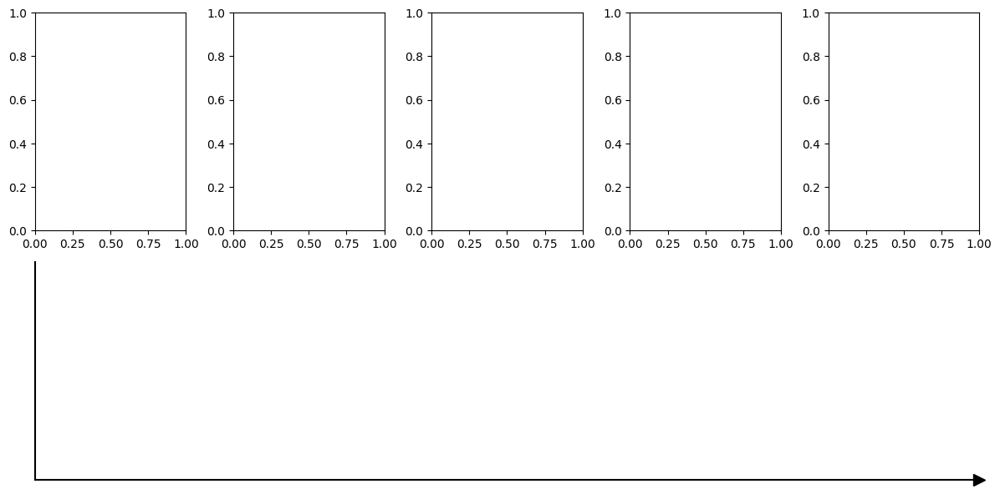

In [ ]:
import matplotlib.gridspec as gridspec

def create_dynamic_layout(num_subfigs, figsize=(12, 6)):
    """
    Create a figure layout with `num_subfigs` in the top row and one wide subplot at the bottom.

    Parameters:
    - num_subfigs (int): Number of subfigures in the top row.
    - figsize (tuple): Size of the entire figure (default: (12,6)).

    Returns:
    - fig, axes (tuple): The figure and a list of subplot axes.
    """
    fig = plt.figure(figsize=figsize)
    gs = gridspec.GridSpec(2, num_subfigs, height_ratios=[1, 1])  # Define a 2-row layout

    # Create the top row of subplots (small subfigures)
    ax_subfigs = [plt.subplot(gs[0, i]) for i in range(num_subfigs)]

    # Create the bottom wide subplot (now at the bottom)
    ax_bottom = plt.subplot(gs[1, :])  # Span all columns in the second row

    # Adjust layout to prevent overlap
    plt.tight_layout()

    return fig, ax_subfigs + [ax_bottom]  # Return subfigs first, then the wide figure


def create_dynamic_layout_arrow(num_subfigs, figsize=(12, 6)):
    """
    Create a figure layout with `num_subfigs` in the top row and one wide subplot at the bottom.

    Parameters:
    - num_subfigs (int): Number of subfigures in the top row.
    - figsize (tuple): Size of the entire figure (default: (12,6)).

    Returns:
    - fig, axes (tuple): The figure and a list of subplot axes.
    """
    fig = plt.figure(figsize=figsize)
    gs = gridspec.GridSpec(2, num_subfigs, height_ratios=[1, 1])  # Define a 2-row layout

    # Create the top row of subplots (small subfigures)
    ax_subfigs = [plt.subplot(gs[0, i]) for i in range(num_subfigs)]

    # Create the bottom wide subplot
    ax_bottom = plt.subplot(gs[1, :])  # Span all columns in the second row

    # Style the x-axis (positioned at the bottom) with arrows at both ends
    ax_bottom.spines['bottom'].set_linewidth(1.5)  # Set axis line width
    ax_bottom.spines['bottom'].set_color('black')  # Set axis color
    ax_bottom.spines['bottom'].set_position(('outward', 0))  # Ensure x-axis is at the bottom edge

    # Add arrows to x-axis (using x-axis transform to position at ends)
    ax_bottom.plot(60, 0, ">k", transform=ax_bottom.get_xaxis_transform(), clip_on=False, markersize=10)


    # Hide top and right spines (keep bottom and left visible)
    for spine in ['top', 'right']:
        ax_bottom.spines[spine].set_visible(False)

    # Ensure y-axis is visible with no ticks or arrow
    ax_bottom.spines['left'].set_visible(True)
    ax_bottom.spines['left'].set_linewidth(1.5)  # Match x-axis line width
    ax_bottom.spines['left'].set_color('black')  # Match x-axis color

    # Hide y-axis ticks and labels (as in your image)
    ax_bottom.set_yticks([])  # No y-axis ticks
    ax_bottom.set_ylabel('')  # No y-axis label

    # Set tick parameters for x-axis (standard ticks on x-axis only)
    ax_bottom.tick_params(axis='x', direction='out', length=6, width=1)

    # Set limits and ticks to match your image
    ax_bottom.set_xlim(0, 60)  # Match the x-range
    ax_bottom.set_ylim(0, 100.0)  # Match the y-range
    ax_bottom.set_xticks([])  # Match x-ticks

    # Ensure the layout doesn't overlap and adjust spacing
    plt.tight_layout(pad=1.0)

    return fig, ax_subfigs + [ax_bottom]

# Example usage:
fig, axes = create_dynamic_layout_arrow(5)  # Creates 5 subfigs above and 1 wide subplot below
plt.show()

In [ ]:
from operator import length_hint
# New function to plot Vietoris-Rips filtration (simplicial complex) with colorful triangles
def plot_vietoris_rips_complex(points, epsilon, ax):
    """
    Plot a Vietoris-Rips complex for a 2D point cloud at a given filtration parameter ε,
    with colorful triangles matching your image.

    Parameters:
    - points: NumPy array of shape (n_points, 2) representing 2D points
    - epsilon: Scalar filtration parameter (distance threshold)
    - ax: Matplotlib axes object for plotting
    """
    # Plot points (vertices) in black
    ax.scatter(points[:, 0], points[:, 1], c='lightcyan', edgecolors='black', s=10, zorder=3)

    # Connect edges based on distance threshold (epsilon)
    for i in range(len(points)):
        for j in range(i + 1, len(points)):
            if np.linalg.norm(points[i] - points[j]) < epsilon:
                ax.plot([points[i, 0], points[j, 0]], [points[i, 1], points[j, 1]],
                        'k-', alpha=0.5, zorder=2)

    # Compute and plot triangles within the filtration with colorful fills
    tri = Delaunay(points)
    colors = ['yellow', 'green', 'red', 'purple']  # Cycle through colors for triangles, matching your image
    color_idx = 0
    for simplex in tri.simplices:
        if (np.linalg.norm(points[simplex[0]] - points[simplex[1]]) < epsilon and
            np.linalg.norm(points[simplex[1]] - points[simplex[2]]) < epsilon and
            np.linalg.norm(points[simplex[0]] - points[simplex[2]]) < epsilon):
            ax.fill(points[simplex, 0], points[simplex, 1],
                    colors[color_idx % len(colors)], alpha=0.3, edgecolor='black', zorder=1)
            color_idx += 1  # Cycle through colors for variety

    ax.set_title(f"ε = {epsilon:.2f}")
    ax.set_xticks([])
    ax.set_yticks([])

# Modified function to plot persistence barcode matching your desired style (right image)
def plot_persistence_barcode(H0, H1, H2, ax, epsilons):
    """
    Plot persistence barcodes for H0, H1, and H2 on a single axis, matching your desired layout
    with shuffled bars, middle labels, one red line from 0 to infinity for H0, and dashed vertical lines.

    Parameters:
    - H0, H1, H2: NumPy arrays of (birth, death) pairs for each homology dimension
    - ax: Matplotlib axes object for plotting
    - epsilons: List of ε values from filtration for dashed lines
    """
    colors = ['red', 'green', 'blue']  # H0 -> red, H1 -> green, H2 -> blue
    y_positions = []  # Stores y-tick positions
    labels = []  # Stores final y-labels

    y_index = 100  # Keeps track of y-axis position

    # # Plot dashed vertical lines for each ε value (matching your image)
    # for eps in epsilons:
    #     ax.axvline(x=eps, color='blue', linestyle='--', alpha=0.3, zorder=0)

    # Shuffle H0, H1, and H2
    H0 = shuffle_array(H0)
    H1 = shuffle_array(H1)
    H2 = shuffle_array(H2)

    # Find middle indices for correct label placement
    middle_H0 = len(H0) // 2 if len(H0) > 0 else 0
    middle_H1 = len(H1) // 2 if len(H1) > 0 else 0
    middle_H2 = len(H2) // 2 if len(H2) > 0 else 0

    # Plot H0 bars (red), including one persistent line from 0 to infinity
    # Ensure at least one persistent feature (0, inf) if not already present
    if len(H0) == 0 or not np.any(np.isinf(H0[:, 1])):
        H0 = np.vstack((H0, [0, np.inf]))  # Add persistent feature if none exists

    for indx, (birth, death) in enumerate(H0):

        ax.plot([birth, death], [y_index, y_index], lw=2, color='red', alpha=0.8)

        # Add label only at the middle index
        if indx == middle_H0 and len(H0) > 0:
            labels.append("$H_0$")
            y_positions.append(y_index)

        y_index -= 1  # Move to next line

    # Leave some space before H1
    y_index -= 2

    # Plot H1 bars (green)
    for indx, (birth, death) in enumerate(H1):

        ax.plot([birth, death], [y_index, y_index], lw=2, color='green', alpha=0.8)

        # Add label only at the middle index
        if indx == middle_H1 and len(H1) > 0:
            labels.append("$H_1$")
            y_positions.append(y_index)

        y_index -= 1  # Move to next line

    # Leave some space before H2
    y_index -= 2

    h2_start = min(1, y_index)  # Ensure H2 starts at y=1 or higher to create spacing from y=0

    # Plot H2 bars (blue)
    for indx, (birth, death) in enumerate(H2):

        y_pos = h2_start - indx  # Decrease y-position for each bar, but ensure it stays above y=0

        ax.plot([birth, death], [y_index, y_index], lw=2, color='blue', alpha=0.8)

        # Add label only at the middle index
        if indx == middle_H2 and len(H2) > 0:
            labels.append("$H_2$")
            y_positions.append(y_index)

        y_index -= 1  # Move to next line

    ax.set_yticks(y_positions)
    ax.set_yticklabels(labels, fontsize=12)
    ax.set_xlabel("Filtration Parameter (ε)", fontsize=12)
    # ax.set_title("Persistence Barcode", fontsize=14)
    ax.grid(True, linestyle="--", alpha=0.5)

# Main function to create the combined visualization with a gap
def plot_filtration_and_barcodes(diagrams, points, epsilons):
    """
    Create a combined visualization of Vietoris-Rips filtration progression and persistence barcodes
    with a gap between them, matching your image layout.

    Parameters:
    - points: NumPy array of shape (n_points, 2) representing 2D points
    - epsilons: List of increasing ε values for the filtration
    """

    # Apply filtering to H0, H1
    BIN_SIZE = 1.0  # Adjust bin size for more/fewer selections
    H0_filtered = filter_by_bin(diagrams[0], bin_size=BIN_SIZE)
    H1_filtered = filter_by_bin(diagrams[1], bin_size=BIN_SIZE)
    H2_filtered = filter_by_bin(diagrams[2], bin_size=BIN_SIZE)

    fig, axes = create_dynamic_layout_arrow(len(epsilons))  # Creates 5 subfigs above and 1 wide subplot below
    sub_fig_per_homology = axes[:-1]
    fig_barcode = axes[-1]

    # gs_top = fig.add_gridspec(1, len(epsilons), height_ratios=[1], bottom=0.6, wspace=0.1)  # Adjust bottom to create gap
    for i, eps in enumerate(epsilons):
        plot_vietoris_rips_complex(points, eps, sub_fig_per_homology[i])

    plot_persistence_barcode(H0_filtered, H1_filtered, H2_filtered, fig_barcode, epsilons)

    plt.tight_layout()
    plt.show()

In [ ]:
# Function to group similar death values into bins
def filter_by_bin(diagram, bin_size=1.0):
    """
    Groups death values into bins of size 'bin_size' and keeps one representative per bin.
    """
    diagram = sorted(diagram, key=lambda bd: bd[1])  # Sort by death value
    filtered = []
    last_selected = -np.inf  # Track last added death value

    for birth, death in diagram:
        if death - last_selected > bin_size:  # Ensure we select one per bin
            filtered.append([birth, death])
            last_selected = death  # Update last selected value

    return np.array(filtered)

# Apply filtering to H0, H1
BIN_SIZE = 1.0  # Adjust bin size for more/fewer selections
H0_filtered = filter_by_bin(diagrams[0], bin_size=BIN_SIZE)
H1_filtered = filter_by_bin(diagrams[1], bin_size=BIN_SIZE)
H2_filtered = filter_by_bin(diagrams[2], bin_size=BIN_SIZE)

In [ ]:
# Function to shuffle NumPy arrays
def shuffle_array(arr):
    shuffled_arr = arr.copy()
    np.random.shuffle(shuffled_arr)
    return shuffled_arr

# Function to select N features randomly
def select_top_persistent(features, n=10):
    if len(features) == 0:
        return np.array([])
    # Ensure n does not exceed the number of features
    n = min(n, len(features))
    # Use np.random.choice to select random indices
    random_indices = np.random.choice(len(features), size=n, replace=False)
    # Return the randomly selected features
    return features[random_indices]

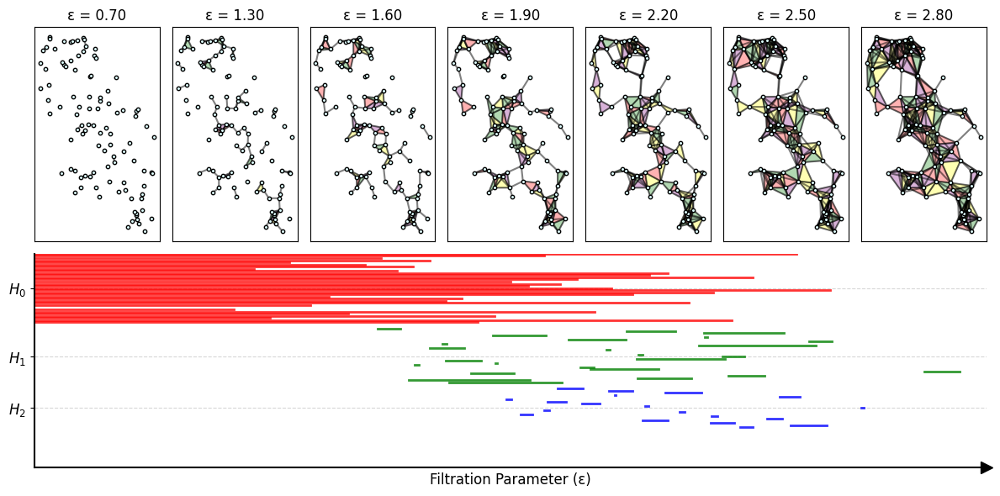

In [ ]:
# Define filtration values
epsilons = [0.7, 1.3, 1.6, 1.9, 2.2, 2.5, 2.8]

latent_space = np.rot90(point_feature)

# Reduce dimensionality using PCA (to 50D for efficiency)
pca = PCA(n_components=10)
latent_reduced = pca.fit_transform(latent_space)

diagrams = ripser(latent_reduced, metric="euclidean", maxdim=2)['dgms']

# Get latent subset
tsne = TSNE(n_components=2, perplexity=50, random_state=42)
latent_2d = tsne.fit_transform(latent_space)

# Step 3: Select fewer points for visualization
num_points_to_plot = 100  # Adjust number of points
indices = np.random.choice(latent_2d.shape[0], num_points_to_plot, replace=False)
latent_subset = latent_2d[indices]

plot_filtration_and_barcodes(diagrams, latent_subset, epsilons)


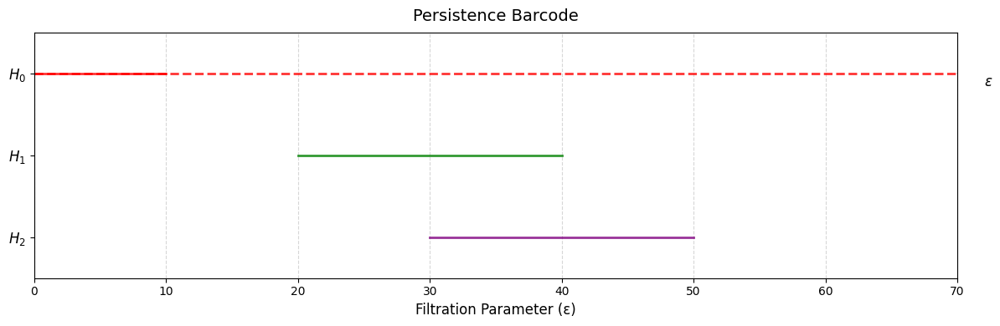

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Create a figure with a single subplot
fig, ax = plt.subplots(figsize=(12, 4))  # Adjust size to match your image

# Define ε values for dashed lines (e.g., from your filtration stages)
epsilons = [0.70, 1.00, 1.30, 1.60, 1.90, 2.20, 2.50]  # Adjust based on your data

# Define y-positions for each homology group (bands)
y_positions = [0, -2, -4]  # Positions for H0, H1, H2 (middle of each band)

# Labels for homology groups
homology_labels = ['$H_0$', '$H_1$', '$H_2$']

# Plot placeholder bars (you'll replace with actual data)
# H0 (red bars, some persistent to infinity)
ax.plot([0, 10], [0, 0], 'r-', lw=2, alpha=0.8)  # Example H0 bar
ax.plot([0, 70], [0, 0], 'r--', lw=2, alpha=0.8)  # Persistent H0 feature to infinity

# H1 (green bars, some persistent)
ax.plot([20, 40], [-2, -2], 'g-', lw=2, alpha=0.8)  # Example H1 bar

# H2 (purple bars, one persistent)
ax.plot([30, 50], [-4, -4], 'purple', lw=2, alpha=0.8)  # Example H2 bar

# Set y-ticks and labels for homology groups
ax.set_yticks(y_positions)
ax.set_yticklabels(homology_labels, fontsize=12)

# Set x-axis with arrow and ε label
ax.set_xlim(0, 70)  # Adjust based on your data range
ax.set_ylim(-5, 1)  # Adjust to fit all bands and labels
ax.set_xlabel("Filtration Parameter (ε)", fontsize=12)
ax.grid(True, linestyle="--", alpha=0.5, axis='x')  # Dashed x-axis grid

# Add arrow to x-axis
ax.arrow(70, 0, 2, 0, head_width=0.1, head_length=0.5, fc='k', ec='k', alpha=0.5)
ax.text(72, -0.2, r'$\epsilon$', fontsize=12, verticalalignment='center')

# Remove y-axis grid and minor ticks for minimal styling
ax.grid(False, axis='y')
ax.set_yticks([], minor=True)

# Title
ax.set_title("Persistence Barcode", fontsize=14, pad=10)

plt.tight_layout()
plt.show()

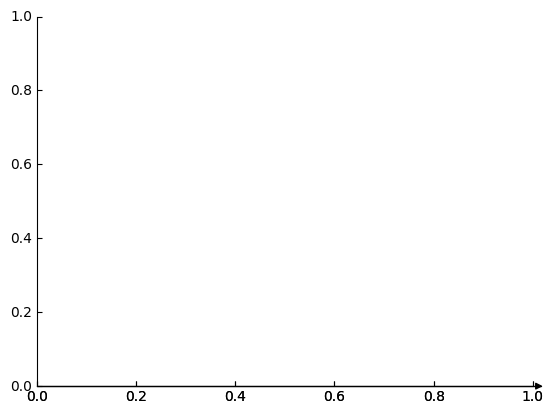

In [ ]:
from mpl_toolkits.axisartist.axislines import SubplotZero
import matplotlib.pyplot as plt
import numpy as np


fig = plt.figure()
ax = SubplotZero(fig, 111)
fig.add_subplot(ax)

for direction in ["xzero"]:
    # adds arrows at the ends of each axis
    ax.axis[direction].set_axisline_style("-|>")

    # adds X and Y-axis from the origin
    ax.axis[direction].set_visible(True)

for direction in ["right", "top"]: # ,  , , "bottom"
    # hides borders
    ax.axis[direction].set_visible(False)

# x = np.linspace(-0.5, 1., 100)
# ax.plot(x, np.sin(x*np.pi))

plt.show()

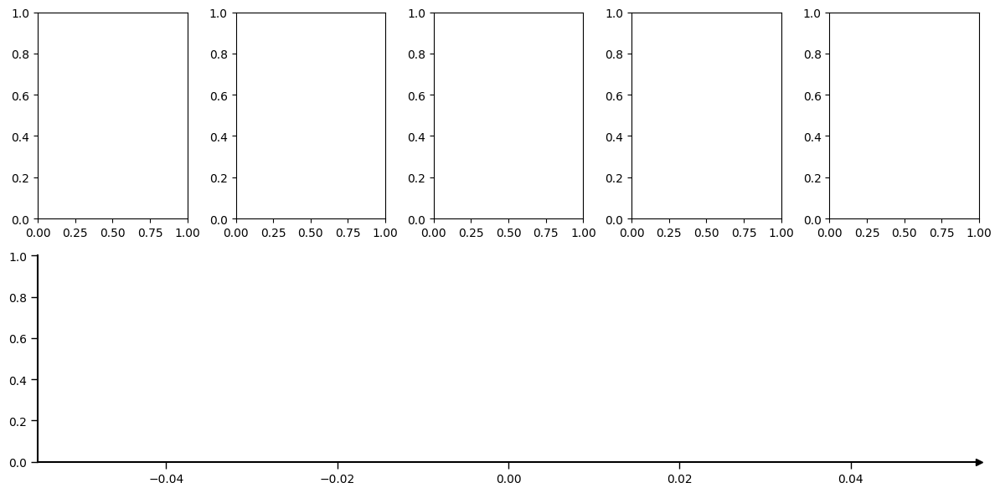

In [ ]:
import matplotlib.gridspec as gridspec

def test_create_dynamic_layout(num_subfigs, figsize=(12, 6)):
    """
    Create a figure layout with `num_subfigs` in the top row and one wide subplot at the bottom.

    Parameters:
    - num_subfigs (int): Number of subfigures in the top row.
    - figsize (tuple): Size of the entire figure (default: (12,6)).

    Returns:
    - fig, axes (tuple): The figure and a list of subplot axes.
    """
    fig = plt.figure(figsize=figsize)
    gs = gridspec.GridSpec(2, num_subfigs, height_ratios=[1, 1])  # Define a 2-row layout

    # Create the top row of subplots (small subfigures)
    ax_subfigs = [plt.subplot(gs[0, i]) for i in range(num_subfigs)]

    # Create the bottom wide subplot
    ax_bottom = plt.subplot(gs[1, :])  # Span all columns in the second row

    # Style the x-axis with arrows at both ends
    ax_bottom.spines['bottom'].set_linewidth(1.5)  # Set axis line width
    ax_bottom.spines['bottom'].set_color('black')  # Set axis color

    # Add arrows to x-axis (using fancy arrow patch at the ends)
    ax_bottom.plot(1, 0, ">k", transform=ax_bottom.get_yaxis_transform(), clip_on=False)
    # ax_bottom.plot(0, 0, "<k", transform=ax_bottom.get_yaxis_transform(), clip_on=False)

    # Hide top and right spines (keep bottom and left visible)
    for spine in ['top', 'right']:
        ax_bottom.spines[spine].set_visible(False)

    # Position the x-axis at y=0
    ax_bottom.spines['bottom'].set_position('zero')

    # Ensure y-axis is visible with standard ticks and labels (no arrow)
    ax_bottom.spines['left'].set_visible(True)
    ax_bottom.spines['left'].set_linewidth(1.5)  # Match x-axis line width
    ax_bottom.spines['left'].set_color('black')  # Match x-axis color

    # Set tick parameters to match the image (standard ticks on both axes)
    ax_bottom.tick_params(axis='both', direction='out', length=6, width=1)

    # Set limits and ticks to match your image (adjust as needed)
    ax_bottom.set_xlim(-0.04, 0.04)  # Match the x-range in your image
    ax_bottom.set_ylim(0, 1.0)       # Match the y-range in your image
    ax_bottom.set_xticks([-0.04, -0.02, 0.0, 0.02, 0.04])  # Match x-ticks
    ax_bottom.set_yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])   # Match y-ticks

    # Ensure the layout doesn't overlap
    plt.tight_layout()

    return fig, ax_subfigs + [ax_bottom]


# Example usage:
fig, axes = test_create_dynamic_layout(5)  # Creates 5 subfigs above and 1 wide subplot below
plt.show()

# Check GFLOPs on sparse convolution

In [ ]:
!nvidia-smi

Tue Mar 25 17:06:14 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   53C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
!pip install spconv

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 30.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 36.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.7/73.7 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.3/243.3 kB 14.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.0/111.0 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 422.8/422.8 kB 13.9 MB/s eta 0:00:00
  Created wheel for fire: filename=fire-0.7.0-py3-none-any.whl size=114249 sha256=57efa2c90dede1b130734b258323c3dcc61d8a6520ba16c4baaaa529ca9f867b
  Stored in directory: /root/.cache/pip/wheels/46/54/24/1624fd5b8674eb1188623f7e8e17cdf7c0f6c24b609dfb8a89
Successfully built fire


In [ ]:
import torch
import torch.nn as nn
import spconv.pytorch as spconv
import time

FileNotFoundError: [Errno 2] No such file or directory: 'nvidia-smi'

In [ ]:
0.43+0.33+0.86+4.12+4.62

10.36

In [ ]:
3.34+9.89+26.91+195.11+146

381.25

In [ ]:
22.58 / 0.6

37.63333333333333

In [ ]:
45.16/1.2

37.63333333333333

# GFLOPs, memory, FPS in progression of various point size

## Sample

In [ ]:
!pip install seaborn

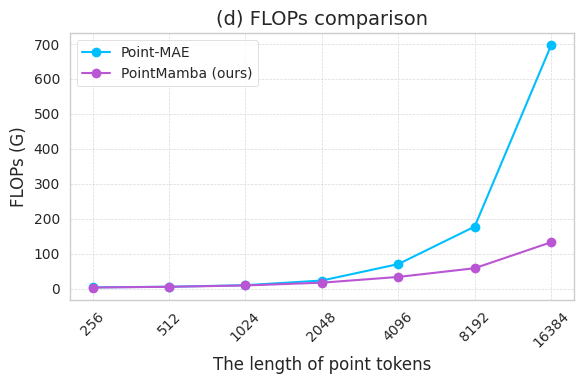

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
plt.rcParams['font.family'] = 'DejaVu Sans'  # Default font that works on most systems

# Token lengths (x-axis)
tokens = [256, 512, 1024, 2048, 4096, 8192, 16384, 32768]

# Load FLOPs from the logs for both teacher (Point-MAE) and student (PointMamba)
pointmae_flops = [3.86, 5.61, 9.91, 23.34, 70.33, 177.68, 696.02, 1294.86]
pointmamba_flops = [3.35, 5.39, 9.23, 17.18, 33.58, 58.57, 132.88, 237.74]


# Correct the data for 32768 tokens to match the target image
pointmae_flops_corrected = [3.86, 5.61, 9.91, 23.34, 70.33, 177.68, 696.02]
pointmamba_flops_corrected = [3.35, 5.39, 9.23, 17.18, 33.58, 58.57, 132.88]
tokens_trimmed = tokens[:7]  # Up to 32768

# Re-plot
plt.figure(figsize=(6, 4))
plt.plot(tokens_trimmed, pointmae_flops_corrected, marker='o', color='deepskyblue', label='Point-MAE')
plt.plot(tokens_trimmed, pointmamba_flops_corrected, marker='o', color='mediumorchid', label='PointMamba (ours)')

# Annotate last values and speedup
plt.annotate('696.02', xy=(32768, 696.02), xytext=(32768, 720), ha='center', fontsize=9)
plt.annotate('132.88', xy=(32768, 132.88), xytext=(32768, 110), ha='center', fontsize=9)
plt.annotate('5.2 ×', xy=(32768, 400), color='red', fontsize=11)
plt.annotate('', xy=(32768, 660), xytext=(32768, 140),
             arrowprops=dict(arrowstyle='<->', color='red', lw=2))

# Axis and style
plt.xscale('log', base=2)
plt.xticks(tokens_trimmed, tokens_trimmed, rotation=45)
plt.xlabel('The length of point tokens')
plt.ylabel('FLOPs (G)')
plt.title('(d) FLOPs comparison')
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


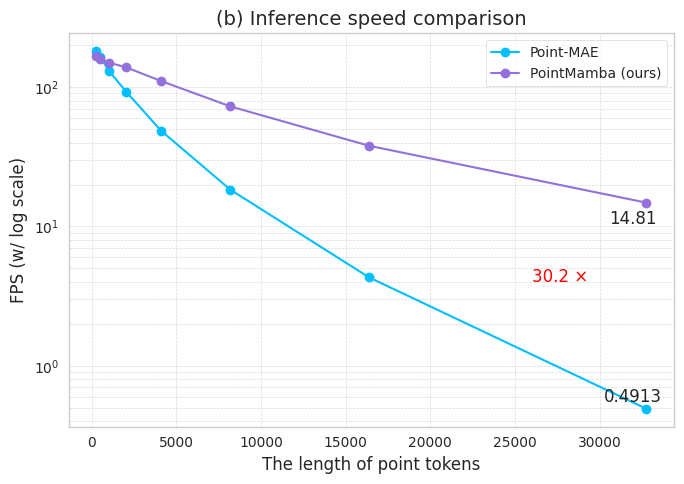

In [ ]:
# Data for Inference Speed (figure b)
point_tokens = [256, 512, 1024, 2048, 4096, 8192, 16384, 32768]
fps_pointmae = [180.92, 163.81, 130.27, 92.18, 48.61, 18.34, 4.31, 0.4913]
fps_pointmamba = [167.41, 158.25, 149.97, 138.34, 110.53, 72.66, 37.91, 14.81]

# Plotting on a log scale for y-axis (log-y)
plt.figure(figsize=(7, 5))
plt.plot(point_tokens, fps_pointmae, '-o', color='deepskyblue', label='Point-MAE')
plt.plot(point_tokens, fps_pointmamba, '-o', color='mediumpurple', label='PointMamba (ours)')
plt.yscale("log")

# Annotate FPS values and the 30.2x speed difference
plt.annotate("0.4913", (32768, 0.4913), textcoords="offset points", xytext=(-10, 5), ha='center')
plt.annotate("14.81", (32768, 14.81), textcoords="offset points", xytext=(-10, -15), ha='center')
plt.annotate("30.2 ×", xy=(32768, 2.5), xytext=(26000, 4), color='red', fontsize=12)

# Labels and title
plt.xlabel("The length of point tokens")
plt.ylabel("FPS (w/ log scale)")
plt.title("(b) Inference speed comparison")
plt.legend()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)

plt.tight_layout()
plt.show()


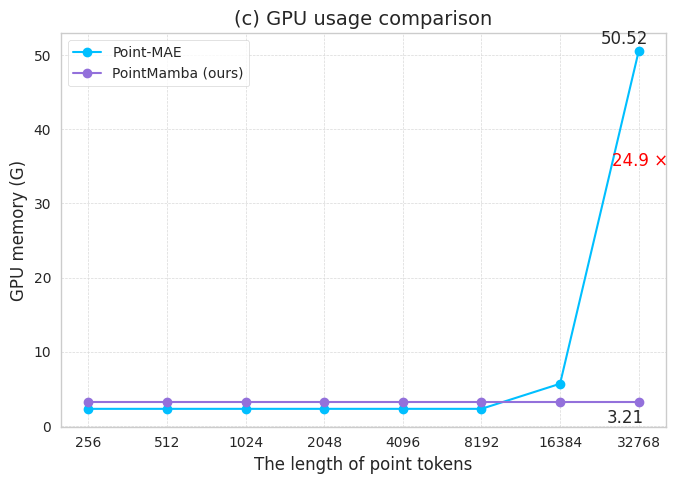

In [ ]:
# Data for GPU usage (figure c)
point_tokens = [256, 512, 1024, 2048, 4096, 8192, 16384, 32768]
gpu_pointmae = [2.33, 2.33, 2.33, 2.33, 2.33, 2.33, 5.71, 50.52]
gpu_pointmamba = [3.21] * len(point_tokens)  # constant usage

# Plotting
plt.figure(figsize=(7, 5))
plt.plot(point_tokens, gpu_pointmae, '-o', color='deepskyblue', label='Point-MAE')
plt.plot(point_tokens, gpu_pointmamba, '-o', color='mediumpurple', label='PointMamba (ours)')

# Annotate the peak memory usage difference
plt.annotate("50.52", (32768, 50.52), textcoords="offset points", xytext=(-10, 5), ha='center')
plt.annotate("3.21", (32768, 3.21), textcoords="offset points", xytext=(-10, -15), ha='center')
plt.annotate("24.9 ×", xy=(32768, 30), xytext=(26000, 35), color='red', fontsize=12)
plt.annotate("OOM", xy=(65536, 70), xytext=(30000, 70), textcoords='data',
             ha='center', color='red', fontsize=12, fontweight='bold',
             arrowprops=dict(facecolor='red', shrink=0.05))

# Formatting
plt.xscale('log', base=2)
plt.xticks(point_tokens, point_tokens)
plt.xlabel("The length of point tokens")
plt.ylabel("GPU memory (G)")
plt.title("(c) GPU usage comparison")
plt.legend()
plt.grid(True, linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

## Real

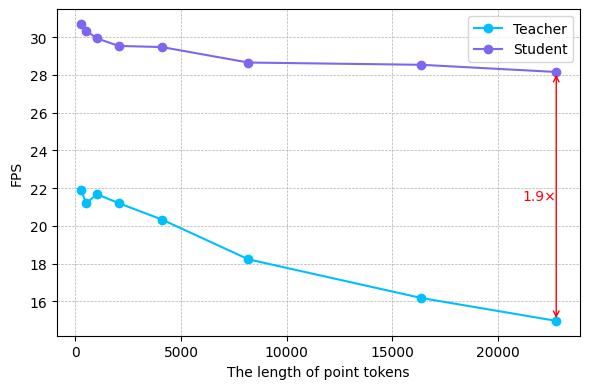

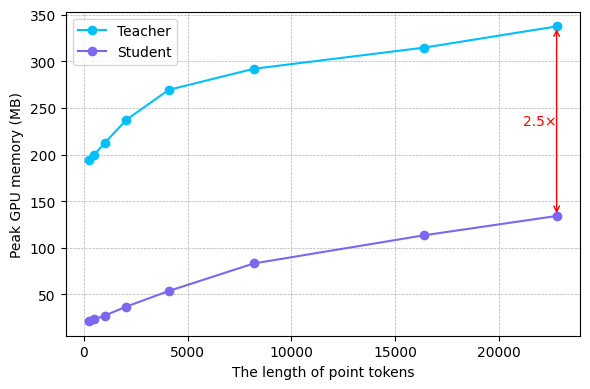

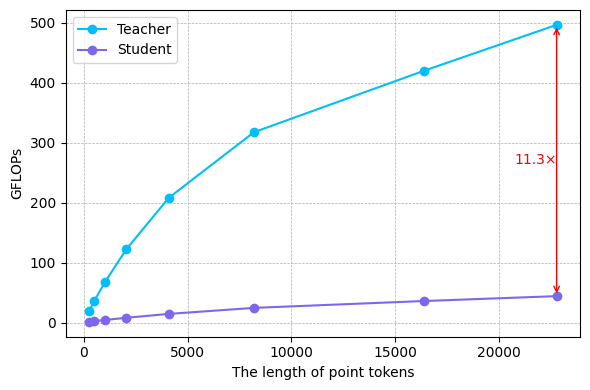

In [ ]:
# Re-import required libraries after code execution state reset
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np

# Data from image
point_sizes = [256, 512, 1024, 2048, 4096, 8192, 16384, 22764]

# Student data
fps_student = [30.7, 30.33, 29.93, 29.53, 29.47, 28.65, 28.53, 28.15]
gpu_student = [21.58, 23.38, 27.46, 36.99, 53.76, 83.29, 113.45, 134.18]
flops_student = [1.146, 2.27, 4.3025, 7.985, 14.435, 24.47, 35.944, 44.064]

# Teacher data
fps_teacher = [21.92, 21.2, 21.67, 21.2, 20.33, 18.22, 16.17, 14.96]
gpu_teacher = [194.39, 199.99, 212.71, 237.18, 269.4, 291.98, 314.64, 337.41]
flops_teacher = [18.81143, 36.176, 67.60222, 122.15, 208.117, 317.562, 420.148, 496.658]

# Common style for plots
def plot_fps_comparison(point_sizes, fps_student, fps_teacher, filename=None):
    plt.figure(figsize=(6, 4))
    plt.plot(point_sizes, fps_teacher, 'o-', color='deepskyblue', label='Teacher')
    plt.plot(point_sizes, fps_student, 'o-', color='mediumslateblue', label='Student')

    # Compute ratio and midpoint
    ratio = fps_student[-1] / fps_teacher[-1]  # FPS: student is usually faster
    x = point_sizes[-1]
    y_bottom = fps_teacher[-1]
    y_top = fps_student[-1]
    y_mid = (y_bottom + y_top) / 2

    # Draw vertical arrow
    plt.annotate('',
                 xy=(x, y_top),
                 xytext=(x, y_bottom),
                 arrowprops=dict(arrowstyle='<->', color='red'))

    # Add ratio text
    plt.text(x, y_mid, f'{ratio:.1f}×', color='red', fontsize=10, ha='right', va='center')

    plt.xlabel('The length of point tokens')
    plt.ylabel('FPS')
    plt.legend()
    plt.grid(True, linestyle='--', linewidth=0.5)
    plt.tight_layout()

    if filename:
        plt.savefig(filename, dpi=300, bbox_inches='tight')

    plt.show()


def plot_gpu_comparison(point_sizes, gpu_student, gpu_teacher, filename=None):
    plt.figure(figsize=(6, 4))
    plt.plot(point_sizes, gpu_teacher, 'o-', color='deepskyblue', label='Teacher')
    plt.plot(point_sizes, gpu_student, 'o-', color='mediumslateblue', label='Student')

    # Compute ratio and midpoint
    ratio = gpu_teacher[-1] / gpu_student[-1]
    x = point_sizes[-1]
    y_bottom = gpu_student[-1]
    y_top = gpu_teacher[-1]
    y_mid = (y_bottom + y_top) / 2

    # Draw vertical arrow
    plt.annotate('',
                 xy=(x, y_top),
                 xytext=(x, y_bottom),
                 arrowprops=dict(arrowstyle='<->', color='red'))

    # Add ratio text
    plt.text(x, y_mid, f'{ratio:.1f}×', color='red', fontsize=10, ha='right', va='center')

    plt.xlabel('The length of point tokens')
    plt.ylabel('Peak GPU memory (MB)')
    plt.legend()
    plt.grid(True, linestyle='--', linewidth=0.5)
    plt.tight_layout()

    if filename:
        plt.savefig(filename, dpi=300, bbox_inches='tight')

    plt.show()



def plot_flops_comparison(point_sizes, flops_student, flops_teacher, filename=None):
    plt.figure(figsize=(6, 4))
    plt.plot(point_sizes, flops_teacher, 'o-', color='deepskyblue', label='Teacher')
    plt.plot(point_sizes, flops_student, 'o-', color='mediumslateblue', label='Student')

    # Compute ratio and midpoint
    ratio = flops_teacher[-1] / flops_student[-1]
    x = point_sizes[-1]
    y_bottom = flops_student[-1]
    y_top = flops_teacher[-1]
    y_mid = (y_bottom + y_top) / 2

    # Draw vertical arrow
    plt.annotate('',
             xy=(x, y_top),  # arrow head
             xytext=(x, y_bottom),  # arrow tail
             arrowprops=dict(arrowstyle='<->', color='red'),
             fontsize=10, color='red', ha='center')


    # Add text manually at midpoint
    plt.text(x, y_mid, f'{ratio:.1f}×', color='red', fontsize=10, ha='right', va='center')

    plt.xlabel('The length of point tokens')
    plt.ylabel('GFLOPs')
    plt.legend()
    plt.grid(True, linestyle='--', linewidth=0.5)
    plt.tight_layout()

    if filename:
        plt.savefig(filename, dpi=300, bbox_inches='tight')

    plt.show()


point_sizes = [256, 512, 1024, 2048, 4096, 8192, 16384, 22764]

# Draw the figures
plot_fps_comparison(point_sizes, fps_student, fps_teacher, 'fps_comparison')
plot_gpu_comparison(point_sizes, gpu_student, gpu_teacher, 'gpu_comparison')
plot_flops_comparison(point_sizes, flops_student, flops_teacher, 'flops_comparison') # flops_student


In [ ]:
import plotly.graph_objects as go

categories = ['Nusences','SemanticKITTI','Waymo',
              'FPS', '#Parameters']

fig = go.Figure()

fig.add_trace(go.Scatterpolar(
      r=[83.0, 75.5, 72.1, 16.6, 46.2],
      theta=categories,
      fill='toself',
      name='Ptv3(teacher)'
))

fig.add_trace(go.Scatterpolar(
      r=[78.1, 71.2, 65.9, 27.6, 2.78],
      theta=categories,
      fill='toself',
      name='Ptv3(student)'
))

fig.add_trace(go.Scatterpolar(
      r=[76, 68.9, 0, 13.16, 50],
      theta=categories,
      fill='toself',
      name='Cylinder3D 0.5× + PVD'
))

fig.add_trace(go.Scatterpolar(
      r=[71.3, 69.6, 70, 8.7, 21.8],
      theta=categories,
      fill='toself',
      name='UMKD'
))


fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=True,
      range=[50, 85]
    )),
  showlegend=True
)

fig.show()

In [ ]:
import plotly.graph_objects as go
import numpy as np

# Define the categories and raw data (excluding RPV)
categories = ['nuScenes', 'SemanticKITTI', 'Waymo', 'FPS', '# Parameters']
ptv3_teacher = [83.0, 75.5, 72.1, 16.61, 46.16]
ptv3_student = [78.01, 71.2, 65.9, 27.64, 2.78]
cylinder3d_pvd = [76.0, 68.9, 0, 13.16, 50.0]
tpv_igkd = [67.2, 69.3, 0, 8.7, 146.18]
umkd = [71.3, 69.6, 70.0, 8.7, 21.8]
cmdfusion = [80.8, 71.6, 0, 8.0, 7.04]

# Maximum values for each metric (for labeling)
max_values = [83.0, 75.5, 72.1, 27.64, 146.18]

# Overall maximum value for the radial range
overall_max = max(max_values)  # 146.18

# Create the figure
fig = go.Figure()

# Add traces for each method
fig.add_trace(go.Scatterpolar(
    r=ptv3_teacher + [ptv3_teacher[0]],
    theta=categories + [categories[0]],
    fill='toself',
    name='Ptv3(teacher)',
    line=dict(color='blue'),
    fillcolor='rgba(0, 0, 255, 0.1)'
))

fig.add_trace(go.Scatterpolar(
    r=ptv3_student + [ptv3_student[0]],
    theta=categories + [categories[0]],
    fill='toself',
    name='Ptv3(student)',
    line=dict(color='red'),
    fillcolor='rgba(255, 0, 0, 0.1)'
))

fig.add_trace(go.Scatterpolar(
    r=cylinder3d_pvd + [cylinder3d_pvd[0]],
    theta=categories + [categories[0]],
    fill='toself',
    name='Cylinder3D 0.5× + PVD',
    line=dict(color='green'),
    fillcolor='rgba(0, 255, 0, 0.1)'
))

fig.add_trace(go.Scatterpolar(
    r=tpv_igkd + [tpv_igkd[0]],
    theta=categories + [categories[0]],
    fill='toself',
    name='TPV-IGKD',
    line=dict(color='orange'),
    fillcolor='rgba(255, 165, 0, 0.1)'
))

fig.add_trace(go.Scatterpolar(
    r=umkd + [umkd[0]],
    theta=categories + [categories[0]],
    fill='toself',
    name='UMKD',
    line=dict(color='cyan'),
    fillcolor='rgba(0, 255, 255, 0.1)'
))

fig.add_trace(go.Scatterpolar(
    r=cmdfusion + [cmdfusion[0]],
    theta=categories + [categories[0]],
    fill='toself',
    name='CMDFusion',
    line=dict(color='magenta'),
    fillcolor='rgba(255, 0, 255, 0.1)'
))

# Calculate angles for annotations (in degrees)
num_categories = len(categories)
angles = [i * (360 / num_categories) for i in range(num_categories)]

# Original values for annotations (same as raw data)
original_values = [
    [83.0, 75.5, 72.1, 16.61, 46.16],  # Ptv3(teacher)
    [78.01, 71.2, 65.9, 27.64, 2.78],   # Ptv3(student)
    [76.0, 68.9, 0, 13.16, 50.0],       # Cylinder3D 0.5× + PVD
    [67.2, 69.3, 0, 8.7, 146.18],       # TPV-IGKD
    [71.3, 69.6, 70.0, 8.7, 21.8],      # UMKD
    [80.8, 71.6, 0, 8.0, 7.04]          # CMDFusion
]

# Colors for each method
colors = ['blue', 'red', 'green', 'orange', 'cyan', 'magenta']

# Add annotations for the values on the chart
for method_idx, (method_values, color) in enumerate(zip(original_values, colors)):
    for i, (value, angle) in enumerate(zip(method_values, angles)):
        if value == 0:  # Skip annotating 0 to avoid clutter
            continue
        # Plot raw value directly
        fig.add_annotation(
            x=angle,
            y=value,
            text=f"{value:.1f}",
            showarrow=False,
            xref="paper",
            yref="paper",
            font=dict(size=10, color=color),
            xanchor="center",
            yanchor="bottom" if value < (max_values[i] / 2) else "top",
            yshift=10 if value < (max_values[i] / 2) else -10
        )

# Add annotations for the maximum values at the ends of each axis
for i, (max_val, angle) in enumerate(zip(max_values, angles)):
    # Maximum value (at r=max_val)
    fig.add_annotation(
        x=angle,
        y=max_val,
        text=f"{max_val:.1f}",
        showarrow=False,
        xref="paper",
        yref="paper",
        font=dict(size=12, color='black'),
        xanchor="center",
        yanchor="bottom",
        yshift=15
    )

# Add intermediate tick marks for each axis
for i, (max_val, angle) in enumerate(zip(max_values, angles)):
    # Define intermediate ticks (e.g., 25%, 50%, 75% of the max value)
    ticks = [max_val * 0.25, max_val * 0.5, max_val * 0.75]
    for tick in ticks:
        fig.add_annotation(
            x=angle,
            y=tick,
            text=f"{tick:.1f}",
            showarrow=False,
            xref="paper",
            yref="paper",
            font=dict(size=8, color='gray'),
            xanchor="center",
            yanchor="middle",
            xshift=15 if angle in [0, 360] else -15 if angle == 180 else 0,
            yshift=0 if angle in [0, 180, 360] else 15 if angle == 90 else -15
        )

# Update the layout
fig.update_layout(
    polar=dict(
        radialaxis=dict(
            visible=True,
            range=[0, overall_max],  # Set to the overall maximum
            tickvals=[0],  # Only show 0 at the center
            ticktext=['0'],
            showticklabels=True
        ),
        angularaxis=dict(
            rotation=90,
            direction="clockwise"
        )
    ),
    showlegend=True,
    title="Comparison of Semantic Segmentation Methods (Raw Values, 0 to Max Ranges, Excluding RPV)"
)

# Show the plot
fig.show()

In [ ]:
import re

def extract_sequential_pairs(file_path):
    # List to store paired values (point_cloud_size, gflops)
    paired_values = []

    # Regex patterns
    point_cloud_pattern = r'Testing point cloud size:\s*(\d+\.?\d*)'
    gflops_pattern = r'Total:\s*(\d+\.?\d*)\s*GFLOPs'

    try:
        # Open and read the file line by line
        with open(file_path, 'r') as file:
            current_point_cloud = None

            for line in file:
                # Check for point cloud size
                point_cloud_match = re.search(point_cloud_pattern, line)
                if point_cloud_match:
                    current_point_cloud = float(point_cloud_match.group(1))
                    continue

                # Check for GFLOPs if we have a point cloud size
                if current_point_cloud is not None:
                    gflops_match = re.search(gflops_pattern, line)
                    if gflops_match:
                        gflops = float(gflops_match.group(1))
                        # Add the pair to the list
                        paired_values.append((current_point_cloud, gflops))
                        # Reset point cloud size to look for the next pair
                        current_point_cloud = None

        # Remove duplicates while preserving order
        seen = set()
        unique_pairs = []
        for pair in paired_values:
            if pair not in seen:
                seen.add(pair)
                unique_pairs.append(pair)

        # Sort by point cloud size first, then by GFLOPs
        unique_pairs.sort(key=lambda x: (x[0], x[1]))

        # Print the values in the required format
        for point_cloud, gflops in unique_pairs:
            print(f"Testing point cloud size: {point_cloud:.1f}")
            print(f"Total: {gflops:.2f}GFLOPs")

        # Print a single period on a new line at the end
        print(".")

    except FileNotFoundError:
        print(f"Error: File '{file_path}' not found.")
    except Exception as e:
        print(f"An error occurred: {str(e)}")


In [ ]:
extract_sequential_pairs('/content/various-point-size_GFLOPs_log_teacher.txt')

Testing point cloud size: 256.0
Total: 19.71GFLOPs
Testing point cloud size: 512.0
Total: 39.45GFLOPs
Testing point cloud size: 1024.0
Total: 78.98GFLOPs
Testing point cloud size: 2048.0
Total: 157.90GFLOPs
Testing point cloud size: 4096.0
Total: 286.87GFLOPs
Testing point cloud size: 8192.0
Total: 405.73GFLOPs
Testing point cloud size: 16384.0
Total: 449.88GFLOPs
Testing point cloud size: 22763.0
Total: 459.02GFLOPs
.


# Plot prediction

In [ ]:
pip install open3d

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 447.7/447.7 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 77.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.0/228.0 kB 15.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 214.0/214.0 kB 16.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 56.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 51.1 MB/s eta 0:00:00
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.10
    Uninstalling widgetsnbextension-3.6.10:
      Successfully uninstalled widgetsnbextension-3.6.10
  Attempting uninstall: werkzeug
    Found existing installation: Werkzeug 3.1.3
    Uninstalling Werkzeug-3.1.3:
      Successfully uninstalled Werkzeug-3.1.3
  A

In [ ]:
!pip install torch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 48.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 53.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 38.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 78.5 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

In [ ]:
!pip install pyntcloud

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 346.3/346.3 kB 4.6 MB/s eta 0:00:00


In [ ]:
import os
import open3d as o3d
import numpy as np
import torch
import matplotlib.pyplot as plt

# import numpy as np
import plotly.graph_objects as go
# import matplotlib.pyplot as plt

def to_numpy(x):
    if isinstance(x, torch.Tensor):
        x = x.clone().detach().cpu().numpy()
    assert isinstance(x, np.ndarray)
    return x


# Function to map class labels to colors
def get_label_colors(labels, num_classes):
    # Use Matplotlib's tab20 colormap for distinct colors
    cmap = plt.get_cmap("tab20")
    colors = np.array([cmap(i % 20)[:3] for i in range(num_classes)])  # RGB colors
    # Map labels to colors
    label_colors = colors[labels % num_classes]  # Handle any out-of-range labels
    return label_colors


def save_point_cloud(coord, color=None, file_path="pc.ply", logger=None):
    dir_path = os.path.dirname(file_path)
    if dir_path != "":
        os.makedirs(dir_path, exist_ok=True)

    coord = to_numpy(coord)
    if color is not None:
        color = to_numpy(color)
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(coord)
    pcd.colors = o3d.utility.Vector3dVector(
        np.ones_like(coord) if color is None else color
    )
    o3d.io.write_point_cloud(file_path, pcd)
    if logger is not None:
        logger.info(f"Save Point Cloud to: {file_path}")


In [ ]:
pred_part_labels, input_dict = torch.load("/content/sweep_80a35c14dd68408d83cf0e4f814feae4_segment_10_pred.pt", map_location='cpu')

coord = input_dict['coord']

In [ ]:
final_pred = torch.load("/content/sweep_final_pred.pt", map_location='cpu')
final_pred.shape

torch.Size([27815, 16])

In [ ]:
coord.shape, pred_part_labels.shape

(torch.Size([23223, 3]), torch.Size([23223]))

In [ ]:
pred_part_colors = get_label_colors(to_numpy(pred_part_labels), 16)
pred_part_file_path = "sweep_segment_pred.ply"
save_point_cloud(coord, pred_part_colors, pred_part_file_path, None)

## plotly

In [ ]:
def visualize_prediction_plotly(names, segment, coord, title="NuScenes Segmentation Visualization Prediction"):
    # Convert torch tensors to numpy
    coord = coord.cpu().numpy() if hasattr(coord, "cpu") else coord
    segment = segment.cpu().numpy() if hasattr(segment, "cpu") else segment

    pred_part_colors = get_label_colors(to_numpy(segment), 16)

    # Assign a color for each class using a matplotlib colormap
    cmap = plt.get_cmap("tab20")  # you can use "tab20", "hsv", or "nipy_spectral"
    colors = np.array([cmap(i / len(names))[:3] for i in range(len(names))])  # RGB

    # Normalize colors to 0-255 for plotly
    colors = (colors * 255).astype(int)

    # Create a scatter for each class
    scatter_list = []
    for i, class_name in enumerate(names):
        mask = segment == i
        if np.sum(mask) == 0:
            continue  # Skip classes not present

        scatter = go.Scatter3d(
            x=coord[mask, 0],
            y=coord[mask, 1],
            z=coord[mask, 2],
            mode='markers',
            marker=dict(
                size=2,
                color='rgb({}, {}, {})'.format(*colors[i]),
                opacity=0.8
            ),
            name=class_name  # Legend entry
        )
        scatter_list.append(scatter)

    # Plot with legend
    fig = go.Figure(data=scatter_list)
    fig.update_layout(
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z'
        ),
        title=title,
        legend=dict(
            itemsizing='constant',       # Prevents legend items from shrinking
            font=dict(size=14),          # Bigger text
            itemclick='toggleothers',
            itemdoubleclick='toggle',
            title_text='Classes',
            traceorder='normal',
            bgcolor='rgba(255,255,255,0.8)',
            bordercolor='Black',
            borderwidth=1,
            x=1,                         # Move legend to the right
            y=1
        )
    )

    fig.show()

In [ ]:
# Class names
names = [
    'barrier', 'bicycle', 'bus', 'car', 'construction_vehicle', 'motorcycle',
    'pedestrian', 'traffic_cone', 'trailer', 'truck', 'driveable_surface',
    'other_flat', 'sidewalk', 'terrain', 'manmade', 'vegetation'
]

In [ ]:
visualize_prediction_plotly(names, segment=pred_part_labels, coord=coord, title="NuScenes Segmentation Prediction")

In [ ]:
ground_truth_segment = torch.load("/content/sweep_ground_truth_segment.pt", map_location='cpu')


In [ ]:
ground_truth_colors = get_label_colors(to_numpy(ground_truth_segment), 16)
ground_truth_colors.shape

(27815, 3)

In [ ]:
coord_GT = torch.load("/content/sweep_ground_truth_coord.pt", map_location='cpu')

In [ ]:
visualize_prediction_plotly(names, segment=ground_truth_segment, coord=coord_GT, title="NuScenes Segmentation Ground Truth")

## use plt

In [ ]:
from pyntcloud import PyntCloud

In [ ]:
pred_segment, frame_coord = torch.load("/content/sweep_80a35c14dd68408d83cf0e4f814feae4_segment_10_pred.pt", map_location='cpu')
frame_coord = frame_coord['coord']

In [ ]:
gt_segment, gt_coord = torch.load("/content/sweep_80a35c14dd68408d83cf0e4f814feae4_ground_truth.pt", map_location='cpu')

In [ ]:
# Prediction
pred_segment_colors = get_label_colors(to_numpy(pred_segment), 16)
pred_part_file_path = "sweep_segment_pred.ply"
save_point_cloud(frame_coord, pred_segment_colors, pred_part_file_path, None)

# Ground truth
gt_segment_colors = get_label_colors(to_numpy(gt_segment), 16)
gt_part_file_path = "sweep_segment_gt.ply"
save_point_cloud(gt_coord, gt_segment_colors, gt_part_file_path, None)

In [ ]:
gt_segment

tensor([14, 14, 14,  ..., 15,  3, 15])

In [ ]:
gt_segment_colors

array([[0.49803922, 0.49803922, 0.49803922],
       [0.49803922, 0.49803922, 0.49803922],
       [0.49803922, 0.49803922, 0.49803922],
       ...,
       [0.78039216, 0.78039216, 0.78039216],
       [1.        , 0.73333333, 0.47058824],
       [0.78039216, 0.78039216, 0.78039216]])

In [ ]:
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

# Define fixed RGB colors (normalized to [0,1])
fixed_colors = np.array([
    [0.5, 0.5, 0.5],      # barrier
    [0.0, 0.6, 1.0],      # bicycle
    [1.0, 0.0, 0.0],      # bus
    [1.0, 0.7, 0.2],      # car
    [0.3, 0.3, 0.3],      # construction_vehicle
    [0.6, 0.0, 1.0],      # motorcycle
    [1.0, 0.0, 0.2],      # pedestrian
    [1.0, 0.6, 0.6],      # traffic_cone
    [0.4, 0.2, 0.1],      # trailer
    [0.0, 0.0, 1.0],      # truck
    [0.4, 0.3, 0.2],      # driveable_surface
    [0.6, 0.4, 0.3],      # other_flat
    [1.0, 0.4, 1.0],      # sidewalk
    [1.0, 0.8, 1.0],      # terrain
    [0.7, 0.7, 0.7],      # manmade
    [0.0, 1.0, 0.0],      # vegetation (green!)
])

def get_label_colors(labels):
    # Set default color (e.g., light gray) for ignored labels
    default_color = np.array([0.8, 0.8, 0.8])  # light gray
    colors = np.array([default_color] * len(labels))

    valid_mask = labels != -1
    colors[valid_mask] = fixed_colors[labels[valid_mask]]
    return colors

def add_legend(ax, segment_pred, class_names):
    unique_labels = np.unique(segment_pred)
    seen_labels = set()
    legend_elements = []

    for label in unique_labels:
        if label == -1 or label in seen_labels or label >= len(class_names):
            continue
        seen_labels.add(label)

        class_name = class_names[label]
        color = fixed_colors[label]
        legend_elements.append(Line2D([0], [0], marker='o', color='w',
                                      label=class_name,
                                      markerfacecolor=color, markersize=6))
    ax.legend(handles=legend_elements, title="Classes",
              loc='upper right', bbox_to_anchor=(1, 1), fontsize='small', ncol=1)



def visualize_pointcloud_prediction(coords, segment_pred, label_colors, class_names, title="Ground Truth (Top-down view)", save_path=None):
    """
    Visualize predicted point cloud segmentation with class name legends.

    Args:
        coords (np.ndarray): [N, 3] point coordinates.
        segment_pred (np.ndarray): [N,] predicted labels.
        label_colors (np.ndarray): [N, 3] colors for each point.
        class_names (List[str]): Class names by index.
        save_path (str): Optional path to save figure.
    """
    if not isinstance(segment_pred, np.ndarray):
        segment_pred = segment_pred.cpu().numpy()  # Convert tensor to numpy if needed

    colors = get_label_colors(segment_pred)

    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111)
    sc = ax.scatter(coords[:, 0], coords[:, 1], c=colors, s=0.5)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_title(title)

    ax.set_axis_off()
    plt.axis('off')

    add_legend(ax, segment_pred,class_names=class_names)

    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
        print(f"Saved visualization to: {save_path}")
    else:
        plt.show()

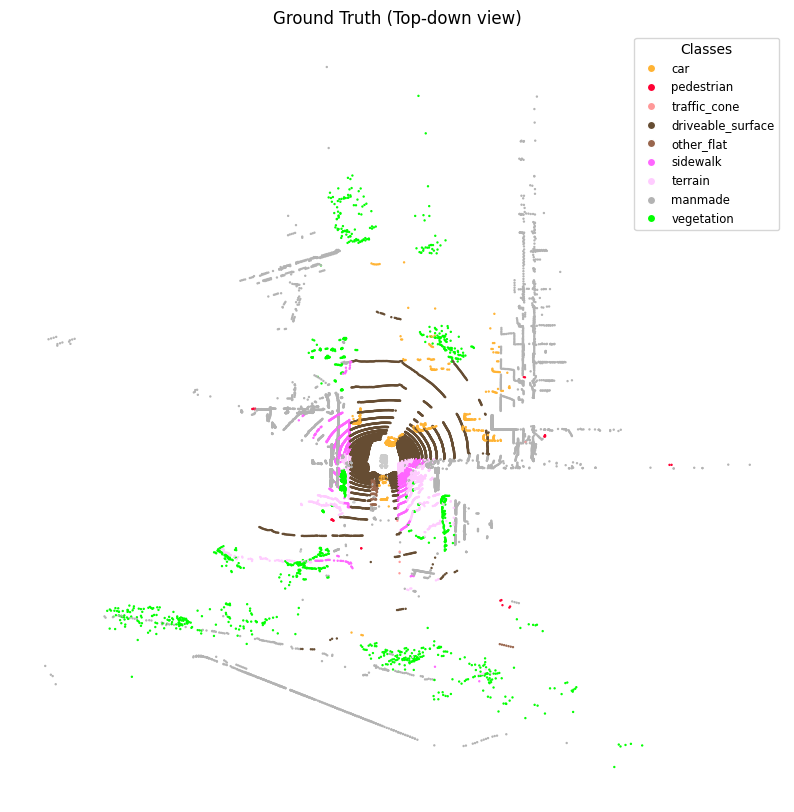

In [ ]:
visualize_pointcloud_prediction(gt_coord, gt_segment, gt_segment_colors, class_names=names, title="Ground Truth (Top-down view)", save_path=None)

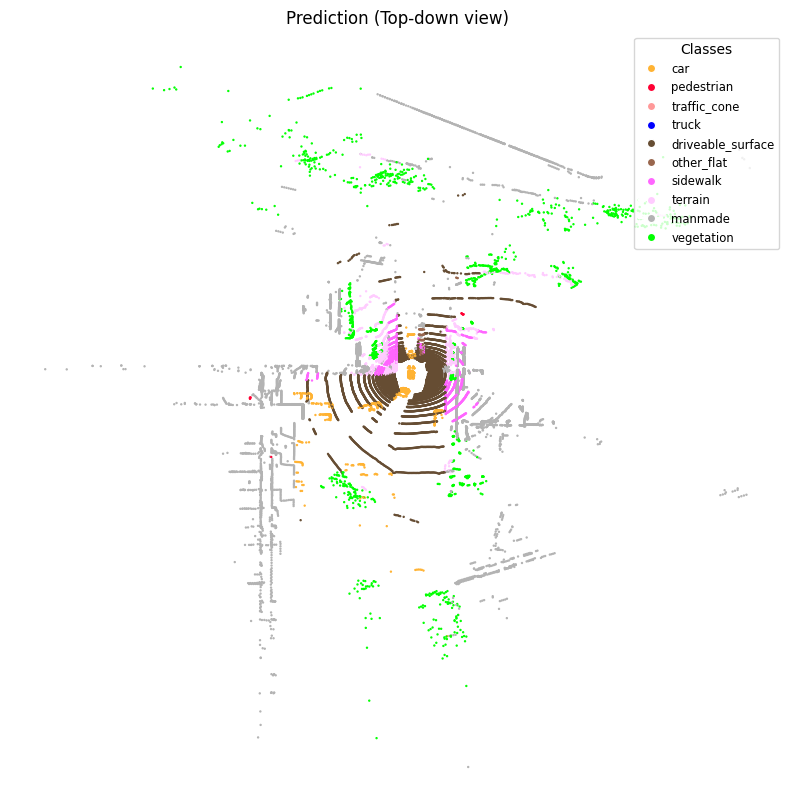

In [ ]:
visualize_pointcloud_prediction(frame_coord, pred_segment, pred_segment_colors, class_names=names, title="Prediction (Top-down view)", save_path=None)


In [ ]:
a = [1, 2, 3, 4, 5]

def get_scene(scene=[2, 3]):
    for idx, i in enumerate(a):
        if idx in scene:
            print(i)

In [ ]:
get_scene(scene=[1,4])

2
5
